## PURPOSE OF THE NOTEBOOK
This notebook is dedicated to the spatial statistics and analysis of cell types previously identified. Among the most important tasks in this notebook we find the definition of spatial relations between cell types, the definition of a tissue structure score (TSS) and the calculation of coocurrence scores

# Import all libraries needed

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')
import squidpy as sq
import scanpy as sc
import os 
import seaborn as sns
from scipy.stats import entropy
from utag import utag

## We also define extra functions

In [ ]:
def draw_network(
    adata,
    node_key: str = 'UTAG Label',
    adjacency_matrix_key: str = 'UTAG Label_domain_adjacency_matrix',
    figsize: tuple = (11,11),
    dpi: int = 200,
    font_size: int = 12,
    node_size_min: int = 1000,
    node_size_max: int = 3000,
    edge_weight: float = 5,
    edge_weight_baseline: float = 1,
    log_transform: bool = True,
    ax = None
):
    import networkx as nx
    import matplotlib
    sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    s1 = adata.obs.groupby(node_key).count()
    s1 = s1[s1.columns[0]]
    node_size = s1.values
    node_size = (node_size - node_size.min()) / (node_size.max() - node_size.min()) * (node_size_max - node_size_min) + node_size_min
    
    if ax == None:
        fig = plt.figure(figsize = figsize, dpi = dpi)
    G = nx.from_numpy_matrix(np.matrix(adata.uns[adjacency_matrix_key]), create_using=nx.Graph)
    G = nx.relabel.relabel_nodes(G, {i: label for i, label in enumerate(adata.uns[adjacency_matrix_key].index)})
    
    edges, weights = zip(*nx.get_edge_attributes(G,'weight').items())
    
    weights = np.array(list(weights))
    weights = (weights - weights.min()) / (weights.max() - weights.min()) * edge_weight + edge_weight_baseline
    
    if log_transform:
        weights = np.log(np.array(list(weights))+1)
    else:
        weights = np.array(list(weights))
        
    weights = tuple(weights.tolist())
    
    #pos = nx.spectral_layout(G, weight = 'weight')
    pos = nx.spring_layout(G, weight = 'weight', seed = 42, k = 0.7)
    
    if ax:
        nx.draw(G, pos, node_color='w', edgelist=edges, edge_color=weights, width=weights, edge_cmap=plt.cm.Reds, with_labels=True, font_size = font_size, node_size = node_size, ax = ax)
    else:
        nx.draw(G, pos, node_color='w', edgelist=edges, edge_color=weights, width=weights, edge_cmap=plt.cm.Reds, with_labels=True, font_size = font_size, node_size = node_size)

    if ax == None:
        ax = plt.gca()
    
    color_key = node_key + '_colors'
    if color_key in adata.uns:
        ax.collections[0].set_edgecolor(adata.uns[color_key])
        ax.collections[0].set_facecolor(adata.uns[color_key])
    else:
        ax.collections[0].set_edgecolor('lightgray')
    ax.collections[0].set_linewidth(3)
    ax.set_xlim([1.3*x for x in ax.get_xlim()])
    ax.set_ylim([1*y for y in ax.get_ylim()])
    
    if ax == None:
        return fig
# new binning function using neighbors

def format_data_radius(adata,sname,condit,radius=10):
    adata.obsm["spatial"]=np.array([adata.obs.X,adata.obs.Y]).transpose().astype('float64')
    adata_copy_int=adata
    sq.gr.spatial_neighbors(adata_copy_int,radius=radius)
    result=np.zeros([adata.shape[0],len(adata_copy_int.obs[sname].unique())])
    n=0
    tr=adata_copy_int.obsp['spatial_distances'].transpose()
    tr2=tr>0
    from tqdm import tqdm
    for g in tqdm(adata_copy_int.obs[sname].unique()):
        epv=adata_copy_int.obs[sname]==g*1
        opv=list(epv*1)
        result[:,n]=tr2.dot(opv)
        n=n+1
    expmat=pd.DataFrame(result,columns=adata_copy_int.obs[sname].unique())
    adata1=sc.AnnData(expmat,obs=adata.obs)
    adata1.obs['sample']=condit
    adata1.obs['condition']=condit
    return adata1

# Read objects

We define the main path where files are stored

In [3]:
general_path='/media/sergio/GBX/GBmap samples'
global_path=general_path+'ISS_samples/'

adata, generated in STEP_1 is read

In [4]:
adata=sc.read(general_path+'/ISS_global_analysis/all_samples_with_colors.h5ad')

# Plotting individual maps of cell types

In [ ]:
sc.set_figure_params(scanpy=True, dpi=600, dpi_save=600, frameon=False, vector_friendly=True, fontsize=7, figsize=(15,15), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
for s in adata.obs['sample'].unique():
    adatasub=adata[adata.obs['sample']==s]
    sc.pl.spatial(adatasub,spot_size=70,color='level3',title=s,show=False)
    plt.savefig('/media/sergio/GBX/GBmap samples/ISS_analysis_10samples/maps/'+str(s)+'_map_level3.pdf')
    plt.show()

In [ ]:
sc.set_figure_params(scanpy=True, dpi=600, dpi_save=600, frameon=False, vector_friendly=True, fontsize=7, figsize=(15,15), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
for s in adata.obs['sample'].unique():
    adatasub=adata[adata.obs['sample']==s]
    sc.pl.spatial(adatasub,spot_size=70,color='level4',title=s,show=False)
    plt.savefig('/media/sergio/GBX/GBmap samples/ISS_analysis_10samples/maps/'+str(s)+'_map_level4.pdf')
    plt.show()

In [4]:
for s in adata.obs['sample'].unique():
    adatasub=adata[adata.obs['sample']==s]
    adatasub.obs.to_csv('/media/sergio/GBX/GBmap samples/ISS_analysis_10samples/csvs/celltypes_'+s+'.csv')

# Neighborhood enrichment 

We will use 124 for nhood enrichment, which correspond to 40 um

In [5]:
anndata_list = []
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    sq.gr.spatial_neighbors(adata_copy_int,radius=124,coord_type = 'generic')
    anndata_list.append(adata_copy_int)
ad_sp_concat = sc.concat(anndata_list, pairwise=True)
ad_sp_concat.uns=adata.uns

We will first generate neighborhood enrichment scores considering the level3 annotation

In [6]:
level='level3'
nenrich=sq.gr.nhood_enrichment(ad_sp_concat, cluster_key=level,copy = True)
sq.gr.nhood_enrichment(ad_sp_concat, cluster_key=level)
ad_sp_concat.uns[level+'_nhood_enrichment']['zscore']=np.array(pd.DataFrame(ad_sp_concat.uns[level+'_nhood_enrichment']['zscore']).fillna(0))

100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:49<00:00,  9.17/s]


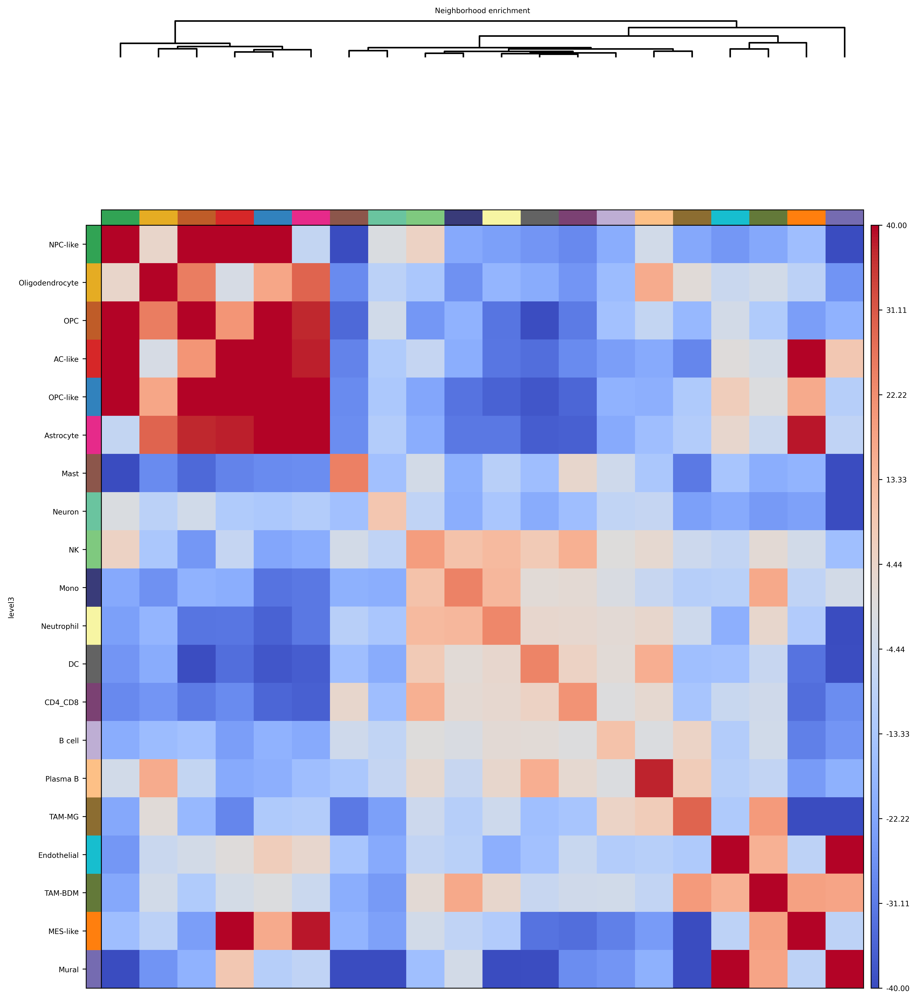

In [70]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=7, figsize=(8,8), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sq.pl.nhood_enrichment(ad_sp_concat, cluster_key=level, method="ward",mode='zscore',vmax=40,vmin=-40,cmap='coolwarm',show=False)
plt.savefig(general_path+'/ISS_global_analysis/global_nhood_enrichment_'+level+'.pdf')

## We next test the reproducibility of nhood scores across different samples

In [ ]:
level='level3'
nu=0
allmat=np.zeros([len(np.unique(ad_sp_concat.obs[level])),len(np.unique(ad_sp_concat.obs[level])),len(ad_sp_concat.obs['sample'].unique())])
for samp in ad_sp_concat.obs['sample'].unique():
    adsu=ad_sp_concat[ad_sp_concat.obs['sample']==samp]
    nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
    sq.gr.nhood_enrichment(adsu, cluster_key=level)
    adsu.uns['level3_nhood_enrichment']['zscore']=np.matrix(pd.DataFrame(adsu.uns['level3_nhood_enrichment']['zscore']).fillna(0))
    allmat[:,:,nu]=nenrichsub[0]
    sq.pl.nhood_enrichment(adsu, cluster_key=level, method="ward",mode='zscore',vmax=20,vmin=-20,cmap='coolwarm',show=False)
    plt.title(samp)
    plt.savefig(general_path+'/ISS_global_analysis/'+samp+'_nhood_enrichment_'+level+'.pdf')
    nu=nu+1

In [16]:
grouped_cells=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs['sample']))
for gr in range(0,allmat.shape[0]):
    for smp in range(0,allmat.shape[2]):
        grouped_cells.iloc[gr,smp]=allmat[gr,gr,smp]

## Next, the scores autoenirchment scores with itself are plotted across samples and cell types. 
This scores represent how spatially clustered are different cell types

  3%|██▏                                                                              | 27/1000 [06:27<3:52:59, 14.37s/]


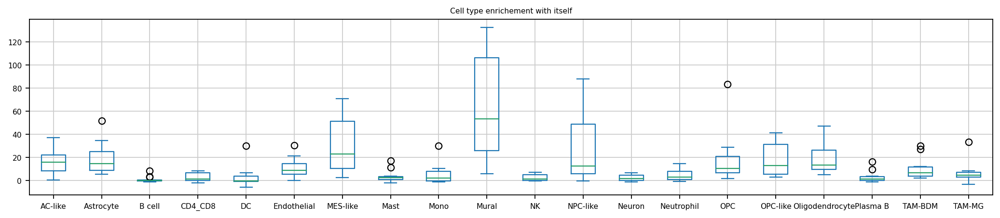

In [124]:
grouped_cells.transpose().plot(kind='box',figsize=(16,3))
plt.title('Cell type enrichement with itself')
plt.savefig(general_path+'/ISS_global_analysis/Boxplot_self_enrichment_celltype_'+level+'.pdf')

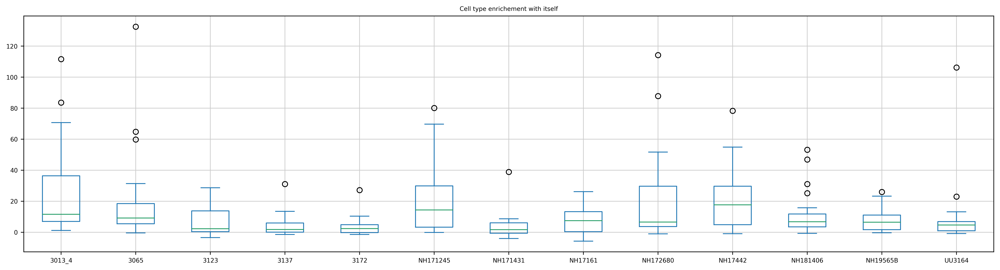

In [75]:
grouped_cells.plot(kind='box',figsize=(20,5))
plt.title('Cell type enrichement with itself')
plt.savefig(general_path+'/ISS_global_analysis/Boxplot_self_enrichment_sample_'+level+'.pdf')

### Following this, we check check how the autoenrichment scores of different cell types relate with the sample-specific organization scores

In [ ]:
organization_influence=pd.DataFrame(index=grouped_cells.index,columns=['correlation','correlation_sum'])

In [ ]:
for i in grouped_cells.index:
    gs=grouped_cells.loc[i,:]
    gns=np.mean(grouped_cells.loc[~grouped_cells.index.isin([i]),:],axis=0)
    organization_influence.loc[i,'correlation']=np.corrcoef(list(gs),list(gns))[0,1]

In [48]:
organization_influence=pd.DataFrame(index=grouped_cells.index,columns=[''])
for i in grouped_cells.index:
    level='level3'
    nu=0
    numb=[]
    ad_sp_concat_sub=ad_sp_concat[ad_sp_concat.obs['level3']!=i][:]
    allmat=np.zeros([len(np.unique(ad_sp_concat_sub.obs[level])),len(np.unique(ad_sp_concat_sub.obs[level])),len(ad_sp_concat_sub.obs['sample'].unique())])
    for samp in ad_sp_concat_sub.obs['sample'].unique():
        adsu2=ad_sp_concat[ad_sp_concat.obs['sample']==samp]
        numb.append(np.sum(adsu2.obs['level3']==i))
        adsu=ad_sp_concat_sub[ad_sp_concat_sub.obs['sample']==samp]
        nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
        #sq.gr.nhood_enrichment(adsu, cluster_key=level)
        #adsu.uns['level3_nhood_enrichment']['zscore']=np.matrix(pd.DataFrame(adsu.uns['level3_nhood_enrichment']['zscore']).fillna(0))
        allmat[:,:,nu]=nenrichsub[0]
        nu=nu+1
    grouped_cells2=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs['sample']))
    for gr in range(0,allmat.shape[0]):
        for smp in range(0,allmat.shape[2]):
            grouped_cells2.iloc[gr,smp]=allmat[gr,gr,smp]
    gs=grouped_cells.loc[i,:]
    gns=np.mean(grouped_cells2.loc[:,:],axis=0)
    organization_influence.loc[i,'correlation']=np.corrcoef(list(gs),list(gns))[0,1]
    organization_influence.loc[i,'correlation_num']=np.corrcoef(list(numb),list(gns))[0,1]
    print(organization_influence.loc[i,'correlation_num'])
    print(i)



  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:56,  5.65/s]

  1%|▌                                                                                   | 6/1000 [00:00<00:40, 24.50/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:30, 32.23/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:28, 34.21/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:27, 35.05/s]

  2%|█▉                                                                                 | 23/1000 [00:00<00:32, 30.50/s]

  3%|██▏                                                                                | 27/1000 [00:00<00:35, 27.04/s]

  3%|██▍              

 16%|████████████▊                                                                     | 156/1000 [00:08<00:30, 28.05/s]

 16%|█████████████                                                                     | 159/1000 [00:08<00:34, 24.41/s]

 16%|█████████████▎                                                                    | 162/1000 [00:08<00:34, 24.09/s]

 16%|█████████████▌                                                                    | 165/1000 [00:08<00:34, 23.87/s]

 17%|█████████████▊                                                                    | 168/1000 [00:08<00:34, 23.81/s]

 17%|██████████████                                                                    | 172/1000 [00:09<00:31, 26.03/s]

 18%|██████████████▎                                                                   | 175/1000 [00:09<00:32, 25.30/s]

 18%|██████████████▌                                                                   | 178/1000 [00:09<00:33, 24.73/s]

 18%|██████████████▊    

 47%|██████████████████████████████████████▌                                           | 470/1000 [00:05<00:05, 93.89/s]

 48%|███████████████████████████████████████▎                                          | 480/1000 [00:05<00:05, 93.87/s]

 49%|████████████████████████████████████████▎                                         | 492/1000 [00:05<00:05, 99.54/s]

 50%|█████████████████████████████████████████▏                                        | 502/1000 [00:05<00:05, 96.01/s]

 51%|█████████████████████████████████████████▉                                        | 512/1000 [00:05<00:05, 95.82/s]

 52%|██████████████████████████████████████████▊                                       | 522/1000 [00:05<00:05, 95.54/s]

 53%|███████████████████████████████████████████▌                                      | 532/1000 [00:05<00:05, 93.43/s]

 54%|████████████████████████████████████████████▌                                     | 543/1000 [00:05<00:04, 96.85/s]

 56%|███████████████████

 24%|███████████████████▊                                                             | 244/1000 [00:03<00:07, 104.46/s]

 26%|████████████████████▋                                                            | 255/1000 [00:03<00:07, 103.23/s]

 27%|█████████████████████▊                                                            | 266/1000 [00:03<00:07, 99.85/s]

 28%|██████████████████████▋                                                           | 277/1000 [00:03<00:07, 94.04/s]

 29%|███████████████████████▌                                                          | 287/1000 [00:03<00:08, 80.22/s]

 30%|████████████████████████▎                                                         | 296/1000 [00:03<00:09, 72.87/s]

 30%|████████████████████████▉                                                         | 304/1000 [00:03<00:10, 64.73/s]

 31%|█████████████████████████▌                                                        | 311/1000 [00:04<00:10, 63.29/s]

 32%|███████████████████

 66%|█████████████████████████████████████████████████████▍                           | 659/1000 [00:04<00:02, 157.19/s]

 68%|██████████████████████████████████████████████████████▋                          | 675/1000 [00:04<00:02, 156.87/s]

 69%|███████████████████████████████████████████████████████▉                         | 691/1000 [00:04<00:01, 156.42/s]

 71%|█████████████████████████████████████████████████████████▎                       | 707/1000 [00:04<00:01, 156.98/s]

 72%|██████████████████████████████████████████████████████████▌                      | 723/1000 [00:04<00:01, 157.51/s]

 74%|███████████████████████████████████████████████████████████▊                     | 739/1000 [00:04<00:01, 157.51/s]

 76%|█████████████████████████████████████████████████████████████▏                   | 755/1000 [00:04<00:01, 158.10/s]

 77%|██████████████████████████████████████████████████████████████▍                  | 771/1000 [00:05<00:01, 157.83/s]

 79%|███████████████████

  0%|                                                                                    | 1/1000 [00:00<02:40,  6.23/s]

  0%|▎                                                                                   | 4/1000 [00:00<00:59, 16.76/s]

  1%|▊                                                                                   | 9/1000 [00:00<00:33, 29.18/s]

  2%|█▎                                                                                 | 16/1000 [00:00<00:23, 42.36/s]

  2%|█▋                                                                                 | 21/1000 [00:00<00:22, 44.04/s]

  3%|██▏                                                                                | 26/1000 [00:00<00:22, 44.21/s]

  3%|██▌                                                                                | 31/1000 [00:00<00:24, 39.51/s]

  4%|██▉                                                                                | 36/1000 [00:01<00:24, 39.90/s]

  4%|███▍               

  3%|██▏                                                                               | 26/1000 [00:00<00:07, 133.55/s]

  5%|████▍                                                                             | 54/1000 [00:00<00:04, 195.59/s]

  8%|██████▉                                                                           | 84/1000 [00:00<00:03, 233.32/s]

 11%|█████████                                                                        | 112/1000 [00:00<00:03, 248.92/s]

 14%|███████████▏                                                                     | 138/1000 [00:00<00:03, 251.92/s]

 17%|██████████████                                                                   | 174/1000 [00:00<00:02, 285.25/s]

 20%|████████████████▌                                                                | 205/1000 [00:00<00:02, 291.92/s]

 24%|███████████████████                                                              | 235/1000 [00:00<00:02, 286.64/s]

 26%|███████████████████

 12%|█████████▍                                                                       | 116/1000 [00:00<00:06, 135.19/s]

 13%|██████████▌                                                                      | 130/1000 [00:01<00:06, 135.16/s]

 14%|███████████▋                                                                     | 144/1000 [00:01<00:06, 132.41/s]

 16%|████████████▊                                                                    | 158/1000 [00:01<00:06, 132.24/s]

 17%|██████████████                                                                   | 173/1000 [00:01<00:06, 136.38/s]

 19%|███████████████▏                                                                 | 188/1000 [00:01<00:05, 139.00/s]

 20%|████████████████▍                                                                | 203/1000 [00:01<00:05, 140.73/s]

 22%|█████████████████▋                                                               | 218/1000 [00:01<00:05, 136.93/s]

 23%|██████████████████▊

0.7241611960976645
AC-like




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:50,  5.87/s]

  0%|▍                                                                                   | 5/1000 [00:00<00:49, 19.92/s]

  1%|▊                                                                                   | 9/1000 [00:00<00:37, 26.11/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:37, 26.31/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:37, 26.29/s]

  2%|█▍                                                                                 | 18/1000 [00:00<00:37, 26.34/s]

  2%|█▋                                                                                 | 21/1000 [00:00<00:37, 26.32/s]

  2%|█▉               

 22%|█████████████████▉                                                                | 219/1000 [00:07<00:25, 31.02/s]

 22%|██████████████████▎                                                               | 223/1000 [00:08<00:26, 29.54/s]

 23%|██████████████████▌                                                               | 226/1000 [00:08<00:27, 28.59/s]

 23%|██████████████████▊                                                               | 230/1000 [00:08<00:25, 30.45/s]

 23%|███████████████████▏                                                              | 234/1000 [00:08<00:25, 30.38/s]

 24%|███████████████████▌                                                              | 238/1000 [00:08<00:25, 30.40/s]

 24%|███████████████████▊                                                              | 242/1000 [00:08<00:24, 30.48/s]

 25%|████████████████████▏                                                             | 246/1000 [00:08<00:24, 30.44/s]

 25%|███████████████████

 36%|█████████████████████████████▏                                                   | 360/1000 [00:04<00:06, 101.02/s]

 37%|██████████████████████████████▍                                                   | 371/1000 [00:04<00:06, 98.49/s]

 38%|███████████████████████████████▏                                                  | 381/1000 [00:04<00:06, 89.71/s]

 39%|████████████████████████████████                                                  | 391/1000 [00:04<00:06, 89.74/s]

 40%|████████████████████████████████▉                                                 | 401/1000 [00:04<00:06, 92.05/s]

 41%|█████████████████████████████████▋                                                | 411/1000 [00:04<00:06, 93.91/s]

 42%|██████████████████████████████████▌                                               | 422/1000 [00:04<00:05, 97.36/s]

 43%|███████████████████████████████████▍                                              | 432/1000 [00:04<00:05, 97.54/s]

 44%|███████████████████

 11%|█████████▎                                                                        | 113/1000 [00:01<00:12, 71.33/s]

 12%|█████████▉                                                                        | 121/1000 [00:01<00:12, 70.99/s]

 13%|██████████▌                                                                       | 129/1000 [00:01<00:12, 71.33/s]

 14%|███████████▏                                                                      | 137/1000 [00:01<00:12, 71.83/s]

 14%|███████████▉                                                                      | 145/1000 [00:02<00:12, 69.44/s]

 15%|████████████▍                                                                     | 152/1000 [00:02<00:13, 63.31/s]

 16%|█████████████                                                                     | 159/1000 [00:02<00:13, 62.44/s]

 17%|█████████████▌                                                                    | 166/1000 [00:02<00:13, 63.56/s]

 17%|██████████████▏    

 37%|█████████████████████████████▋                                                   | 366/1000 [00:02<00:04, 153.52/s]

 38%|██████████████████████████████▉                                                  | 382/1000 [00:02<00:04, 154.13/s]

 40%|████████████████████████████████▏                                                | 398/1000 [00:02<00:03, 154.66/s]

 41%|█████████████████████████████████▌                                               | 414/1000 [00:02<00:03, 154.87/s]

 43%|██████████████████████████████████▊                                              | 430/1000 [00:02<00:03, 155.50/s]

 45%|████████████████████████████████████▏                                            | 446/1000 [00:03<00:03, 156.02/s]

 46%|█████████████████████████████████████▍                                           | 462/1000 [00:03<00:03, 156.06/s]

 48%|██████████████████████████████████████▋                                          | 478/1000 [00:03<00:03, 155.39/s]

 49%|███████████████████

 25%|████████████████████▍                                                            | 252/1000 [00:02<00:07, 101.87/s]

 26%|█████████████████████▎                                                           | 263/1000 [00:02<00:07, 103.51/s]

 27%|██████████████████████▏                                                          | 274/1000 [00:02<00:07, 102.03/s]

 28%|███████████████████████▎                                                          | 285/1000 [00:02<00:07, 97.95/s]

 30%|████████████████████████▏                                                         | 295/1000 [00:03<00:07, 92.46/s]

 30%|█████████████████████████                                                         | 305/1000 [00:03<00:07, 91.91/s]

 32%|█████████████████████████▊                                                        | 315/1000 [00:03<00:07, 92.25/s]

 33%|██████████████████████████▊                                                       | 327/1000 [00:03<00:06, 99.88/s]

 34%|███████████████████

 14%|███████████▋                                                                      | 143/1000 [00:05<00:23, 35.78/s]

 15%|████████████▏                                                                     | 148/1000 [00:05<00:22, 38.05/s]

 15%|████████████▍                                                                     | 152/1000 [00:05<00:22, 37.17/s]

 16%|████████████▊                                                                     | 156/1000 [00:05<00:23, 36.46/s]

 16%|█████████████                                                                     | 160/1000 [00:06<00:25, 33.46/s]

 16%|█████████████▍                                                                    | 164/1000 [00:06<00:25, 32.65/s]

 17%|█████████████▊                                                                    | 168/1000 [00:06<00:24, 33.31/s]

 17%|██████████████                                                                    | 172/1000 [00:06<00:25, 32.51/s]

 18%|██████████████▍    

 35%|████████████████████████████▏                                                    | 348/1000 [00:01<00:02, 228.87/s]

 37%|██████████████████████████████▏                                                  | 372/1000 [00:01<00:02, 214.86/s]

 39%|███████████████████████████████▉                                                 | 394/1000 [00:01<00:02, 203.99/s]

 42%|█████████████████████████████████▌                                               | 415/1000 [00:02<00:02, 202.31/s]

 44%|███████████████████████████████████▎                                             | 436/1000 [00:02<00:02, 192.75/s]

 46%|████████████████████████████████████▉                                            | 456/1000 [00:02<00:02, 186.72/s]

 48%|██████████████████████████████████████▍                                          | 475/1000 [00:02<00:02, 182.96/s]

 49%|████████████████████████████████████████                                         | 494/1000 [00:02<00:02, 175.53/s]

 51%|███████████████████

0.8044267184092252
Astrocyte




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:53,  5.74/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:28, 11.21/s]

  1%|▌                                                                                   | 6/1000 [00:00<00:58, 17.04/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:59, 16.79/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:47, 20.64/s]

  1%|█▏                                                                                 | 14/1000 [00:00<00:47, 20.83/s]

  2%|█▍                                                                                 | 17/1000 [00:00<00:46, 21.04/s]

  2%|█▋               

 25%|████████████████████▎                                                             | 247/1000 [00:07<00:15, 47.86/s]

 25%|████████████████████▋                                                             | 253/1000 [00:07<00:15, 49.11/s]

 26%|█████████████████████▎                                                            | 260/1000 [00:08<00:14, 52.78/s]

 27%|█████████████████████▊                                                            | 266/1000 [00:08<00:13, 52.64/s]

 28%|██████████████████████▌                                                           | 275/1000 [00:08<00:12, 60.25/s]

 28%|███████████████████████                                                           | 282/1000 [00:08<00:11, 60.53/s]

 29%|███████████████████████▊                                                          | 291/1000 [00:08<00:10, 65.93/s]

 30%|████████████████████████▍                                                         | 298/1000 [00:08<00:11, 61.56/s]

 30%|███████████████████

 26%|█████████████████████▍                                                            | 261/1000 [00:03<00:08, 84.95/s]

 27%|██████████████████████▏                                                           | 270/1000 [00:03<00:08, 85.83/s]

 28%|██████████████████████▉                                                           | 279/1000 [00:03<00:08, 83.58/s]

 29%|███████████████████████▌                                                          | 288/1000 [00:03<00:08, 82.42/s]

 30%|████████████████████████▎                                                         | 297/1000 [00:04<00:08, 78.34/s]

 31%|█████████████████████████                                                         | 306/1000 [00:04<00:08, 80.74/s]

 32%|█████████████████████████▉                                                        | 316/1000 [00:04<00:08, 85.43/s]

 33%|██████████████████████████▋                                                       | 326/1000 [00:04<00:07, 89.28/s]

 34%|███████████████████

  7%|█████▊                                                                             | 70/1000 [00:01<00:14, 63.64/s]

  8%|██████▋                                                                            | 80/1000 [00:01<00:12, 73.12/s]

  9%|███████▎                                                                           | 88/1000 [00:01<00:12, 74.33/s]

 10%|███████▉                                                                           | 96/1000 [00:01<00:12, 70.51/s]

 10%|████████▌                                                                         | 104/1000 [00:01<00:12, 71.34/s]

 11%|█████████▏                                                                        | 112/1000 [00:01<00:12, 70.30/s]

 12%|█████████▊                                                                        | 120/1000 [00:01<00:12, 68.71/s]

 13%|██████████▍                                                                       | 127/1000 [00:02<00:13, 66.75/s]

 13%|██████████▉        

 69%|███████████████████████████████████████████████████████▋                         | 688/1000 [00:01<00:00, 445.78/s]

 74%|███████████████████████████████████████████████████████████▌                     | 736/1000 [00:01<00:00, 453.98/s]

 78%|███████████████████████████████████████████████████████████████▍                 | 783/1000 [00:01<00:00, 456.54/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 498.75/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:17,  7.28/s]

  2%|█▍                                                                                 | 18/1000 [00:00<00:10, 90.01/s]

  4%|███▏                                                                              | 39/1000 [00:00<00:06, 139.46/s]

  6%|████▊             

 14%|███████████▍                                                                      | 139/1000 [00:02<00:11, 77.14/s]

 15%|████████████▏                                                                     | 149/1000 [00:02<00:10, 82.78/s]

 16%|█████████████                                                                     | 160/1000 [00:02<00:09, 89.67/s]

 17%|█████████████▊                                                                    | 169/1000 [00:02<00:09, 87.51/s]

 18%|██████████████▌                                                                   | 178/1000 [00:02<00:09, 84.15/s]

 19%|███████████████▎                                                                  | 187/1000 [00:02<00:09, 81.95/s]

 20%|████████████████                                                                  | 196/1000 [00:02<00:09, 83.13/s]

 20%|████████████████▊                                                                 | 205/1000 [00:02<00:09, 81.07/s]

 21%|█████████████████▌ 

 23%|██████████████████▊                                                               | 229/1000 [00:04<00:23, 32.76/s]

 23%|███████████████████                                                               | 233/1000 [00:04<00:23, 32.15/s]

 24%|███████████████████▍                                                              | 237/1000 [00:05<00:23, 32.90/s]

 24%|███████████████████▊                                                              | 241/1000 [00:05<00:23, 32.25/s]

 24%|████████████████████                                                              | 245/1000 [00:05<00:23, 31.80/s]

 25%|████████████████████▍                                                             | 249/1000 [00:05<00:23, 31.54/s]

 25%|████████████████████▋                                                             | 253/1000 [00:05<00:22, 33.00/s]

 26%|█████████████████████                                                             | 257/1000 [00:05<00:22, 33.50/s]

 26%|███████████████████

 12%|█████████▌                                                                       | 118/1000 [00:00<00:05, 173.75/s]

 14%|███████████                                                                      | 136/1000 [00:00<00:05, 170.59/s]

 15%|████████████▍                                                                    | 154/1000 [00:01<00:05, 166.37/s]

 17%|██████████████                                                                   | 173/1000 [00:01<00:04, 172.25/s]

 19%|███████████████▍                                                                 | 191/1000 [00:01<00:04, 167.76/s]

 21%|████████████████▊                                                                | 208/1000 [00:01<00:04, 165.22/s]

 22%|██████████████████▏                                                              | 225/1000 [00:01<00:04, 163.47/s]

 24%|███████████████████▌                                                             | 242/1000 [00:01<00:04, 160.60/s]

 26%|███████████████████

0.6723595621066926
B cell




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:57,  5.62/s]

  1%|▌                                                                                   | 7/1000 [00:00<00:35, 27.91/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:31, 30.95/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:30, 32.68/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:30, 32.10/s]

  2%|█▉                                                                                 | 23/1000 [00:00<00:29, 33.26/s]

  3%|██▏                                                                                | 27/1000 [00:00<00:31, 31.02/s]

  3%|██▌              

 33%|██████████████████████████▋                                                       | 326/1000 [00:07<00:21, 30.97/s]

 33%|███████████████████████████                                                       | 330/1000 [00:07<00:21, 30.99/s]

 33%|███████████████████████████▍                                                      | 334/1000 [00:08<00:26, 25.41/s]

 34%|███████████████████████████▋                                                      | 337/1000 [00:08<00:25, 25.74/s]

 34%|███████████████████████████▉                                                      | 340/1000 [00:08<00:26, 25.07/s]

 34%|████████████████████████████▎                                                     | 345/1000 [00:08<00:21, 30.10/s]

 35%|████████████████████████████▌                                                     | 349/1000 [00:08<00:20, 31.23/s]

 35%|████████████████████████████▉                                                     | 353/1000 [00:08<00:19, 32.47/s]

 36%|███████████████████

 39%|███████████████████████████████▌                                                 | 389/1000 [00:04<00:05, 107.68/s]

 40%|████████████████████████████████▍                                                | 400/1000 [00:04<00:05, 106.20/s]

 41%|█████████████████████████████████▌                                               | 414/1000 [00:04<00:05, 113.21/s]

 43%|██████████████████████████████████▌                                              | 426/1000 [00:04<00:05, 110.15/s]

 44%|███████████████████████████████████▍                                             | 438/1000 [00:04<00:05, 105.83/s]

 45%|████████████████████████████████████▎                                            | 449/1000 [00:04<00:05, 102.30/s]

 46%|█████████████████████████████████████▋                                            | 460/1000 [00:05<00:05, 99.59/s]

 47%|██████████████████████████████████████▌                                           | 470/1000 [00:05<00:05, 93.12/s]

 48%|███████████████████

 11%|█████████▏                                                                        | 112/1000 [00:02<00:13, 63.56/s]

 12%|█████████▊                                                                        | 119/1000 [00:02<00:13, 63.56/s]

 13%|██████████▍                                                                       | 127/1000 [00:02<00:12, 68.02/s]

 13%|██████████▉                                                                       | 134/1000 [00:02<00:12, 68.55/s]

 14%|███████████▌                                                                      | 141/1000 [00:02<00:12, 68.90/s]

 15%|████████████▎                                                                     | 150/1000 [00:02<00:11, 74.93/s]

 16%|████████████▉                                                                     | 158/1000 [00:02<00:11, 74.29/s]

 17%|█████████████▋                                                                    | 167/1000 [00:02<00:10, 77.95/s]

 18%|██████████████▎    

 37%|█████████████████████████████▊                                                   | 368/1000 [00:02<00:04, 149.94/s]

 38%|███████████████████████████████▏                                                 | 385/1000 [00:02<00:04, 153.32/s]

 40%|████████████████████████████████▌                                                | 402/1000 [00:02<00:03, 155.72/s]

 42%|█████████████████████████████████▊                                               | 418/1000 [00:02<00:03, 156.14/s]

 43%|███████████████████████████████████▏                                             | 434/1000 [00:02<00:03, 156.91/s]

 45%|████████████████████████████████████▌                                            | 451/1000 [00:03<00:03, 158.52/s]

 47%|█████████████████████████████████████▉                                           | 468/1000 [00:03<00:03, 159.28/s]

 48%|███████████████████████████████████████▏                                         | 484/1000 [00:03<00:03, 159.16/s]

 50%|███████████████████

 24%|███████████████████▊                                                              | 241/1000 [00:02<00:07, 99.20/s]

 25%|████████████████████▌                                                             | 251/1000 [00:02<00:07, 97.13/s]

 26%|█████████████████████▍                                                            | 261/1000 [00:03<00:07, 93.43/s]

 27%|██████████████████████▏                                                           | 271/1000 [00:03<00:07, 92.07/s]

 28%|███████████████████████                                                           | 281/1000 [00:03<00:08, 89.07/s]

 29%|███████████████████████▊                                                          | 290/1000 [00:03<00:08, 86.48/s]

 30%|████████████████████████▌                                                         | 300/1000 [00:03<00:07, 89.32/s]

 31%|█████████████████████████▎                                                        | 309/1000 [00:03<00:07, 86.65/s]

 32%|███████████████████

 20%|███████████████▉                                                                  | 195/1000 [00:05<00:17, 45.03/s]

 20%|████████████████▍                                                                 | 200/1000 [00:05<00:18, 43.38/s]

 20%|████████████████▊                                                                 | 205/1000 [00:06<00:19, 40.53/s]

 21%|█████████████████▏                                                                | 210/1000 [00:06<00:18, 41.64/s]

 22%|█████████████████▋                                                                | 215/1000 [00:06<00:19, 39.54/s]

 22%|██████████████████                                                                | 220/1000 [00:06<00:20, 37.31/s]

 22%|██████████████████▎                                                               | 224/1000 [00:06<00:22, 34.50/s]

 23%|██████████████████▋                                                               | 228/1000 [00:06<00:22, 34.68/s]

 23%|███████████████████

 29%|███████████████████████▍                                                         | 290/1000 [00:01<00:04, 166.09/s]

 31%|████████████████████████▊                                                        | 307/1000 [00:01<00:04, 163.86/s]

 32%|██████████████████████████▏                                                      | 324/1000 [00:02<00:04, 165.39/s]

 34%|███████████████████████████▌                                                     | 341/1000 [00:02<00:04, 160.43/s]

 36%|█████████████████████████████                                                    | 359/1000 [00:02<00:03, 165.94/s]

 38%|██████████████████████████████▍                                                  | 376/1000 [00:02<00:03, 164.61/s]

 40%|███████████████████████████████▉                                                 | 395/1000 [00:02<00:03, 171.32/s]

 42%|█████████████████████████████████▋                                               | 416/1000 [00:02<00:03, 182.25/s]

 44%|███████████████████

0.6908376181038943
CD4_CD8




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:49,  5.90/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:15,  7.38/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:03, 15.56/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:49, 19.96/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:46, 21.43/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:37, 26.25/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:33, 29.52/s]

  2%|█▉               

 24%|███████████████████▌                                                              | 238/1000 [00:07<00:24, 30.91/s]

 24%|███████████████████▊                                                              | 242/1000 [00:07<00:23, 32.57/s]

 25%|████████████████████▏                                                             | 246/1000 [00:08<00:22, 33.81/s]

 25%|████████████████████▌                                                             | 250/1000 [00:08<00:23, 31.85/s]

 25%|████████████████████▊                                                             | 254/1000 [00:08<00:24, 30.70/s]

 26%|█████████████████████▏                                                            | 258/1000 [00:08<00:23, 31.05/s]

 26%|█████████████████████▍                                                            | 262/1000 [00:08<00:24, 30.22/s]

 27%|█████████████████████▊                                                            | 266/1000 [00:08<00:23, 30.72/s]

 27%|███████████████████

 43%|███████████████████████████████████▌                                              | 433/1000 [00:04<00:06, 85.00/s]

 44%|████████████████████████████████████▎                                             | 443/1000 [00:04<00:06, 87.98/s]

 45%|█████████████████████████████████████                                             | 452/1000 [00:04<00:06, 85.66/s]

 46%|█████████████████████████████████████▉                                            | 462/1000 [00:04<00:06, 88.18/s]

 47%|██████████████████████████████████████▌                                           | 471/1000 [00:05<00:06, 87.63/s]

 48%|███████████████████████████████████████▌                                          | 482/1000 [00:05<00:05, 92.93/s]

 49%|████████████████████████████████████████▎                                         | 492/1000 [00:05<00:05, 93.68/s]

 50%|█████████████████████████████████████████▏                                        | 502/1000 [00:05<00:05, 88.06/s]

 51%|███████████████████

 20%|████████████████▍                                                                 | 200/1000 [00:02<00:10, 75.09/s]

 21%|█████████████████▏                                                                | 209/1000 [00:02<00:10, 78.60/s]

 22%|█████████████████▊                                                                | 217/1000 [00:02<00:10, 76.33/s]

 22%|██████████████████▍                                                               | 225/1000 [00:03<00:10, 73.12/s]

 23%|███████████████████                                                               | 233/1000 [00:03<00:10, 74.92/s]

 24%|███████████████████▉                                                              | 243/1000 [00:03<00:09, 81.03/s]

 26%|████████████████████▉                                                             | 255/1000 [00:03<00:08, 91.35/s]

 26%|█████████████████████▋                                                            | 265/1000 [00:03<00:08, 87.13/s]

 27%|███████████████████

 57%|██████████████████████████████████████████████▍                                  | 574/1000 [00:04<00:03, 134.11/s]

 59%|███████████████████████████████████████████████▋                                 | 589/1000 [00:04<00:03, 136.84/s]

 60%|████████████████████████████████████████████████▊                                | 603/1000 [00:04<00:02, 134.67/s]

 62%|█████████████████████████████████████████████████▉                               | 617/1000 [00:04<00:02, 134.26/s]

 63%|███████████████████████████████████████████████████▎                             | 633/1000 [00:04<00:02, 139.56/s]

 65%|████████████████████████████████████████████████████▍                            | 647/1000 [00:04<00:02, 135.89/s]

 66%|█████████████████████████████████████████████████████▌                           | 661/1000 [00:04<00:02, 131.59/s]

 68%|██████████████████████████████████████████████████████▋                          | 675/1000 [00:04<00:02, 130.51/s]

 69%|███████████████████

  2%|█▍                                                                                 | 17/1000 [00:00<00:33, 28.92/s]

  2%|█▋                                                                                 | 20/1000 [00:00<00:36, 27.19/s]

  2%|█▉                                                                                 | 23/1000 [00:00<00:36, 27.10/s]

  3%|██▏                                                                                | 26/1000 [00:01<00:35, 27.33/s]

  3%|██▍                                                                                | 29/1000 [00:01<00:38, 25.44/s]

  3%|██▋                                                                                | 32/1000 [00:01<00:37, 26.11/s]

  4%|██▉                                                                                | 36/1000 [00:01<00:32, 29.30/s]

  4%|███▍                                                                               | 41/1000 [00:01<00:27, 34.32/s]

  4%|███▋               

  6%|████▊                                                                             | 59/1000 [00:00<00:04, 201.56/s]

  9%|███████▎                                                                          | 89/1000 [00:00<00:03, 236.09/s]

 12%|█████████▌                                                                       | 118/1000 [00:00<00:03, 254.37/s]

 16%|████████████▋                                                                    | 156/1000 [00:00<00:02, 294.46/s]

 19%|███████████████▋                                                                 | 193/1000 [00:00<00:02, 317.17/s]

 23%|██████████████████▎                                                              | 226/1000 [00:00<00:02, 311.25/s]

 26%|█████████████████████                                                            | 260/1000 [00:00<00:02, 319.16/s]

 30%|███████████████████████▉                                                         | 295/1000 [00:01<00:02, 326.88/s]

 33%|███████████████████

 13%|██████████▎                                                                      | 127/1000 [00:01<00:07, 122.83/s]

 14%|███████████▍                                                                     | 141/1000 [00:01<00:06, 126.58/s]

 15%|████████████▍                                                                    | 154/1000 [00:01<00:06, 125.55/s]

 17%|█████████████▌                                                                   | 168/1000 [00:01<00:06, 129.75/s]

 18%|██████████████▊                                                                  | 183/1000 [00:01<00:06, 134.31/s]

 20%|███████████████▉                                                                 | 197/1000 [00:01<00:06, 131.50/s]

 21%|█████████████████▎                                                               | 214/1000 [00:01<00:05, 142.15/s]

 23%|██████████████████▉                                                              | 234/1000 [00:01<00:04, 158.04/s]

 25%|███████████████████

0.6763608232988089
DC




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:54,  5.72/s]

  0%|▎                                                                                   | 4/1000 [00:00<01:03, 15.62/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:41, 23.86/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:41, 23.65/s]

  1%|█▏                                                                                 | 14/1000 [00:00<00:39, 24.89/s]

  2%|█▍                                                                                 | 17/1000 [00:00<00:38, 25.61/s]

  2%|█▋                                                                                 | 20/1000 [00:00<00:39, 24.85/s]

  2%|█▉               

 20%|████████████████                                                                  | 196/1000 [00:07<00:31, 25.81/s]

 20%|████████████████▍                                                                 | 200/1000 [00:07<00:27, 28.94/s]

 20%|████████████████▋                                                                 | 203/1000 [00:08<00:27, 28.51/s]

 21%|████████████████▉                                                                 | 206/1000 [00:08<00:28, 28.10/s]

 21%|█████████████████▏                                                                | 209/1000 [00:08<00:28, 28.00/s]

 21%|█████████████████▍                                                                | 212/1000 [00:08<00:28, 27.90/s]

 22%|█████████████████▋                                                                | 215/1000 [00:08<00:29, 26.53/s]

 22%|█████████████████▉                                                                | 218/1000 [00:08<00:30, 25.55/s]

 22%|██████████████████ 

 39%|███████████████████████████████▉                                                  | 390/1000 [00:04<00:06, 98.72/s]

 40%|████████████████████████████████▋                                                | 403/1000 [00:04<00:05, 104.99/s]

 41%|█████████████████████████████████▌                                               | 414/1000 [00:04<00:05, 102.02/s]

 42%|██████████████████████████████████▊                                               | 425/1000 [00:04<00:05, 97.98/s]

 44%|███████████████████████████████████▋                                              | 435/1000 [00:04<00:06, 90.92/s]

 44%|████████████████████████████████████▍                                             | 445/1000 [00:04<00:06, 91.71/s]

 46%|█████████████████████████████████████                                            | 458/1000 [00:04<00:05, 100.22/s]

 47%|█████████████████████████████████████▉                                           | 469/1000 [00:05<00:05, 100.84/s]

 48%|███████████████████

 16%|█████████████▏                                                                    | 161/1000 [00:02<00:11, 76.17/s]

 17%|█████████████▉                                                                    | 170/1000 [00:02<00:10, 78.31/s]

 18%|██████████████▊                                                                   | 180/1000 [00:02<00:09, 83.72/s]

 19%|███████████████▍                                                                  | 189/1000 [00:02<00:10, 80.53/s]

 20%|████████████████▎                                                                 | 199/1000 [00:02<00:09, 84.98/s]

 21%|█████████████████                                                                 | 208/1000 [00:02<00:09, 83.45/s]

 22%|█████████████████▊                                                                | 217/1000 [00:02<00:09, 80.06/s]

 23%|██████████████████▌                                                               | 226/1000 [00:03<00:10, 76.87/s]

 23%|███████████████████

 47%|██████████████████████████████████████▏                                          | 471/1000 [00:03<00:03, 154.28/s]

 49%|███████████████████████████████████████▌                                         | 488/1000 [00:03<00:03, 158.59/s]

 50%|████████████████████████████████████████▊                                        | 504/1000 [00:03<00:03, 158.46/s]

 52%|██████████████████████████████████████████                                       | 520/1000 [00:03<00:03, 158.20/s]

 54%|███████████████████████████████████████████▍                                     | 537/1000 [00:03<00:02, 159.06/s]

 55%|████████████████████████████████████████████▊                                    | 554/1000 [00:03<00:02, 159.71/s]

 57%|██████████████████████████████████████████████▏                                  | 570/1000 [00:03<00:02, 159.06/s]

 59%|███████████████████████████████████████████████▍                                 | 586/1000 [00:03<00:02, 158.90/s]

 60%|███████████████████

 32%|██████████████████████████▏                                                       | 320/1000 [00:03<00:07, 96.45/s]

 33%|███████████████████████████                                                       | 330/1000 [00:03<00:06, 97.43/s]

 34%|███████████████████████████▊                                                     | 344/1000 [00:03<00:06, 108.50/s]

 36%|████████████████████████████▊                                                    | 355/1000 [00:03<00:06, 107.08/s]

 37%|█████████████████████████████▋                                                   | 366/1000 [00:03<00:05, 106.16/s]

 38%|██████████████████████████████▌                                                  | 377/1000 [00:03<00:06, 101.11/s]

 39%|███████████████████████████████▌                                                 | 389/1000 [00:04<00:05, 105.30/s]

 40%|████████████████████████████████▍                                                | 400/1000 [00:04<00:05, 106.47/s]

 41%|███████████████████

 20%|████████████████                                                                  | 196/1000 [00:06<00:23, 34.00/s]

 20%|████████████████▍                                                                 | 200/1000 [00:06<00:23, 33.39/s]

 20%|████████████████▋                                                                 | 204/1000 [00:06<00:24, 32.00/s]

 21%|█████████████████                                                                 | 208/1000 [00:06<00:25, 31.06/s]

 21%|█████████████████▍                                                                | 212/1000 [00:06<00:24, 32.56/s]

 22%|█████████████████▋                                                                | 216/1000 [00:06<00:24, 32.47/s]

 22%|██████████████████                                                                | 220/1000 [00:07<00:24, 31.37/s]

 22%|██████████████████▎                                                               | 224/1000 [00:07<00:23, 32.89/s]

 23%|██████████████████▋

 73%|███████████████████████████████████████████████████████████▍                     | 734/1000 [00:02<00:00, 317.27/s]

 77%|██████████████████████████████████████████████████████████████                   | 766/1000 [00:02<00:00, 315.65/s]

 80%|████████████████████████████████████████████████████████████████▋                | 798/1000 [00:02<00:00, 315.10/s]

 83%|███████████████████████████████████████████████████████████████████▏             | 830/1000 [00:02<00:00, 313.44/s]

 86%|█████████████████████████████████████████████████████████████████████▊           | 862/1000 [00:02<00:00, 312.77/s]

 89%|████████████████████████████████████████████████████████████████████████▍        | 894/1000 [00:03<00:00, 312.70/s]

 93%|███████████████████████████████████████████████████████████████████████████      | 926/1000 [00:03<00:00, 313.09/s]

 96%|█████████████████████████████████████████████████████████████████████████████▌   | 958/1000 [00:03<00:00, 312.78/s]

100%|███████████████████

0.6906175655482522
Endothelial




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:45,  6.03/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:12,  7.54/s]

  0%|▎                                                                                   | 4/1000 [00:00<01:28, 11.27/s]

  1%|▌                                                                                   | 6/1000 [00:00<01:11, 13.90/s]

  1%|▋                                                                                   | 8/1000 [00:00<01:06, 14.81/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:52, 19.01/s]

  1%|█                                                                                  | 13/1000 [00:00<00:52, 18.95/s]

  2%|█▎               

 20%|████████████████▋                                                                 | 203/1000 [00:08<01:01, 12.96/s]

 20%|████████████████▊                                                                 | 205/1000 [00:08<01:05, 12.14/s]

 21%|████████████████▉                                                                 | 207/1000 [00:08<01:04, 12.34/s]

 21%|█████████████████▏                                                                | 210/1000 [00:08<00:50, 15.77/s]

 21%|█████████████████▍                                                                | 212/1000 [00:09<00:51, 15.36/s]

 21%|█████████████████▌                                                                | 214/1000 [00:09<00:50, 15.63/s]

 22%|█████████████████▋                                                                | 216/1000 [00:09<00:49, 15.87/s]

 22%|█████████████████▉                                                                | 218/1000 [00:09<00:46, 16.67/s]

 22%|██████████████████ 

 55%|████████████████████████████████████████████▍                                    | 548/1000 [00:05<00:04, 103.46/s]

 56%|█████████████████████████████████████████████▎                                   | 559/1000 [00:05<00:04, 102.37/s]

 57%|██████████████████████████████████████████████▏                                  | 570/1000 [00:05<00:04, 101.17/s]

 58%|███████████████████████████████████████████████▋                                  | 581/1000 [00:05<00:04, 99.18/s]

 59%|████████████████████████████████████████████████▍                                 | 591/1000 [00:05<00:04, 95.22/s]

 60%|█████████████████████████████████████████████████▎                                | 601/1000 [00:05<00:04, 95.15/s]

 61%|██████████████████████████████████████████████████                                | 611/1000 [00:06<00:04, 92.35/s]

 62%|███████████████████████████████████████████████████                               | 622/1000 [00:06<00:03, 97.07/s]

 64%|███████████████████

 27%|█████████████████████▉                                                            | 268/1000 [00:03<00:08, 86.06/s]

 28%|██████████████████████▊                                                           | 278/1000 [00:03<00:08, 89.65/s]

 29%|███████████████████████▌                                                          | 288/1000 [00:03<00:08, 88.83/s]

 30%|████████████████████████▎                                                         | 297/1000 [00:03<00:08, 86.84/s]

 31%|█████████████████████████                                                         | 306/1000 [00:03<00:08, 84.27/s]

 32%|█████████████████████████▊                                                        | 315/1000 [00:04<00:08, 81.67/s]

 32%|██████████████████████████▌                                                       | 324/1000 [00:04<00:08, 80.99/s]

 33%|███████████████████████████▎                                                      | 333/1000 [00:04<00:08, 82.30/s]

 34%|███████████████████

 73%|██████████████████████████████████████████████████████████▉                      | 727/1000 [00:04<00:01, 163.24/s]

 74%|████████████████████████████████████████████████████████████▎                    | 744/1000 [00:04<00:01, 163.62/s]

 76%|█████████████████████████████████████████████████████████████▋                   | 761/1000 [00:04<00:01, 163.78/s]

 78%|███████████████████████████████████████████████████████████████                  | 778/1000 [00:04<00:01, 164.14/s]

 80%|████████████████████████████████████████████████████████████████▍                | 795/1000 [00:05<00:01, 161.68/s]

 81%|█████████████████████████████████████████████████████████████████▊               | 812/1000 [00:05<00:01, 155.89/s]

 83%|███████████████████████████████████████████████████████████████████▏             | 830/1000 [00:05<00:01, 160.12/s]

 85%|████████████████████████████████████████████████████████████████████▌            | 847/1000 [00:05<00:00, 160.95/s]

 86%|███████████████████

  4%|██▉                                                                                | 35/1000 [00:01<00:34, 28.05/s]

  4%|███▏                                                                               | 38/1000 [00:01<00:35, 26.85/s]

  4%|███▍                                                                               | 41/1000 [00:01<00:36, 26.12/s]

  4%|███▋                                                                               | 45/1000 [00:01<00:32, 29.06/s]

  5%|███▉                                                                               | 48/1000 [00:01<00:35, 26.54/s]

  5%|████▏                                                                              | 51/1000 [00:02<00:36, 25.84/s]

  6%|████▋                                                                              | 56/1000 [00:02<00:30, 31.38/s]

  6%|████▉                                                                              | 60/1000 [00:02<00:28, 32.75/s]

  6%|█████▎             

 18%|██████████████▉                                                                  | 185/1000 [00:00<00:02, 288.27/s]

 22%|█████████████████▍                                                               | 215/1000 [00:00<00:02, 286.10/s]

 25%|███████████████████▉                                                             | 246/1000 [00:00<00:02, 291.56/s]

 28%|██████████████████████▎                                                          | 276/1000 [00:01<00:02, 290.57/s]

 31%|████████████████████████▊                                                        | 306/1000 [00:01<00:02, 288.92/s]

 34%|███████████████████████████▌                                                     | 341/1000 [00:01<00:02, 306.09/s]

 37%|██████████████████████████████▏                                                  | 372/1000 [00:01<00:02, 303.11/s]

 40%|████████████████████████████████▋                                                | 403/1000 [00:01<00:01, 300.91/s]

 43%|███████████████████

 20%|████████████████▍                                                                | 203/1000 [00:01<00:05, 148.10/s]

 22%|█████████████████▋                                                               | 218/1000 [00:01<00:05, 147.37/s]

 23%|██████████████████▊                                                              | 233/1000 [00:01<00:05, 147.95/s]

 25%|████████████████████                                                             | 248/1000 [00:01<00:05, 148.52/s]

 27%|█████████████████████▋                                                           | 267/1000 [00:02<00:04, 160.69/s]

 28%|███████████████████████                                                          | 284/1000 [00:02<00:04, 152.88/s]

 30%|████████████████████████▎                                                        | 300/1000 [00:02<00:04, 150.57/s]

 32%|█████████████████████████▌                                                       | 316/1000 [00:02<00:04, 151.54/s]

 33%|███████████████████

0.782106381947746
MES-like




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:56,  5.67/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:28, 11.32/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:08, 14.52/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:51, 19.38/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:49, 19.81/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:39, 24.74/s]

  2%|█▍                                                                                 | 18/1000 [00:00<00:38, 25.42/s]

  2%|█▉               

 24%|███████████████████▋                                                              | 240/1000 [00:08<00:27, 27.38/s]

 24%|███████████████████▉                                                              | 243/1000 [00:08<00:29, 26.09/s]

 25%|████████████████████▏                                                             | 246/1000 [00:08<00:28, 26.38/s]

 25%|████████████████████▌                                                             | 250/1000 [00:08<00:25, 29.05/s]

 25%|████████████████████▋                                                             | 253/1000 [00:08<00:27, 27.16/s]

 26%|████████████████████▉                                                             | 256/1000 [00:08<00:27, 26.99/s]

 26%|█████████████████████▏                                                            | 259/1000 [00:08<00:27, 26.95/s]

 26%|█████████████████████▍                                                            | 262/1000 [00:08<00:27, 26.89/s]

 26%|███████████████████

 38%|██████████████████████████████▉                                                   | 378/1000 [00:04<00:06, 91.28/s]

 39%|███████████████████████████████▉                                                  | 390/1000 [00:04<00:06, 97.24/s]

 40%|████████████████████████████████▊                                                 | 400/1000 [00:04<00:06, 95.77/s]

 41%|█████████████████████████████████▋                                                | 411/1000 [00:04<00:06, 97.43/s]

 42%|██████████████████████████████████▏                                              | 422/1000 [00:04<00:05, 100.54/s]

 43%|███████████████████████████████████▌                                              | 433/1000 [00:04<00:05, 96.47/s]

 44%|████████████████████████████████████▎                                             | 443/1000 [00:04<00:05, 95.80/s]

 45%|█████████████████████████████████████▏                                            | 453/1000 [00:04<00:05, 92.99/s]

 46%|███████████████████

 12%|█████████▊                                                                        | 119/1000 [00:02<00:14, 60.72/s]

 13%|██████████▎                                                                       | 126/1000 [00:02<00:14, 60.07/s]

 14%|███████████▏                                                                      | 136/1000 [00:02<00:12, 70.74/s]

 14%|███████████▊                                                                      | 144/1000 [00:02<00:12, 68.84/s]

 15%|████████████▍                                                                     | 152/1000 [00:02<00:11, 71.68/s]

 16%|█████████████                                                                     | 160/1000 [00:02<00:11, 70.14/s]

 17%|█████████████▊                                                                    | 168/1000 [00:02<00:12, 68.58/s]

 18%|██████████████▎                                                                   | 175/1000 [00:02<00:12, 65.63/s]

 18%|██████████████▉    

 46%|█████████████████████████████████████                                            | 457/1000 [00:03<00:03, 143.06/s]

 47%|██████████████████████████████████████▎                                          | 473/1000 [00:03<00:03, 146.43/s]

 49%|███████████████████████████████████████▌                                         | 489/1000 [00:03<00:03, 148.23/s]

 50%|████████████████████████████████████████▊                                        | 504/1000 [00:03<00:03, 146.64/s]

 52%|██████████████████████████████████████████                                       | 520/1000 [00:03<00:03, 148.44/s]

 54%|███████████████████████████████████████████▎                                     | 535/1000 [00:03<00:03, 146.55/s]

 55%|████████████████████████████████████████████▋                                    | 551/1000 [00:03<00:03, 149.38/s]

 57%|█████████████████████████████████████████████▉                                   | 567/1000 [00:03<00:02, 151.52/s]

 58%|███████████████████

 61%|█████████████████████████████████████████████████▍                               | 611/1000 [00:03<00:03, 115.34/s]

 62%|██████████████████████████████████████████████████▍                              | 623/1000 [00:03<00:03, 110.85/s]

 64%|███████████████████████████████████████████████████▍                             | 635/1000 [00:03<00:03, 106.98/s]

 65%|████████████████████████████████████████████████████▎                            | 646/1000 [00:03<00:03, 106.07/s]

 66%|█████████████████████████████████████████████████████▍                           | 659/1000 [00:04<00:03, 111.33/s]

 67%|██████████████████████████████████████████████████████▎                          | 671/1000 [00:04<00:03, 106.80/s]

 68%|███████████████████████████████████████████████████████▏                         | 682/1000 [00:04<00:03, 102.40/s]

 69%|████████████████████████████████████████████████████████▊                         | 693/1000 [00:04<00:03, 98.30/s]

 70%|███████████████████

 29%|███████████████████████▌                                                          | 287/1000 [00:06<00:21, 33.39/s]

 29%|███████████████████████▊                                                          | 291/1000 [00:06<00:20, 34.04/s]

 30%|████████████████████████▎                                                         | 296/1000 [00:06<00:19, 36.97/s]

 30%|████████████████████████▌                                                         | 300/1000 [00:06<00:21, 32.89/s]

 30%|████████████████████████▉                                                         | 304/1000 [00:07<00:21, 32.47/s]

 31%|█████████████████████████▎                                                        | 308/1000 [00:07<00:21, 32.40/s]

 31%|█████████████████████████▌                                                        | 312/1000 [00:07<00:20, 32.86/s]

 32%|█████████████████████████▉                                                        | 316/1000 [00:07<00:20, 33.10/s]

 32%|███████████████████

 39%|███████████████████████████████▌                                                 | 390/1000 [00:02<00:03, 181.08/s]

 41%|█████████████████████████████████▏                                               | 409/1000 [00:02<00:03, 170.95/s]

 43%|██████████████████████████████████▌                                              | 427/1000 [00:02<00:03, 170.46/s]

 44%|████████████████████████████████████                                             | 445/1000 [00:02<00:03, 168.53/s]

 46%|█████████████████████████████████████▍                                           | 462/1000 [00:02<00:03, 163.40/s]

 48%|██████████████████████████████████████▊                                          | 479/1000 [00:03<00:03, 162.30/s]

 50%|████████████████████████████████████████▏                                        | 496/1000 [00:03<00:03, 156.33/s]

 51%|█████████████████████████████████████████▌                                       | 513/1000 [00:03<00:03, 158.87/s]

100%|███████████████████

0.6768896871521245
Mast




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<03:09,  5.26/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:25,  6.86/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:08, 14.54/s]

  1%|▌                                                                                   | 7/1000 [00:00<01:03, 15.58/s]

  1%|▊                                                                                   | 9/1000 [00:00<01:00, 16.30/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:50, 19.61/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:45, 21.72/s]

  2%|█▍               

 22%|██████████████████▏                                                               | 222/1000 [00:08<00:28, 27.73/s]

 23%|██████████████████▌                                                               | 226/1000 [00:08<00:25, 29.95/s]

 23%|██████████████████▊                                                               | 230/1000 [00:08<00:24, 31.48/s]

 23%|███████████████████▏                                                              | 234/1000 [00:08<00:25, 29.95/s]

 24%|███████████████████▌                                                              | 238/1000 [00:08<00:26, 29.07/s]

 24%|███████████████████▊                                                              | 241/1000 [00:08<00:26, 28.48/s]

 24%|████████████████████                                                              | 244/1000 [00:08<00:29, 25.76/s]

 25%|████████████████████▎                                                             | 247/1000 [00:08<00:28, 25.99/s]

 25%|███████████████████

 38%|███████████████████████████████▍                                                  | 383/1000 [00:04<00:06, 94.39/s]

 39%|████████████████████████████████▏                                                 | 393/1000 [00:04<00:06, 93.77/s]

 40%|█████████████████████████████████                                                 | 403/1000 [00:04<00:06, 95.48/s]

 41%|█████████████████████████████████▊                                                | 413/1000 [00:04<00:06, 92.44/s]

 42%|██████████████████████████████████▊                                               | 424/1000 [00:04<00:06, 95.20/s]

 43%|███████████████████████████████████▌                                              | 434/1000 [00:04<00:05, 96.41/s]

 44%|████████████████████████████████████▍                                             | 444/1000 [00:04<00:05, 93.17/s]

 45%|█████████████████████████████████████▏                                            | 454/1000 [00:04<00:05, 92.93/s]

 47%|███████████████████

 11%|█████████▎                                                                        | 114/1000 [00:01<00:12, 68.72/s]

 12%|█████████▉                                                                        | 121/1000 [00:02<00:12, 68.33/s]

 13%|██████████▍                                                                       | 128/1000 [00:02<00:13, 64.93/s]

 14%|███████████                                                                       | 135/1000 [00:02<00:13, 66.30/s]

 14%|███████████▋                                                                      | 142/1000 [00:02<00:13, 64.93/s]

 15%|████████████▏                                                                     | 149/1000 [00:02<00:13, 63.55/s]

 16%|████████████▊                                                                     | 156/1000 [00:02<00:13, 63.23/s]

 17%|█████████████▌                                                                    | 166/1000 [00:02<00:11, 72.53/s]

 17%|██████████████▎    

 44%|███████████████████████████████████▎                                             | 436/1000 [00:02<00:03, 157.87/s]

 45%|████████████████████████████████████▌                                            | 452/1000 [00:03<00:03, 157.73/s]

 47%|█████████████████████████████████████▉                                           | 468/1000 [00:03<00:03, 157.47/s]

 48%|███████████████████████████████████████▏                                         | 484/1000 [00:03<00:03, 155.20/s]

 50%|████████████████████████████████████████▌                                        | 501/1000 [00:03<00:03, 159.12/s]

 52%|█████████████████████████████████████████▉                                       | 517/1000 [00:03<00:03, 157.83/s]

 53%|███████████████████████████████████████████▏                                     | 533/1000 [00:03<00:02, 158.06/s]

 55%|████████████████████████████████████████████▍                                    | 549/1000 [00:03<00:02, 157.69/s]

 56%|███████████████████

 31%|█████████████████████████▎                                                        | 308/1000 [00:03<00:07, 91.82/s]

 32%|██████████████████████████                                                        | 318/1000 [00:03<00:07, 88.29/s]

 33%|██████████████████████████▊                                                       | 327/1000 [00:03<00:07, 85.49/s]

 34%|███████████████████████████▌                                                      | 336/1000 [00:03<00:07, 86.47/s]

 34%|████████████████████████████▎                                                     | 345/1000 [00:03<00:07, 85.05/s]

 35%|█████████████████████████████                                                     | 354/1000 [00:03<00:07, 83.75/s]

 36%|█████████████████████████████▊                                                    | 363/1000 [00:03<00:07, 83.04/s]

 37%|██████████████████████████████▌                                                   | 372/1000 [00:04<00:07, 80.89/s]

 38%|███████████████████

 19%|███████████████▋                                                                  | 192/1000 [00:06<00:25, 31.08/s]

 20%|████████████████                                                                  | 196/1000 [00:06<00:25, 32.15/s]

 20%|████████████████▍                                                                 | 200/1000 [00:06<00:26, 29.88/s]

 20%|████████████████▋                                                                 | 204/1000 [00:06<00:25, 31.40/s]

 21%|█████████████████                                                                 | 208/1000 [00:06<00:24, 32.64/s]

 21%|█████████████████▍                                                                | 212/1000 [00:06<00:23, 33.52/s]

 22%|█████████████████▋                                                                | 216/1000 [00:06<00:22, 34.18/s]

 22%|██████████████████                                                                | 220/1000 [00:07<00:23, 33.42/s]

 22%|██████████████████▎

 32%|█████████████████████████▋                                                       | 317/1000 [00:02<00:04, 157.08/s]

 33%|██████████████████████████▉                                                      | 333/1000 [00:02<00:04, 155.63/s]

 35%|████████████████████████████▎                                                    | 349/1000 [00:02<00:04, 155.21/s]

 36%|█████████████████████████████▌                                                   | 365/1000 [00:02<00:04, 154.51/s]

 38%|██████████████████████████████▊                                                  | 381/1000 [00:02<00:04, 151.24/s]

 40%|████████████████████████████████▍                                                | 400/1000 [00:02<00:03, 161.96/s]

 42%|█████████████████████████████████▊                                               | 417/1000 [00:02<00:03, 159.27/s]

 44%|███████████████████████████████████▌                                             | 439/1000 [00:02<00:03, 176.36/s]

 46%|███████████████████

0.6822993602265573
Mono




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:55,  5.70/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:24, 11.74/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:07, 14.69/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:50, 19.82/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:37, 26.25/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:36, 27.19/s]

  2%|█▍                                                                                 | 18/1000 [00:00<00:36, 26.65/s]

  2%|█▋               

 26%|█████████████████████▌                                                            | 263/1000 [00:07<00:23, 31.73/s]

 27%|█████████████████████▉                                                            | 267/1000 [00:07<00:21, 33.50/s]

 27%|██████████████████████▏                                                           | 271/1000 [00:07<00:26, 27.84/s]

 27%|██████████████████████▍                                                           | 274/1000 [00:08<00:25, 28.16/s]

 28%|██████████████████████▋                                                           | 277/1000 [00:08<00:27, 26.70/s]

 28%|███████████████████████                                                           | 282/1000 [00:08<00:22, 32.28/s]

 29%|███████████████████████▍                                                          | 286/1000 [00:08<00:21, 32.79/s]

 29%|███████████████████████▊                                                          | 290/1000 [00:08<00:22, 32.05/s]

 29%|███████████████████

  3%|██▎                                                                                | 28/1000 [00:00<00:10, 96.65/s]

  4%|███▎                                                                              | 41/1000 [00:00<00:08, 107.24/s]

  6%|████▋                                                                             | 57/1000 [00:00<00:07, 123.02/s]

  7%|█████▋                                                                            | 70/1000 [00:00<00:07, 120.63/s]

  9%|███████                                                                           | 86/1000 [00:00<00:06, 131.03/s]

 10%|████████                                                                         | 100/1000 [00:00<00:06, 130.63/s]

 12%|█████████▍                                                                       | 117/1000 [00:01<00:06, 140.63/s]

 13%|██████████▋                                                                      | 132/1000 [00:01<00:06, 141.13/s]

 15%|███████████▉       

  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:22,  6.99/s]

  1%|▊                                                                                  | 10/1000 [00:00<00:20, 47.76/s]

  2%|█▉                                                                                 | 24/1000 [00:00<00:11, 85.23/s]

  4%|███                                                                               | 37/1000 [00:00<00:09, 100.71/s]

  5%|███▉                                                                              | 48/1000 [00:00<00:09, 101.42/s]

  6%|█████▏                                                                            | 63/1000 [00:00<00:08, 116.83/s]

  8%|██████▏                                                                           | 75/1000 [00:00<00:08, 114.67/s]

  9%|███████▏           

 31%|█████████████████████████▎                                                       | 313/1000 [00:03<00:06, 103.15/s]

 32%|██████████████████████████▌                                                       | 324/1000 [00:04<00:06, 97.78/s]

 33%|███████████████████████████▍                                                      | 334/1000 [00:04<00:07, 94.16/s]

 34%|████████████████████████████▏                                                     | 344/1000 [00:04<00:07, 92.32/s]

 35%|█████████████████████████████                                                     | 354/1000 [00:04<00:06, 92.86/s]

 36%|█████████████████████████████▊                                                    | 364/1000 [00:04<00:06, 93.91/s]

 37%|██████████████████████████████▋                                                   | 374/1000 [00:04<00:06, 92.16/s]

 38%|███████████████████████████████▍                                                  | 384/1000 [00:04<00:07, 84.87/s]

 39%|███████████████████

 15%|████████████▏                                                                     | 149/1000 [00:02<00:13, 62.30/s]

 16%|████████████▊                                                                     | 156/1000 [00:02<00:13, 61.66/s]

 16%|█████████████▎                                                                    | 163/1000 [00:02<00:14, 59.48/s]

 17%|█████████████▉                                                                    | 170/1000 [00:02<00:13, 61.60/s]

 18%|██████████████▌                                                                   | 177/1000 [00:02<00:13, 61.43/s]

 18%|███████████████▏                                                                  | 185/1000 [00:03<00:12, 65.72/s]

 19%|███████████████▋                                                                  | 192/1000 [00:03<00:12, 66.08/s]

 20%|████████████████▎                                                                 | 199/1000 [00:03<00:12, 66.18/s]

 21%|████████████████▉  

 59%|███████████████████████████████████████████████▋                                 | 588/1000 [00:02<00:01, 268.52/s]

 62%|█████████████████████████████████████████████████▉                               | 616/1000 [00:02<00:01, 271.39/s]

 64%|████████████████████████████████████████████████████▏                            | 644/1000 [00:02<00:01, 271.45/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 374.86/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:19,  7.17/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:13, 73.72/s]

  3%|██▌                                                                               | 32/1000 [00:00<00:08, 112.65/s]

  6%|████▊             

0.7970827463512273
Mural




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:53,  5.77/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:10,  7.64/s]

  1%|▌                                                                                   | 7/1000 [00:00<00:43, 22.77/s]

  1%|▊                                                                                  | 10/1000 [00:00<00:39, 24.97/s]

  1%|█                                                                                  | 13/1000 [00:00<00:38, 25.32/s]

  2%|█▎                                                                                 | 16/1000 [00:00<00:38, 25.46/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:38, 25.54/s]

  2%|█▊               

 22%|██████████████████▏                                                               | 222/1000 [00:07<00:23, 32.66/s]

 23%|██████████████████▌                                                               | 226/1000 [00:08<00:24, 31.65/s]

 23%|██████████████████▊                                                               | 230/1000 [00:08<00:24, 31.09/s]

 23%|███████████████████▏                                                              | 234/1000 [00:08<00:23, 31.92/s]

 24%|███████████████████▌                                                              | 238/1000 [00:08<00:24, 31.26/s]

 24%|███████████████████▊                                                              | 242/1000 [00:08<00:23, 32.22/s]

 25%|████████████████████▏                                                             | 246/1000 [00:08<00:22, 32.84/s]

 25%|████████████████████▌                                                             | 251/1000 [00:08<00:20, 35.75/s]

 26%|███████████████████

 30%|████████████████████████▌                                                         | 299/1000 [00:03<00:07, 89.21/s]

 31%|█████████████████████████▎                                                        | 308/1000 [00:03<00:08, 84.72/s]

 32%|█████████████████████████▉                                                        | 317/1000 [00:03<00:08, 83.88/s]

 33%|██████████████████████████▋                                                       | 326/1000 [00:04<00:08, 83.13/s]

 34%|███████████████████████████▍                                                      | 335/1000 [00:04<00:07, 84.42/s]

 34%|████████████████████████████▏                                                     | 344/1000 [00:04<00:07, 83.55/s]

 35%|█████████████████████████████                                                     | 354/1000 [00:04<00:07, 87.58/s]

 36%|█████████████████████████████▊                                                    | 363/1000 [00:04<00:07, 83.75/s]

 37%|███████████████████

 11%|████████▋                                                                        | 108/1000 [00:01<00:08, 105.79/s]

 12%|█████████▊                                                                        | 119/1000 [00:01<00:08, 98.31/s]

 13%|██████████▋                                                                       | 130/1000 [00:01<00:09, 92.38/s]

 14%|███████████▍                                                                      | 140/1000 [00:01<00:09, 87.99/s]

 15%|████████████▏                                                                     | 149/1000 [00:01<00:10, 82.67/s]

 16%|████████████▉                                                                     | 158/1000 [00:01<00:10, 80.56/s]

 17%|█████████████▋                                                                    | 167/1000 [00:02<00:10, 76.61/s]

 18%|██████████████▎                                                                   | 175/1000 [00:02<00:10, 75.79/s]

 18%|███████████████    

 69%|███████████████████████████████████████████████████████▋                         | 687/1000 [00:01<00:00, 438.10/s]

 73%|███████████████████████████████████████████████████████████▍                     | 734/1000 [00:01<00:00, 445.68/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 491.65/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:12,  7.54/s]

  2%|█▋                                                                                | 21/1000 [00:00<00:09, 107.18/s]

  4%|███▏                                                                              | 39/1000 [00:00<00:06, 137.54/s]

  6%|████▉                                                                             | 60/1000 [00:00<00:05, 164.84/s]

  8%|██████▍           

 12%|█████████▊                                                                        | 120/1000 [00:01<00:10, 83.39/s]

 13%|██████████▌                                                                       | 129/1000 [00:01<00:10, 83.26/s]

 14%|███████████▎                                                                      | 138/1000 [00:02<00:10, 82.98/s]

 15%|████████████                                                                      | 147/1000 [00:02<00:10, 81.62/s]

 16%|████████████▊                                                                     | 156/1000 [00:02<00:10, 79.88/s]

 16%|█████████████▌                                                                    | 165/1000 [00:02<00:10, 82.47/s]

 17%|██████████████▎                                                                   | 174/1000 [00:02<00:10, 82.46/s]

 18%|███████████████                                                                   | 183/1000 [00:02<00:10, 80.44/s]

 19%|███████████████▉   

 14%|███████████▊                                                                      | 144/1000 [00:04<00:26, 32.54/s]

 15%|████████████▏                                                                     | 148/1000 [00:04<00:26, 32.71/s]

 15%|████████████▍                                                                     | 152/1000 [00:04<00:25, 33.38/s]

 16%|████████████▊                                                                     | 156/1000 [00:05<00:25, 33.71/s]

 16%|█████████████                                                                     | 160/1000 [00:05<00:28, 29.26/s]

 16%|█████████████▍                                                                    | 164/1000 [00:05<00:28, 29.61/s]

 17%|█████████████▊                                                                    | 168/1000 [00:05<00:27, 29.91/s]

 17%|██████████████                                                                    | 172/1000 [00:05<00:26, 31.20/s]

 18%|██████████████▍    

  7%|█████▉                                                                            | 72/1000 [00:00<00:06, 136.52/s]

  9%|███████▏                                                                          | 88/1000 [00:00<00:06, 143.32/s]

 10%|████████▎                                                                        | 103/1000 [00:00<00:06, 144.38/s]

 12%|█████████▌                                                                       | 118/1000 [00:00<00:06, 143.98/s]

 14%|██████████▉                                                                      | 135/1000 [00:01<00:05, 151.12/s]

 15%|████████████▏                                                                    | 151/1000 [00:01<00:05, 151.41/s]

 17%|█████████████▌                                                                   | 167/1000 [00:01<00:05, 151.45/s]

 18%|██████████████▉                                                                  | 184/1000 [00:01<00:05, 156.29/s]

 20%|████████████████▍  

 47%|█████████████████████████████████████▊                                           | 467/1000 [00:03<00:03, 133.35/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 245.14/s]


0.6724916222289389
NK




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:56,  5.64/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:15,  7.36/s]

  0%|▎                                                                                   | 4/1000 [00:00<01:23, 11.98/s]

  1%|▌                                                                                   | 6/1000 [00:00<01:11, 13.90/s]

  1%|▋                                                                                   | 8/1000 [00:00<01:03, 15.62/s]

  1%|▊                                                                                  | 10/1000 [00:00<00:58, 16.84/s]

  1%|█▏                                                                                 | 14/1000 [00:00<00:41, 23.64/s]

  2%|█▍               

 19%|███████████████▎                                                                  | 186/1000 [00:07<00:33, 24.51/s]

 19%|███████████████▍                                                                  | 189/1000 [00:07<00:34, 23.79/s]

 19%|███████████████▋                                                                  | 192/1000 [00:07<00:33, 24.14/s]

 20%|███████████████▉                                                                  | 195/1000 [00:08<00:32, 24.43/s]

 20%|████████████████▏                                                                 | 198/1000 [00:08<00:33, 23.69/s]

 20%|████████████████▍                                                                 | 201/1000 [00:08<00:33, 24.11/s]

 20%|████████████████▋                                                                 | 204/1000 [00:08<00:33, 23.46/s]

 21%|████████████████▉                                                                 | 207/1000 [00:08<00:33, 23.91/s]

 21%|█████████████████▏ 

 59%|███████████████████████████████████████████████▋                                 | 589/1000 [00:05<00:03, 128.28/s]

 60%|████████████████████████████████████████████████▊                                | 602/1000 [00:05<00:03, 121.79/s]

 62%|█████████████████████████████████████████████████▊                               | 615/1000 [00:05<00:03, 120.17/s]

 63%|██████████████████████████████████████████████████▊                              | 628/1000 [00:05<00:03, 118.79/s]

 64%|███████████████████████████████████████████████████▉                             | 641/1000 [00:05<00:03, 119.65/s]

 65%|████████████████████████████████████████████████████▉                            | 654/1000 [00:05<00:02, 120.58/s]

 67%|██████████████████████████████████████████████████████                           | 667/1000 [00:05<00:02, 119.02/s]

 68%|███████████████████████████████████████████████████████▏                         | 682/1000 [00:05<00:02, 126.00/s]

 70%|███████████████████

 32%|██████████████████████████▋                                                       | 325/1000 [00:03<00:07, 96.37/s]

 34%|███████████████████████████▍                                                      | 335/1000 [00:03<00:07, 94.37/s]

 34%|████████████████████████████▎                                                     | 345/1000 [00:03<00:06, 94.39/s]

 36%|█████████████████████████████▏                                                    | 356/1000 [00:03<00:06, 97.63/s]

 37%|██████████████████████████████                                                    | 366/1000 [00:04<00:06, 95.80/s]

 38%|██████████████████████████████▊                                                   | 376/1000 [00:04<00:06, 95.92/s]

 39%|███████████████████████████████▋                                                  | 386/1000 [00:04<00:06, 96.97/s]

 40%|████████████████████████████████▍                                                 | 396/1000 [00:04<00:06, 96.45/s]

 41%|███████████████████

 56%|████████████████████████████████████████████▉                                    | 555/1000 [00:05<00:04, 108.70/s]

 57%|█████████████████████████████████████████████▊                                   | 566/1000 [00:05<00:04, 105.30/s]

 58%|██████████████████████████████████████████████▋                                  | 577/1000 [00:05<00:04, 104.41/s]

 59%|███████████████████████████████████████████████▋                                 | 588/1000 [00:05<00:04, 101.07/s]

 60%|████████████████████████████████████████████████▊                                | 603/1000 [00:05<00:03, 113.74/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 172.51/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:20,  7.12/s]

  1%|█▏                

  5%|████▏                                                                              | 51/1000 [00:02<00:33, 28.35/s]

  5%|████▍                                                                              | 54/1000 [00:02<00:34, 27.67/s]

  6%|████▋                                                                              | 57/1000 [00:02<00:33, 28.24/s]

  6%|████▉                                                                              | 60/1000 [00:02<00:34, 27.59/s]

  6%|█████▏                                                                             | 63/1000 [00:02<00:33, 28.17/s]

  7%|█████▌                                                                             | 67/1000 [00:02<00:29, 31.38/s]

  7%|█████▉                                                                             | 71/1000 [00:02<00:29, 31.23/s]

  8%|██████▏                                                                            | 75/1000 [00:02<00:27, 33.50/s]

  8%|██████▌            

  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:07,  7.82/s]

  1%|█▏                                                                                 | 14/1000 [00:00<00:13, 72.04/s]

  4%|██▉                                                                               | 36/1000 [00:00<00:07, 134.03/s]

  6%|████▊                                                                             | 58/1000 [00:00<00:05, 166.24/s]

  8%|██████▋                                                                           | 82/1000 [00:00<00:04, 190.40/s]

 10%|████████▍                                                                        | 104/1000 [00:00<00:04, 198.48/s]

 12%|██████████▏                                                                      | 125/1000 [00:00<00:04, 194.44/s]

 14%|███████████▋       

0.7129457474171836
NPC-like




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:52,  5.78/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:20,  7.09/s]

  0%|▎                                                                                   | 3/1000 [00:00<02:08,  7.78/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:28, 11.26/s]

  1%|▊                                                                                  | 10/1000 [00:00<00:44, 22.24/s]

  1%|█                                                                                  | 13/1000 [00:00<00:42, 23.49/s]

  2%|█▍                                                                                 | 17/1000 [00:00<00:36, 27.02/s]

  2%|█▋               

 22%|██████████████████▏                                                               | 222/1000 [00:07<00:31, 24.76/s]

 22%|██████████████████▍                                                               | 225/1000 [00:08<00:30, 25.14/s]

 23%|██████████████████▋                                                               | 228/1000 [00:08<00:30, 25.00/s]

 23%|██████████████████▉                                                               | 231/1000 [00:08<00:31, 24.50/s]

 23%|███████████████████▏                                                              | 234/1000 [00:08<00:30, 24.92/s]

 24%|███████████████████▌                                                              | 238/1000 [00:08<00:27, 27.67/s]

 24%|███████████████████▊                                                              | 241/1000 [00:08<00:28, 27.07/s]

 24%|████████████████████                                                              | 244/1000 [00:08<00:28, 26.65/s]

 25%|███████████████████

 29%|███████████████████████▌                                                          | 287/1000 [00:03<00:10, 69.02/s]

 29%|████████████████████████                                                          | 294/1000 [00:03<00:10, 67.88/s]

 30%|████████████████████████▋                                                         | 301/1000 [00:04<00:10, 65.76/s]

 31%|█████████████████████████▎                                                        | 309/1000 [00:04<00:10, 68.18/s]

 32%|█████████████████████████▉                                                        | 317/1000 [00:04<00:09, 70.08/s]

 32%|██████████████████████████▋                                                       | 325/1000 [00:04<00:10, 66.60/s]

 33%|███████████████████████████▏                                                      | 332/1000 [00:04<00:10, 66.01/s]

 34%|███████████████████████████▊                                                      | 339/1000 [00:04<00:10, 64.38/s]

 35%|███████████████████

 22%|█████████████████▍                                                               | 216/1000 [00:01<00:05, 152.61/s]

 23%|██████████████████▊                                                              | 232/1000 [00:01<00:05, 150.27/s]

 25%|████████████████████                                                             | 248/1000 [00:01<00:05, 149.22/s]

 26%|█████████████████████▍                                                           | 264/1000 [00:01<00:04, 151.42/s]

 28%|██████████████████████▋                                                          | 280/1000 [00:02<00:04, 150.73/s]

 30%|███████████████████████▉                                                         | 296/1000 [00:02<00:04, 148.87/s]

 31%|█████████████████████████▏                                                       | 311/1000 [00:02<00:04, 148.70/s]

 33%|██████████████████████████▍                                                      | 326/1000 [00:02<00:04, 148.26/s]

 34%|███████████████████



  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:08,  7.75/s]

  1%|█                                                                                  | 13/1000 [00:00<00:14, 66.53/s]

  4%|███                                                                               | 38/1000 [00:00<00:06, 144.30/s]

  6%|█████                                                                             | 62/1000 [00:00<00:05, 179.81/s]

  8%|██████▋                                                                           | 81/1000 [00:00<00:05, 182.54/s]

 10%|████████                                                                         | 100/1000 [00:00<00:04, 182.99/s]

 12%|█████████▋                                                                       | 119/1000 [00:00<00:04, 181.62/s]

 14%|███████████▏     

 17%|██████████████                                                                    | 171/1000 [00:02<00:17, 46.78/s]

 18%|██████████████▌                                                                   | 177/1000 [00:02<00:19, 42.77/s]

 18%|██████████████▉                                                                   | 182/1000 [00:02<00:21, 38.60/s]

 19%|███████████████▎                                                                  | 187/1000 [00:03<00:22, 36.20/s]

 19%|███████████████▋                                                                  | 191/1000 [00:03<00:22, 35.86/s]

 20%|███████████████▉                                                                  | 195/1000 [00:03<00:24, 32.89/s]

 20%|████████████████▎                                                                 | 199/1000 [00:03<00:25, 31.22/s]

 20%|████████████████▋                                                                 | 203/1000 [00:03<00:25, 31.26/s]

 21%|████████████████▉  

 16%|████████████▉                                                                     | 158/1000 [00:05<00:27, 31.06/s]

 16%|█████████████▍                                                                    | 164/1000 [00:06<00:22, 37.07/s]

 17%|██████████████                                                                    | 172/1000 [00:06<00:17, 46.51/s]

 18%|██████████████▌                                                                   | 177/1000 [00:06<00:17, 46.03/s]

 18%|███████████████                                                                   | 184/1000 [00:06<00:16, 50.64/s]

 19%|███████████████▌                                                                  | 190/1000 [00:06<00:16, 49.53/s]

 20%|████████████████                                                                  | 196/1000 [00:06<00:15, 50.70/s]

 20%|████████████████▌                                                                 | 202/1000 [00:06<00:15, 51.61/s]

 21%|█████████████████▎ 

 19%|███████████████▌                                                                 | 192/1000 [00:01<00:04, 162.93/s]

 21%|████████████████▉                                                                | 209/1000 [00:01<00:05, 158.07/s]

 23%|██████████████████▎                                                              | 226/1000 [00:01<00:04, 160.39/s]

 24%|███████████████████▋                                                             | 243/1000 [00:01<00:04, 160.40/s]

 26%|█████████████████████                                                            | 260/1000 [00:01<00:04, 155.81/s]

 28%|██████████████████████▎                                                          | 276/1000 [00:01<00:04, 156.68/s]

 29%|███████████████████████▋                                                         | 292/1000 [00:02<00:04, 153.30/s]

 31%|████████████████████████▉                                                        | 308/1000 [00:02<00:04, 154.10/s]

 32%|███████████████████

0.7274569872089377
Neuron




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<03:00,  5.54/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:29, 11.08/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:13, 13.58/s]

  1%|▊                                                                                   | 9/1000 [00:00<00:46, 21.19/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:50, 19.64/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:48, 20.48/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:41, 23.58/s]

  2%|█▊               

 29%|███████████████████████▊                                                          | 291/1000 [00:08<00:27, 25.74/s]

 29%|████████████████████████                                                          | 294/1000 [00:08<00:27, 25.85/s]

 30%|████████████████████████▎                                                         | 297/1000 [00:08<00:27, 25.87/s]

 30%|████████████████████████▌                                                         | 300/1000 [00:08<00:27, 25.90/s]

 30%|████████████████████████▊                                                         | 303/1000 [00:08<00:26, 25.92/s]

 31%|█████████████████████████                                                         | 306/1000 [00:08<00:26, 26.00/s]

 31%|█████████████████████████▎                                                        | 309/1000 [00:08<00:28, 23.88/s]

 31%|█████████████████████████▌                                                        | 312/1000 [00:08<00:29, 23.38/s]

 32%|███████████████████

 34%|███████████████████████████▌                                                      | 336/1000 [00:03<00:06, 95.19/s]

 35%|████████████████████████████▎                                                     | 346/1000 [00:03<00:06, 96.53/s]

 36%|█████████████████████████████▏                                                    | 356/1000 [00:03<00:06, 97.17/s]

 37%|██████████████████████████████                                                    | 366/1000 [00:04<00:06, 95.54/s]

 38%|██████████████████████████████▉                                                   | 377/1000 [00:04<00:06, 99.22/s]

 39%|███████████████████████████████▋                                                  | 387/1000 [00:04<00:06, 99.12/s]

 40%|████████████████████████████████▌                                                 | 397/1000 [00:04<00:06, 96.78/s]

 41%|█████████████████████████████████▎                                                | 407/1000 [00:04<00:06, 95.31/s]

 42%|███████████████████

  8%|██████▎                                                                            | 76/1000 [00:01<00:10, 88.06/s]

 10%|████████                                                                          | 99/1000 [00:01<00:06, 128.92/s]

 12%|█████████▉                                                                       | 122/1000 [00:01<00:05, 157.86/s]

 14%|███████████▌                                                                     | 143/1000 [00:01<00:04, 171.87/s]

 16%|█████████████▏                                                                   | 163/1000 [00:01<00:04, 178.75/s]

 18%|██████████████▉                                                                  | 184/1000 [00:01<00:04, 187.54/s]

 20%|████████████████▌                                                                | 204/1000 [00:01<00:04, 189.78/s]

 22%|██████████████████▏                                                              | 225/1000 [00:01<00:03, 194.60/s]

 25%|███████████████████

 72%|█████████████████████████████████████████████████████████▉                       | 715/1000 [00:01<00:00, 521.67/s]

 77%|██████████████████████████████████████████████████████████████▏                  | 768/1000 [00:01<00:00, 504.71/s]

 82%|██████████████████████████████████████████████████████████████████▎              | 819/1000 [00:01<00:00, 494.54/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 507.87/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:12,  7.53/s]

  3%|██▌                                                                               | 31/1000 [00:00<00:06, 157.85/s]

  6%|████▉                                                                             | 60/1000 [00:00<00:04, 213.05/s]

  9%|███████▏          

 22%|██████████████████▏                                                               | 222/1000 [00:02<00:07, 97.78/s]

 23%|███████████████████                                                               | 232/1000 [00:02<00:08, 95.29/s]

 24%|███████████████████▊                                                              | 242/1000 [00:02<00:08, 93.98/s]

 25%|████████████████████▋                                                             | 252/1000 [00:02<00:07, 95.52/s]

 26%|█████████████████████▍                                                            | 262/1000 [00:02<00:07, 94.68/s]

 27%|██████████████████████▎                                                           | 272/1000 [00:03<00:07, 91.13/s]

 28%|███████████████████████                                                           | 282/1000 [00:03<00:08, 86.81/s]

 29%|████████████████████████                                                          | 293/1000 [00:03<00:07, 92.45/s]

 31%|███████████████████

 18%|██████████████▊                                                                   | 180/1000 [00:05<00:29, 27.43/s]

 18%|███████████████                                                                   | 183/1000 [00:05<00:30, 26.96/s]

 19%|███████████████▎                                                                  | 186/1000 [00:05<00:31, 25.70/s]

 19%|███████████████▍                                                                  | 189/1000 [00:05<00:33, 24.17/s]

 19%|███████████████▋                                                                  | 192/1000 [00:05<00:33, 23.88/s]

 20%|███████████████▉                                                                  | 195/1000 [00:06<00:33, 23.71/s]

 20%|████████████████▏                                                                 | 198/1000 [00:06<00:33, 24.28/s]

 20%|████████████████▋                                                                 | 203/1000 [00:06<00:25, 30.77/s]

 21%|████████████████▉  

 28%|██████████████████████▊                                                          | 282/1000 [00:01<00:02, 252.55/s]

 31%|████████████████████████▉                                                        | 308/1000 [00:01<00:02, 250.94/s]

 33%|███████████████████████████                                                      | 334/1000 [00:01<00:02, 227.49/s]

 36%|████████████████████████████▉                                                    | 358/1000 [00:01<00:02, 214.68/s]

 38%|██████████████████████████████▊                                                  | 380/1000 [00:01<00:03, 203.77/s]

 40%|████████████████████████████████▍                                                | 401/1000 [00:01<00:03, 198.69/s]

 42%|██████████████████████████████████▏                                              | 422/1000 [00:02<00:03, 187.53/s]

 44%|███████████████████████████████████▋                                             | 441/1000 [00:02<00:03, 176.99/s]

 46%|███████████████████

0.739371960493032
Neutrophil




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:58,  5.60/s]

  0%|▎                                                                                   | 4/1000 [00:00<01:04, 15.47/s]

  1%|▌                                                                                   | 6/1000 [00:00<00:59, 16.57/s]

  1%|▊                                                                                   | 9/1000 [00:00<00:48, 20.33/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:42, 23.25/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:42, 23.32/s]

  2%|█▍                                                                                 | 18/1000 [00:00<00:40, 24.45/s]

  2%|█▋               

 21%|█████████████████▎                                                                | 211/1000 [00:08<00:36, 21.63/s]

 21%|█████████████████▌                                                                | 214/1000 [00:08<00:35, 22.08/s]

 22%|█████████████████▊                                                                | 217/1000 [00:08<00:34, 22.49/s]

 22%|██████████████████                                                                | 220/1000 [00:08<00:32, 23.64/s]

 22%|██████████████████▎                                                               | 223/1000 [00:08<00:31, 24.45/s]

 23%|██████████████████▌                                                               | 226/1000 [00:08<00:30, 25.06/s]

 23%|██████████████████▊                                                               | 230/1000 [00:08<00:27, 28.10/s]

 23%|███████████████████                                                               | 233/1000 [00:09<00:27, 27.90/s]

 24%|███████████████████

 42%|██████████████████████████████████▌                                               | 421/1000 [00:04<00:06, 91.87/s]

 44%|███████████████████████████████████▏                                             | 435/1000 [00:04<00:05, 103.25/s]

 45%|████████████████████████████████████▏                                            | 446/1000 [00:04<00:05, 100.70/s]

 46%|█████████████████████████████████████                                            | 457/1000 [00:04<00:05, 101.55/s]

 47%|██████████████████████████████████████▍                                           | 468/1000 [00:05<00:05, 99.52/s]

 48%|██████████████████████████████████████▉                                          | 480/1000 [00:05<00:05, 103.09/s]

 49%|███████████████████████████████████████▊                                         | 491/1000 [00:05<00:04, 102.88/s]

 50%|█████████████████████████████████████████▏                                        | 502/1000 [00:05<00:05, 96.36/s]

 51%|███████████████████

 22%|█████████████████▉                                                                | 219/1000 [00:02<00:10, 75.81/s]

 24%|███████████████████▌                                                             | 242/1000 [00:02<00:06, 118.35/s]

 26%|█████████████████████▍                                                           | 265/1000 [00:02<00:04, 149.65/s]

 28%|███████████████████████                                                          | 284/1000 [00:03<00:04, 160.89/s]

 30%|████████████████████████▍                                                        | 301/1000 [00:03<00:04, 162.83/s]

 32%|██████████████████████████▏                                                      | 324/1000 [00:03<00:03, 180.70/s]

 35%|████████████████████████████                                                     | 346/1000 [00:03<00:03, 191.94/s]

 37%|█████████████████████████████▉                                                   | 370/1000 [00:03<00:03, 205.77/s]

 39%|███████████████████

 55%|████████████████████████████████████████████▌                                    | 550/1000 [00:03<00:02, 156.37/s]

 57%|█████████████████████████████████████████████▊                                   | 566/1000 [00:03<00:02, 156.40/s]

 58%|███████████████████████████████████████████████▏                                 | 582/1000 [00:03<00:02, 156.71/s]

 60%|████████████████████████████████████████████████▍                                | 598/1000 [00:03<00:02, 156.56/s]

 61%|█████████████████████████████████████████████████▋                               | 614/1000 [00:04<00:02, 156.51/s]

 63%|███████████████████████████████████████████████████                              | 630/1000 [00:04<00:02, 156.83/s]

 65%|████████████████████████████████████████████████████▎                            | 646/1000 [00:04<00:03, 113.73/s]

 66%|█████████████████████████████████████████████████████▌                           | 662/1000 [00:04<00:02, 124.11/s]

 68%|███████████████████

 34%|███████████████████████████▌                                                      | 336/1000 [00:03<00:08, 79.70/s]

 34%|████████████████████████████▎                                                     | 345/1000 [00:04<00:08, 81.37/s]

 35%|█████████████████████████████                                                     | 354/1000 [00:04<00:08, 80.37/s]

 36%|█████████████████████████████▊                                                    | 363/1000 [00:04<00:07, 80.55/s]

 37%|██████████████████████████████▋                                                   | 374/1000 [00:04<00:07, 88.30/s]

 38%|███████████████████████████████▍                                                  | 383/1000 [00:04<00:07, 87.34/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 216.39/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                  

 19%|███████████████▍                                                                  | 188/1000 [00:06<00:25, 31.34/s]

 19%|███████████████▋                                                                  | 192/1000 [00:07<00:25, 31.33/s]

 20%|████████████████                                                                  | 196/1000 [00:07<00:25, 31.30/s]

 20%|████████████████▍                                                                 | 200/1000 [00:07<00:24, 32.45/s]

 20%|████████████████▋                                                                 | 204/1000 [00:07<00:24, 32.13/s]

 21%|█████████████████                                                                 | 208/1000 [00:07<00:24, 31.85/s]

 21%|█████████████████▍                                                                | 212/1000 [00:07<00:25, 30.53/s]

 22%|█████████████████▋                                                                | 216/1000 [00:07<00:25, 30.82/s]

 22%|██████████████████ 

 44%|███████████████████████████████████▋                                             | 440/1000 [00:02<00:03, 182.06/s]

 46%|█████████████████████████████████████▎                                           | 460/1000 [00:02<00:02, 186.31/s]

 48%|██████████████████████████████████████▊                                          | 479/1000 [00:02<00:02, 180.87/s]

 50%|████████████████████████████████████████▎                                        | 498/1000 [00:02<00:02, 173.15/s]

 52%|█████████████████████████████████████████▉                                       | 518/1000 [00:03<00:02, 179.62/s]

 54%|███████████████████████████████████████████▍                                     | 537/1000 [00:03<00:02, 174.26/s]

 56%|████████████████████████████████████████████▉                                    | 555/1000 [00:03<00:02, 167.89/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 288.16/s]


  0%|                  

0.6069859430422567
OPC




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<03:05,  5.38/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:31, 10.94/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:12, 13.68/s]

  1%|▌                                                                                   | 7/1000 [00:00<01:08, 14.45/s]

  1%|▊                                                                                   | 9/1000 [00:00<01:07, 14.73/s]

  1%|▉                                                                                  | 11/1000 [00:00<01:05, 15.07/s]

  1%|█                                                                                  | 13/1000 [00:00<01:05, 15.17/s]

  2%|█▏               

 21%|████████████████▉                                                                 | 207/1000 [00:07<00:23, 33.23/s]

 21%|█████████████████▎                                                                | 211/1000 [00:07<00:23, 33.95/s]

 22%|█████████████████▋                                                                | 215/1000 [00:08<00:22, 34.59/s]

 22%|█████████████████▉                                                                | 219/1000 [00:08<00:24, 32.07/s]

 22%|██████████████████▎                                                               | 223/1000 [00:08<00:23, 32.97/s]

 23%|██████████████████▌                                                               | 227/1000 [00:08<00:23, 32.36/s]

 23%|██████████████████▉                                                               | 231/1000 [00:08<00:23, 33.36/s]

 24%|███████████████████▎                                                              | 235/1000 [00:08<00:23, 32.75/s]

 24%|███████████████████

 44%|███████████████████████████████████▉                                             | 444/1000 [00:04<00:04, 130.96/s]

 46%|█████████████████████████████████████                                            | 458/1000 [00:04<00:04, 133.34/s]

 47%|██████████████████████████████████████▎                                          | 473/1000 [00:04<00:03, 138.12/s]

 49%|███████████████████████████████████████▍                                         | 487/1000 [00:04<00:03, 138.61/s]

 50%|████████████████████████████████████████▌                                        | 501/1000 [00:04<00:03, 138.21/s]

 52%|█████████████████████████████████████████▋                                       | 515/1000 [00:04<00:03, 137.44/s]

 53%|██████████████████████████████████████████▊                                      | 529/1000 [00:04<00:03, 134.07/s]

 55%|████████████████████████████████████████████▏                                    | 546/1000 [00:04<00:03, 143.30/s]

 56%|███████████████████

 20%|████████████████▌                                                                 | 202/1000 [00:02<00:09, 86.95/s]

 21%|█████████████████▎                                                                | 211/1000 [00:02<00:09, 84.94/s]

 22%|██████████████████                                                                | 220/1000 [00:02<00:09, 82.38/s]

 23%|██████████████████▊                                                               | 229/1000 [00:02<00:09, 79.62/s]

 24%|███████████████████▋                                                              | 240/1000 [00:03<00:08, 86.77/s]

 25%|████████████████████▍                                                             | 249/1000 [00:03<00:08, 86.61/s]

 26%|█████████████████████▏                                                            | 258/1000 [00:03<00:08, 84.36/s]

 27%|█████████████████████▉                                                            | 267/1000 [00:03<00:08, 81.89/s]

 28%|███████████████████

 55%|████████████████████████████████████████████▏                                    | 546/1000 [00:03<00:02, 155.02/s]

 56%|█████████████████████████████████████████████▌                                   | 562/1000 [00:03<00:02, 154.30/s]

 58%|██████████████████████████████████████████████▊                                  | 578/1000 [00:03<00:02, 154.70/s]

 59%|████████████████████████████████████████████████                                 | 594/1000 [00:03<00:02, 155.39/s]

 61%|█████████████████████████████████████████████████▍                               | 610/1000 [00:04<00:02, 155.11/s]

 63%|██████████████████████████████████████████████████▋                              | 626/1000 [00:04<00:02, 153.92/s]

 64%|████████████████████████████████████████████████████                             | 642/1000 [00:04<00:02, 153.89/s]

 66%|█████████████████████████████████████████████████████▎                           | 658/1000 [00:04<00:02, 154.32/s]

 67%|███████████████████

 33%|███████████████████████████▎                                                      | 333/1000 [00:03<00:07, 84.09/s]

 34%|████████████████████████████                                                      | 342/1000 [00:03<00:07, 83.72/s]

 35%|████████████████████████████▊                                                     | 351/1000 [00:04<00:07, 84.58/s]

 36%|█████████████████████████████▌                                                   | 365/1000 [00:04<00:06, 100.08/s]

 38%|██████████████████████████████▊                                                   | 376/1000 [00:04<00:06, 96.60/s]

 39%|███████████████████████████████▋                                                  | 386/1000 [00:04<00:06, 95.15/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 220.05/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                  

 19%|███████████████▍                                                                  | 188/1000 [00:07<00:24, 33.08/s]

 19%|███████████████▋                                                                  | 192/1000 [00:07<00:24, 32.63/s]

 20%|████████████████                                                                  | 196/1000 [00:07<00:25, 31.07/s]

 20%|████████████████▍                                                                 | 200/1000 [00:07<00:25, 31.20/s]

 20%|████████████████▋                                                                 | 204/1000 [00:07<00:26, 30.23/s]

 21%|█████████████████                                                                 | 208/1000 [00:07<00:27, 28.69/s]

 21%|█████████████████▎                                                                | 211/1000 [00:07<00:27, 28.24/s]

 21%|█████████████████▌                                                                | 214/1000 [00:08<00:29, 26.91/s]

 22%|█████████████████▊ 

 50%|████████████████████████████████████████▏                                        | 496/1000 [00:03<00:03, 154.17/s]

 51%|█████████████████████████████████████████▍                                       | 512/1000 [00:03<00:03, 153.08/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 291.11/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:21,  7.05/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:17, 57.93/s]

  2%|██                                                                                 | 25/1000 [00:00<00:11, 87.47/s]

  4%|███                                                                               | 38/1000 [00:00<00:09, 103.22/s]

  5%|████              

0.7812186553441786
OPC-like




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<03:31,  4.71/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:33,  6.51/s]

  0%|▎                                                                                   | 3/1000 [00:00<02:11,  7.60/s]

  0%|▎                                                                                   | 4/1000 [00:00<02:09,  7.70/s]

  1%|▌                                                                                   | 6/1000 [00:00<01:29, 11.11/s]

  1%|▋                                                                                   | 8/1000 [00:00<01:18, 12.71/s]

  1%|▊                                                                                  | 10/1000 [00:00<01:08, 14.42/s]

  1%|▉                

 16%|█████████████▏                                                                    | 161/1000 [00:08<00:32, 25.66/s]

 16%|█████████████▍                                                                    | 164/1000 [00:08<00:32, 25.93/s]

 17%|█████████████▋                                                                    | 167/1000 [00:08<00:35, 23.17/s]

 17%|█████████████▉                                                                    | 170/1000 [00:08<00:37, 22.27/s]

 17%|██████████████▏                                                                   | 173/1000 [00:08<00:39, 20.90/s]

 18%|██████████████▌                                                                   | 177/1000 [00:09<00:33, 24.47/s]

 18%|██████████████▊                                                                   | 180/1000 [00:09<00:35, 23.17/s]

 18%|███████████████                                                                   | 183/1000 [00:09<00:34, 24.02/s]

 19%|███████████████▎   

 41%|█████████████████████████████████▌                                               | 414/1000 [00:04<00:05, 108.73/s]

 43%|██████████████████████████████████▌                                              | 426/1000 [00:04<00:05, 106.22/s]

 44%|███████████████████████████████████▌                                             | 439/1000 [00:04<00:05, 111.99/s]

 45%|████████████████████████████████████▌                                            | 451/1000 [00:04<00:05, 109.50/s]

 46%|█████████████████████████████████████▍                                           | 462/1000 [00:04<00:05, 107.12/s]

 47%|██████████████████████████████████████▎                                          | 473/1000 [00:04<00:04, 107.84/s]

 48%|███████████████████████████████████████▏                                         | 484/1000 [00:05<00:04, 105.83/s]

 50%|████████████████████████████████████████▎                                        | 497/1000 [00:05<00:04, 110.20/s]

 51%|███████████████████

 14%|███████████▋                                                                      | 143/1000 [00:02<00:11, 71.76/s]

 15%|████████████▍                                                                     | 152/1000 [00:02<00:11, 76.73/s]

 16%|█████████████                                                                     | 160/1000 [00:02<00:11, 74.70/s]

 17%|█████████████▊                                                                    | 168/1000 [00:02<00:11, 71.46/s]

 18%|██████████████▍                                                                   | 176/1000 [00:02<00:11, 69.97/s]

 19%|███████████████▎                                                                  | 186/1000 [00:02<00:10, 78.03/s]

 19%|███████████████▉                                                                  | 194/1000 [00:02<00:10, 77.57/s]

 21%|████████████████▉                                                                 | 206/1000 [00:02<00:08, 88.95/s]

 22%|█████████████████▋ 

 46%|█████████████████████████████████████▌                                           | 464/1000 [00:03<00:03, 154.86/s]

 48%|██████████████████████████████████████▉                                          | 480/1000 [00:03<00:03, 154.71/s]

 50%|████████████████████████████████████████▏                                        | 496/1000 [00:03<00:03, 154.46/s]

 51%|█████████████████████████████████████████▍                                       | 512/1000 [00:03<00:03, 154.61/s]

 53%|██████████████████████████████████████████▊                                      | 528/1000 [00:03<00:03, 154.35/s]

 54%|████████████████████████████████████████████                                     | 544/1000 [00:03<00:02, 154.35/s]

 56%|█████████████████████████████████████████████▎                                   | 560/1000 [00:03<00:02, 154.39/s]

 58%|██████████████████████████████████████████████▋                                  | 576/1000 [00:03<00:02, 154.61/s]

 59%|███████████████████

 31%|█████████████████████████▎                                                        | 309/1000 [00:03<00:07, 97.10/s]

 32%|██████████████████████████▏                                                       | 319/1000 [00:03<00:07, 94.82/s]

 33%|██████████████████████████▉                                                       | 329/1000 [00:03<00:07, 91.16/s]

 34%|███████████████████████████▊                                                      | 339/1000 [00:03<00:07, 90.47/s]

 35%|████████████████████████████▌                                                     | 349/1000 [00:03<00:07, 88.26/s]

 36%|█████████████████████████████▎                                                    | 358/1000 [00:03<00:07, 88.16/s]

 37%|██████████████████████████████                                                    | 367/1000 [00:04<00:07, 85.94/s]

 38%|██████████████████████████████▉                                                   | 377/1000 [00:04<00:06, 89.79/s]

 39%|███████████████████

 18%|██████████████▊                                                                   | 180/1000 [00:06<00:23, 34.26/s]

 18%|███████████████                                                                   | 184/1000 [00:06<00:24, 33.48/s]

 19%|███████████████▍                                                                  | 188/1000 [00:06<00:24, 32.89/s]

 19%|███████████████▋                                                                  | 192/1000 [00:06<00:24, 32.52/s]

 20%|████████████████                                                                  | 196/1000 [00:06<00:24, 32.18/s]

 20%|████████████████▍                                                                 | 200/1000 [00:06<00:24, 33.13/s]

 20%|████████████████▋                                                                 | 204/1000 [00:07<00:24, 32.65/s]

 21%|█████████████████▏                                                                | 209/1000 [00:07<00:21, 36.00/s]

 21%|█████████████████▍ 

 38%|██████████████████████████████▌                                                  | 378/1000 [00:02<00:04, 154.12/s]

 39%|███████████████████████████████▉                                                 | 394/1000 [00:02<00:03, 152.22/s]

 41%|█████████████████████████████████▏                                               | 410/1000 [00:02<00:03, 150.69/s]

 43%|██████████████████████████████████▌                                              | 426/1000 [00:02<00:03, 150.25/s]

 45%|████████████████████████████████████▏                                            | 446/1000 [00:02<00:03, 164.35/s]

 46%|█████████████████████████████████████▌                                           | 463/1000 [00:03<00:03, 162.97/s]

 48%|███████████████████████████████████████                                          | 483/1000 [00:03<00:03, 172.19/s]

 50%|████████████████████████████████████████▋                                        | 502/1000 [00:03<00:02, 176.47/s]

100%|███████████████████

0.6396022891244945
Oligodendrocyte




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:59,  5.57/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:24, 11.83/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:11, 13.99/s]

  1%|▋                                                                                   | 8/1000 [00:00<00:54, 18.33/s]

  1%|▉                                                                                  | 11/1000 [00:00<00:47, 20.88/s]

  2%|█▏                                                                                 | 15/1000 [00:00<00:38, 25.30/s]

  2%|█▌                                                                                 | 19/1000 [00:00<00:34, 28.14/s]

  2%|█▊               

 24%|███████████████████▌                                                              | 239/1000 [00:08<00:25, 30.26/s]

 24%|███████████████████▉                                                              | 243/1000 [00:08<00:25, 30.02/s]

 25%|████████████████████▎                                                             | 247/1000 [00:08<00:25, 29.81/s]

 25%|████████████████████▌                                                             | 251/1000 [00:08<00:24, 31.01/s]

 26%|████████████████████▉                                                             | 255/1000 [00:08<00:23, 31.85/s]

 26%|█████████████████████▏                                                            | 259/1000 [00:08<00:22, 32.55/s]

 26%|█████████████████████▌                                                            | 263/1000 [00:08<00:22, 32.97/s]

 27%|█████████████████████▉                                                            | 267/1000 [00:08<00:22, 33.30/s]

 27%|███████████████████

 33%|███████████████████████████▏                                                      | 332/1000 [00:03<00:07, 91.86/s]

 34%|████████████████████████████                                                      | 342/1000 [00:03<00:07, 89.42/s]

 35%|████████████████████████████▊                                                     | 352/1000 [00:03<00:07, 91.79/s]

 36%|█████████████████████████████▋                                                    | 362/1000 [00:03<00:07, 87.03/s]

 37%|██████████████████████████████▌                                                   | 372/1000 [00:04<00:06, 90.08/s]

 38%|███████████████████████████████▏                                                 | 385/1000 [00:04<00:06, 100.67/s]

 40%|████████████████████████████████                                                 | 396/1000 [00:04<00:05, 102.58/s]

 41%|█████████████████████████████████▎                                                | 407/1000 [00:04<00:06, 96.92/s]

 42%|███████████████████

  6%|█████                                                                              | 61/1000 [00:01<00:15, 59.50/s]

  7%|█████▋                                                                             | 68/1000 [00:01<00:15, 61.75/s]

  8%|██████▏                                                                            | 75/1000 [00:01<00:14, 63.24/s]

  8%|██████▊                                                                            | 82/1000 [00:01<00:14, 64.20/s]

  9%|███████▍                                                                           | 90/1000 [00:01<00:13, 67.88/s]

 10%|████████                                                                           | 97/1000 [00:01<00:13, 66.77/s]

 10%|████████▌                                                                         | 105/1000 [00:01<00:12, 69.67/s]

 11%|█████████▏                                                                        | 112/1000 [00:01<00:12, 68.93/s]

 12%|█████████▊         

 64%|███████████████████████████████████████████████████▍                             | 635/1000 [00:01<00:00, 428.65/s]

 68%|███████████████████████████████████████████████████████▏                         | 681/1000 [00:01<00:00, 437.59/s]

 73%|███████████████████████████████████████████████████████████▏                     | 730/1000 [00:01<00:00, 451.64/s]

 78%|██████████████████████████████████████████████████████████████▊                  | 776/1000 [00:01<00:00, 448.68/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 495.46/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:05,  7.99/s]

  2%|█▋                                                                                | 20/1000 [00:00<00:09, 104.44/s]

  4%|███▋              

 13%|██████████▋                                                                       | 130/1000 [00:01<00:10, 85.44/s]

 14%|███████████▍                                                                      | 139/1000 [00:01<00:10, 83.46/s]

 15%|████████████▏                                                                     | 148/1000 [00:01<00:10, 84.00/s]

 16%|████████████▊                                                                     | 157/1000 [00:02<00:10, 81.42/s]

 17%|█████████████▌                                                                    | 166/1000 [00:02<00:10, 82.67/s]

 18%|██████████████▎                                                                   | 175/1000 [00:02<00:09, 83.61/s]

 18%|███████████████                                                                   | 184/1000 [00:02<00:09, 84.26/s]

 19%|███████████████▊                                                                  | 193/1000 [00:02<00:09, 81.51/s]

 20%|████████████████▌  

 14%|███████████▍                                                                      | 140/1000 [00:04<00:20, 41.42/s]

 14%|███████████▉                                                                      | 145/1000 [00:04<00:21, 40.38/s]

 15%|████████████▎                                                                     | 150/1000 [00:04<00:20, 41.19/s]

 16%|████████████▋                                                                     | 155/1000 [00:04<00:21, 40.20/s]

 16%|█████████████                                                                     | 160/1000 [00:05<00:21, 39.50/s]

 16%|█████████████▍                                                                    | 164/1000 [00:05<00:24, 34.34/s]

 17%|█████████████▊                                                                    | 168/1000 [00:05<00:25, 32.20/s]

 17%|██████████████                                                                    | 172/1000 [00:05<00:25, 32.83/s]

 18%|██████████████▍    

  2%|█▏                                                                                 | 15/1000 [00:00<00:12, 76.94/s]

  3%|██▌                                                                               | 31/1000 [00:00<00:08, 111.95/s]

  5%|███▊                                                                              | 46/1000 [00:00<00:07, 124.97/s]

  6%|████▊                                                                             | 59/1000 [00:00<00:07, 126.63/s]

  7%|█████▉                                                                            | 72/1000 [00:00<00:07, 127.61/s]

  8%|██████▉                                                                           | 85/1000 [00:00<00:07, 127.05/s]

 10%|████████                                                                          | 99/1000 [00:00<00:06, 129.76/s]

 11%|█████████▏                                                                       | 113/1000 [00:00<00:06, 130.56/s]

 13%|██████████▎        

 72%|██████████████████████████████████████████████████████████▍                      | 722/1000 [00:03<00:00, 292.43/s]

 75%|████████████████████████████████████████████████████████████▉                    | 752/1000 [00:03<00:00, 284.06/s]

 78%|███████████████████████████████████████████████████████████████▎                 | 781/1000 [00:03<00:00, 285.20/s]

 81%|█████████████████████████████████████████████████████████████████▊               | 812/1000 [00:03<00:00, 291.56/s]

 84%|████████████████████████████████████████████████████████████████████▏            | 842/1000 [00:03<00:00, 290.14/s]

 87%|██████████████████████████████████████████████████████████████████████▋          | 872/1000 [00:03<00:00, 289.63/s]

 90%|████████████████████████████████████████████████████████████████████████▉        | 901/1000 [00:03<00:00, 285.58/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 244.91/s]


0.4150846371184905
Plasma B




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:54,  5.74/s]

  0%|▏                                                                                   | 2/1000 [00:00<02:12,  7.52/s]

  0%|▎                                                                                   | 4/1000 [00:00<01:22, 12.11/s]

  1%|▌                                                                                   | 6/1000 [00:00<01:10, 14.16/s]

  1%|▋                                                                                   | 8/1000 [00:00<01:03, 15.57/s]

  1%|▊                                                                                  | 10/1000 [00:00<01:00, 16.41/s]

  1%|█                                                                                  | 13/1000 [00:00<00:49, 19.85/s]

  2%|█▎               

 22%|█████████████████▋                                                                | 216/1000 [00:08<00:33, 23.26/s]

 22%|█████████████████▉                                                                | 219/1000 [00:08<00:33, 23.27/s]

 22%|██████████████████▏                                                               | 222/1000 [00:08<00:33, 23.40/s]

 22%|██████████████████▍                                                               | 225/1000 [00:08<00:35, 21.75/s]

 23%|██████████████████▊                                                               | 230/1000 [00:08<00:27, 27.77/s]

 23%|███████████████████                                                               | 233/1000 [00:08<00:31, 24.57/s]

 24%|███████████████████▎                                                              | 236/1000 [00:09<00:31, 24.39/s]

 24%|███████████████████▌                                                              | 239/1000 [00:09<00:32, 23.33/s]

 24%|███████████████████

 49%|███████████████████████████████████████▌                                         | 488/1000 [00:04<00:04, 112.67/s]

 50%|████████████████████████████████████████▌                                        | 500/1000 [00:04<00:04, 108.33/s]

 51%|█████████████████████████████████████████▍                                       | 511/1000 [00:05<00:04, 107.74/s]

 52%|██████████████████████████████████████████▎                                      | 522/1000 [00:05<00:04, 104.91/s]

 53%|███████████████████████████████████████████▎                                     | 534/1000 [00:05<00:04, 106.89/s]

 55%|████████████████████████████████████████████▏                                    | 545/1000 [00:05<00:04, 103.30/s]

 56%|█████████████████████████████████████████████                                    | 556/1000 [00:05<00:04, 103.75/s]

 57%|█████████████████████████████████████████████▉                                   | 567/1000 [00:05<00:04, 103.73/s]

 58%|███████████████████

 20%|███████████████▉                                                                  | 195/1000 [00:03<00:28, 28.35/s]

 20%|████████████████▏                                                                 | 198/1000 [00:03<00:30, 26.51/s]

 20%|████████████████▍                                                                 | 201/1000 [00:03<00:29, 27.08/s]

 20%|████████████████▊                                                                 | 205/1000 [00:03<00:26, 29.97/s]

 21%|█████████████████▏                                                                | 209/1000 [00:04<00:26, 29.34/s]

 21%|█████████████████▍                                                                | 213/1000 [00:04<00:26, 29.24/s]

 22%|█████████████████▋                                                                | 216/1000 [00:04<00:31, 24.72/s]

 22%|█████████████████▉                                                                | 219/1000 [00:04<00:32, 24.10/s]

 22%|██████████████████▏

 78%|███████████████████████████████████████████████████████████████▌                 | 785/1000 [00:05<00:01, 163.67/s]

 80%|████████████████████████████████████████████████████████████████▉                | 802/1000 [00:05<00:01, 158.32/s]

 82%|██████████████████████████████████████████████████████████████████▍              | 820/1000 [00:05<00:01, 164.47/s]

 84%|███████████████████████████████████████████████████████████████████▊             | 837/1000 [00:05<00:00, 163.78/s]

 85%|█████████████████████████████████████████████████████████████████████▏           | 854/1000 [00:05<00:00, 160.87/s]

 87%|██████████████████████████████████████████████████████████████████████▌          | 871/1000 [00:05<00:00, 161.15/s]

 89%|███████████████████████████████████████████████████████████████████████▉         | 888/1000 [00:05<00:00, 161.40/s]

 90%|█████████████████████████████████████████████████████████████████████████▎       | 905/1000 [00:05<00:00, 161.00/s]

 92%|███████████████████

  3%|██▋                                                                                | 33/1000 [00:01<00:23, 41.74/s]

  4%|███▍                                                                               | 41/1000 [00:01<00:18, 50.80/s]

  5%|███▉                                                                               | 48/1000 [00:01<00:17, 54.48/s]

  5%|████▍                                                                              | 54/1000 [00:01<00:17, 53.98/s]

  6%|████▉                                                                              | 60/1000 [00:01<00:17, 53.19/s]

  7%|█████▍                                                                             | 66/1000 [00:01<00:17, 53.13/s]

  7%|█████▉                                                                             | 72/1000 [00:01<00:17, 52.32/s]

  8%|██████▌                                                                            | 79/1000 [00:01<00:16, 55.02/s]

  9%|███████▏           

 18%|██████████████▊                                                                  | 183/1000 [00:00<00:02, 287.36/s]

 21%|█████████████████▎                                                               | 213/1000 [00:00<00:02, 286.01/s]

 24%|███████████████████▋                                                             | 243/1000 [00:00<00:02, 290.16/s]

 27%|██████████████████████                                                           | 273/1000 [00:01<00:02, 284.60/s]

 30%|████████████████████████▌                                                        | 303/1000 [00:01<00:02, 288.16/s]

 33%|██████████████████████████▉                                                      | 332/1000 [00:01<00:02, 285.84/s]

 36%|█████████████████████████████▏                                                   | 361/1000 [00:01<00:02, 286.41/s]

 39%|███████████████████████████████▌                                                 | 390/1000 [00:01<00:02, 284.99/s]

 42%|███████████████████

 23%|██████████████████▉                                                              | 234/1000 [00:01<00:04, 159.98/s]

 25%|████████████████████▎                                                            | 251/1000 [00:01<00:04, 155.53/s]

 27%|█████████████████████▋                                                           | 267/1000 [00:01<00:04, 148.25/s]

 28%|██████████████████████▊                                                          | 282/1000 [00:01<00:04, 143.66/s]

 30%|████████████████████████                                                         | 297/1000 [00:01<00:05, 140.22/s]

 31%|█████████████████████████▎                                                       | 312/1000 [00:02<00:04, 137.73/s]

 33%|██████████████████████████▍                                                      | 326/1000 [00:02<00:04, 138.30/s]

 34%|███████████████████████████▌                                                     | 340/1000 [00:02<00:04, 138.76/s]

 35%|███████████████████

0.662892107061384
TAM-BDM




  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:59,  5.57/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:28, 11.31/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:11, 13.99/s]

  1%|▌                                                                                   | 7/1000 [00:00<01:04, 15.51/s]

  1%|▉                                                                                  | 12/1000 [00:00<00:38, 25.88/s]

  2%|█▎                                                                                 | 16/1000 [00:00<00:33, 29.60/s]

  2%|█▊                                                                                 | 22/1000 [00:00<00:25, 38.01/s]

  3%|██▎              

 25%|████████████████████▋                                                             | 252/1000 [00:08<00:32, 23.03/s]

 26%|████████████████████▉                                                             | 255/1000 [00:08<00:32, 23.19/s]

 26%|█████████████████████▏                                                            | 258/1000 [00:08<00:31, 23.39/s]

 26%|█████████████████████▍                                                            | 261/1000 [00:08<00:31, 23.44/s]

 26%|█████████████████████▋                                                            | 264/1000 [00:08<00:32, 22.58/s]

 27%|█████████████████████▉                                                            | 267/1000 [00:08<00:32, 22.84/s]

 27%|██████████████████████▏                                                           | 270/1000 [00:08<00:30, 24.05/s]

 27%|██████████████████████▍                                                           | 273/1000 [00:09<00:30, 23.92/s]

 28%|███████████████████

 44%|███████████████████████████████████▍                                             | 438/1000 [00:04<00:05, 107.87/s]

 45%|████████████████████████████████████▍                                            | 450/1000 [00:04<00:04, 110.87/s]

 46%|█████████████████████████████████████▍                                           | 462/1000 [00:04<00:04, 110.19/s]

 47%|██████████████████████████████████████▍                                          | 474/1000 [00:04<00:04, 109.88/s]

 49%|███████████████████████████████████████▎                                         | 486/1000 [00:04<00:04, 109.67/s]

 50%|████████████████████████████████████████▎                                        | 497/1000 [00:04<00:04, 109.47/s]

 51%|█████████████████████████████████████████▏                                       | 508/1000 [00:05<00:04, 103.68/s]

 52%|██████████████████████████████████████████                                       | 520/1000 [00:05<00:04, 107.66/s]

 53%|███████████████████

 17%|██████████████                                                                    | 172/1000 [00:02<00:10, 77.81/s]

 18%|██████████████▊                                                                   | 180/1000 [00:02<00:10, 77.67/s]

 19%|███████████████▍                                                                  | 188/1000 [00:02<00:10, 77.35/s]

 20%|████████████████                                                                  | 196/1000 [00:02<00:10, 74.43/s]

 21%|████████████████▉                                                                 | 207/1000 [00:02<00:09, 84.29/s]

 22%|█████████████████▋                                                                | 216/1000 [00:03<00:09, 80.89/s]

 22%|██████████████████▍                                                               | 225/1000 [00:03<00:09, 82.49/s]

 23%|███████████████████▏                                                              | 234/1000 [00:03<00:09, 83.70/s]

 24%|███████████████████

 52%|██████████████████████████████████████████▎                                      | 522/1000 [00:03<00:03, 144.71/s]

 54%|███████████████████████████████████████████▋                                     | 539/1000 [00:03<00:03, 151.23/s]

 56%|████████████████████████████████████████████▉                                    | 555/1000 [00:03<00:03, 146.75/s]

 57%|██████████████████████████████████████████████▎                                  | 572/1000 [00:03<00:02, 152.17/s]

 59%|███████████████████████████████████████████████▋                                 | 588/1000 [00:04<00:02, 149.36/s]

 61%|█████████████████████████████████████████████████▏                               | 607/1000 [00:04<00:02, 159.94/s]

 62%|██████████████████████████████████████████████████▌                              | 624/1000 [00:04<00:02, 161.63/s]

 64%|████████████████████████████████████████████████████                             | 642/1000 [00:04<00:02, 164.28/s]

 66%|███████████████████

 44%|████████████████████████████████████▏                                             | 441/1000 [00:04<00:05, 93.98/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 220.63/s]


  0%|                                                                                            | 0/1000 [00:00<?, ?/s]

  0%|                                                                                    | 1/1000 [00:00<02:55,  5.69/s]

  0%|▎                                                                                   | 3/1000 [00:00<01:26, 11.51/s]

  0%|▍                                                                                   | 5/1000 [00:00<01:09, 14.38/s]

  1%|▌                                                                                   | 7/1000 [00:00<01:02, 15.97/s]

  1%|▊                                                                                   | 9/1000 [00:00<00:58, 16.99/s]

  1%|▉                 

 25%|████████████████████▌                                                             | 250/1000 [00:07<00:24, 30.95/s]

 26%|████████████████████▉                                                             | 255/1000 [00:07<00:21, 35.08/s]

 26%|█████████████████████▏                                                            | 259/1000 [00:07<00:20, 35.76/s]

 26%|█████████████████████▌                                                            | 263/1000 [00:07<00:21, 34.92/s]

 27%|█████████████████████▉                                                            | 268/1000 [00:07<00:19, 38.27/s]

 27%|██████████████████████▍                                                           | 273/1000 [00:07<00:17, 40.73/s]

 28%|██████████████████████▊                                                           | 278/1000 [00:08<00:16, 42.54/s]

 28%|███████████████████████▏                                                          | 283/1000 [00:08<00:17, 40.66/s]

 29%|███████████████████

  1%|▉                                                                                  | 12/1000 [00:00<00:16, 58.71/s]

  3%|██▏                                                                                | 27/1000 [00:00<00:10, 96.37/s]

  4%|███▎                                                                              | 41/1000 [00:00<00:08, 111.66/s]

  6%|█████                                                                             | 61/1000 [00:00<00:06, 140.77/s]

  8%|██████▏                                                                           | 76/1000 [00:00<00:06, 137.69/s]

  9%|███████▍                                                                          | 91/1000 [00:00<00:06, 139.01/s]

 11%|████████▋                                                                        | 107/1000 [00:00<00:06, 145.36/s]

 12%|█████████▉                                                                       | 122/1000 [00:00<00:06, 141.16/s]

 14%|███████████▏       

0.6641379599733622
TAM-MG


In [50]:
organization_influence.sort_values(by='correlation_num')

,,correlation,correlation_num
Plasma B,NaN,-0.201809,0.415085
OPC,NaN,0.533208,0.606986
Oligodendrocyte,NaN,-0.155180,0.639602
TAM-BDM,NaN,0.579596,0.662892
TAM-MG,NaN,0.308000,0.664138
B cell,NaN,0.596538,0.672360
NK,NaN,0.989330,0.672492
DC,NaN,0.435021,0.676361
Mast,NaN,0.684024,0.676890
Mono,NaN,0.534014,0.682299


In [26]:
smpls=['3013_4', '3065', '3123', '3172', 'NH171245', 'NH171431',
       'NH17161', 'NH172680', 'NH17442', 'NH181406', 'NH19565B', 'UU3164','3137']#

In [27]:
cbs=pd.crosstab(ad_sp_concat.obs['level4'],ad_sp_concat.obs['sample'])

## We filter out the CD8 NK sig which is not in all samples

In [8]:
ad_sp_concat=ad_sp_concat[~ad_sp_concat.obs['level4'].isin(['CD8 NK sig'])]

# Now we calculate the overall structure score for each sample

This score is, on summary, the sum of the absolute neighborhood enrichment scores

In [9]:
level='level4'
ad_sp_concat.obs['level4']=ad_sp_concat.obs['level4'].astype('category')
nu=0
allmat=np.zeros([len(np.unique(ad_sp_concat.obs[level])),len(np.unique(ad_sp_concat.obs[level])),len(np.unique(ad_sp_concat.obs['sample']))])
structure_score=[]
for samp in ad_sp_concat.obs['sample'].unique():
    print(samp)
    adsu=ad_sp_concat[ad_sp_concat.obs['sample']==samp]
    nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
    #sq.gr.nhood_enrichment(adsu, cluster_key=level)
    #adsu.uns['level4_nhood_enrichment']['zscore']=np.matrix(pd.DataFrame(adsu.uns['level3_nhood_enrichment']['zscore']).fillna(0))
    allmat[:,:,nu]=nenrichsub[0]
    structure_score.append(np.nanmean(np.abs(nenrichsub[0])))
    nu=nu+1

3013_4


 30%|████████████████████                                              | 304/1000 [00:21<00:46, 14.84/s]


100%|█████████████████████████████████████████████████████████████████| 1000/1000 [00:30<00:00, 33.25/s]


3065



100%|█████████████████████████████████████████████████████████████████| 1000/1000 [00:15<00:00, 62.92/s]


3123



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:08<00:00, 121.03/s]


3137



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 568.78/s]


3172



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 333.31/s]


NH171245



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 252.50/s]


NH171431



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 647.47/s]


NH17161



100%|█████████████████████████████████████████████████████████████████| 1000/1000 [00:10<00:00, 95.83/s]


NH172680



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 134.80/s]


NH17442



 15%|█████████▊                                                        | 149/1000 [00:31<02:44,  5.19/s]


100%|█████████████████████████████████████████████████████████████████| 1000/1000 [00:38<00:00, 25.67/s]


NH181406



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 287.14/s]


NH19565B



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 198.76/s]


UU3164



100%|████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 173.01/s]


We will need to transform the Transform 3D *allmat*  into a list with all scores

In [10]:
listing=[]
from tqdm import tqdm
for ct1 in tqdm(np.unique(ad_sp_concat.obs[level])):
    for ct2 in np.unique(ad_sp_concat.obs[level]):
        listing.append(ct1+'_'+ct2)
allv=pd.DataFrame(index=listing,columns=ad_sp_concat.obs['sample'].unique())


100%|███████████████████████████████████████████████████████████████████| 53/53 [00:31<00:00,  1.70it/s]


In [11]:
valsall=[]
ctsall=[]
smpsall=[]
i=0
for ct1 in tqdm(np.unique(ad_sp_concat.obs[level])):
    j=0
    for ct2 in np.unique(ad_sp_concat.obs[level]):
        s=0
        for smp in ad_sp_concat.obs['sample'].unique():
            allv.loc[ct1+'_'+ct2,smp]=allmat[i,j,s]
            valsall.append(allmat[i,j,s])
            ctsall.append(ct1+'_'+ct2)
            smpsall.append(smp)
            s=s+1
        j=j+1
    i=i+1


100%|███████████████████████████████████████████████████████████████████| 53/53 [02:26<00:00,  2.76s/it]


In [12]:
list_scores=pd.DataFrame([ctsall,smpsall,valsall],index=['celltype_pair','sample','score']).transpose()

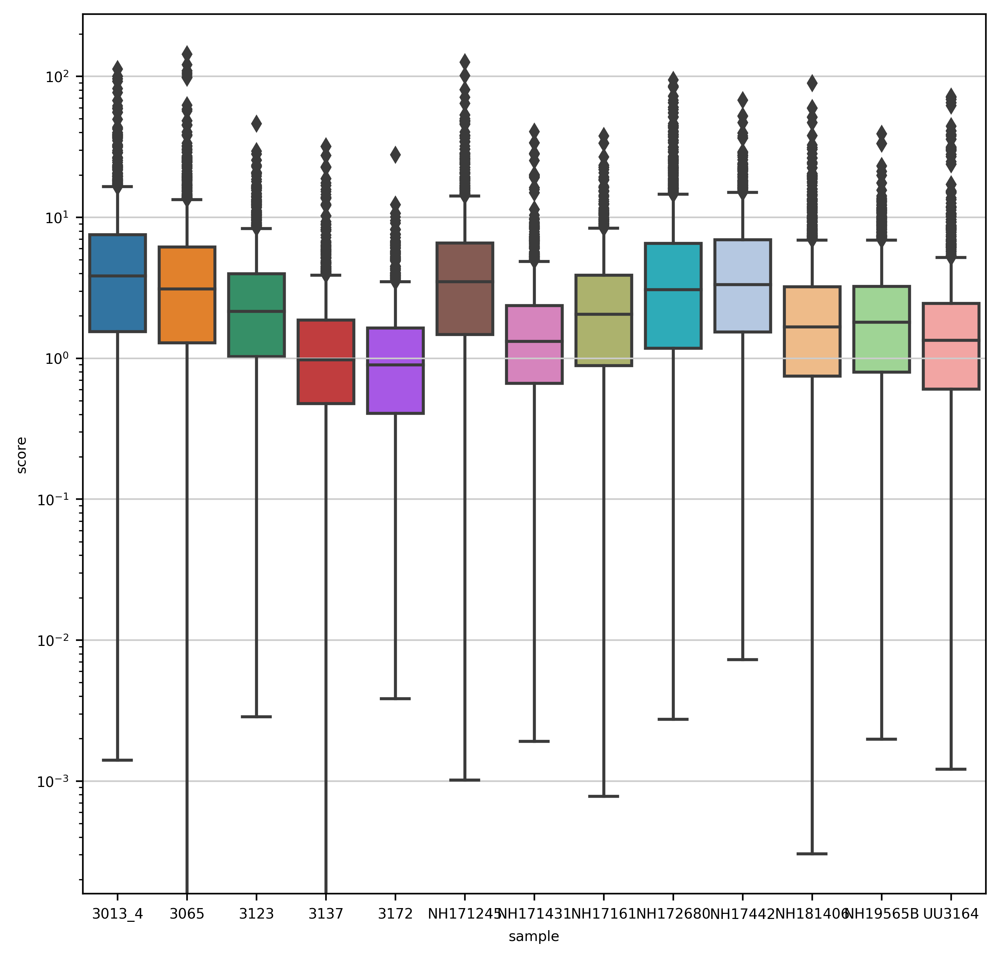

In [322]:
ax=sns.boxplot(x=list_scores['sample'],y=abs(list_scores['score']))
ax.set_yscale('log')

In [13]:
sorted_score=pd.DataFrame(structure_score,ad_sp_concat.obs['sample'].unique(),columns=['compartimentalization_score']).sort_values(by='compartimentalization_score')

# Finally, we plot the stucture score for each sample as a barplot

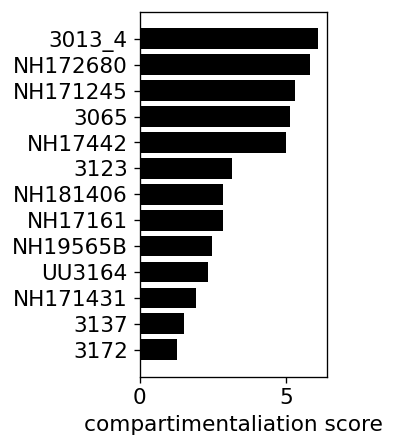

In [342]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=False, vector_friendly=True, fontsize=13, figsize=(2,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(2,4))
plt.barh(sorted_score.index,sorted_score['compartimentalization_score'],color='black')
plt.xlabel('compartimentaliation score')
plt.grid(False)
plt.savefig(general_path+'/ISS_global_analysis/compartimentalization_score.pdf')

 We check the correlation between structure_score and number of cells

In [297]:
np.corrcoef(ad_sp_concat.obs.groupby('sample').count()['X'],structure_score)[0,1]

0.34165930147061635

In [ ]:
dfs=pd.DataFrame(ad_sp_concat.layers['raw'])
dfs=pd.DataFrame(np.sum(dfs,axis=1))
dfs['sample']=list(ad_sp_concat.obs['sample'])
dfs_mean=dfs.groupby('sample').mean()

We also check the correlation between structure_score and number of reads/cell

In [299]:
np.corrcoef(dfs_mean[0],structure_score)[0,1]

0.5052960239575617

# Correlation between structure score and  abundance/ cell type specific specific scores

In [28]:
grouped_cells=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=smpls)
for gr in range(0,allmat.shape[0]):
    for smp in range(0,allmat.shape[2]):
        grouped_cells.iloc[gr,smp]=allmat[gr,gr,smp]

In [346]:
level='level4'
organization_influence_4=pd.DataFrame(index=ad_sp_concat.obs[level].unique(),columns=['correlation','correlation_num'])
for i in organization_influence_4.index:
    nu=0
    numb=[]
    ad_sp_concat_sub=ad_sp_concat[ad_sp_concat.obs[level]!=i][:]
    allmat=np.zeros([len(np.unique(ad_sp_concat_sub.obs[level])),len(np.unique(ad_sp_concat_sub.obs[level])),len(smpls)])
    for samp in smpls:
        adsu2=ad_sp_concat[ad_sp_concat.obs['sample']==samp]
        numb.append(np.sum(adsu2.obs['level4']==i)/adsu2.shape[0])
        adsu=ad_sp_concat_sub[ad_sp_concat_sub.obs['sample']==samp]
        nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
        allmat[:,:,nu]=nenrichsub[0]
        nu=nu+1
    grouped_cells2=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=smpls)
    for gr in range(0,allmat.shape[0]):
        for smp in range(0,allmat.shape[2]):
            grouped_cells2.iloc[gr,smp]=allmat[gr,gr,smp]
    gs=grouped_cells.loc[i,:]
    gns=np.mean(grouped_cells2.loc[:,:],axis=0)
    organization_influence_4.loc[i,'correlation']=np.corrcoef(list(gs),list(gns))[0,1]
    organization_influence_4.loc[i,'correlation_num']=np.corrcoef(list(numb),list(gns))[0,1]
    print(organization_influence_4.loc[i,'correlation_num'])
    print(i)

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 694.82/s]


0.5777161850536235
Neutrophil


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 708.61/s]


0.11326702608552111
Endo capilar


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 689.01/s]


0.05105760287194737
NPC-like OPC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 716.27/s]


0.1726177593413651
MES-like hypoxia/MHC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 670.52/s]


0.254376213589608
Endo arterial


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 726.50/s]


-0.4126402287480726
AC-like Prolif


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 673.74/s]


-0.3465055964286343
TAM-MG pro-infl II


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 737.18/s]


-0.33539813430362664
VLMC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 704.26/s]


0.36658133569432394
Mast


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 713.66/s]


0.5775686543769407
OPC-like


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 640.88/s]


-0.017009676058482488
TAM-BDM hypoxia/MES


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 702.12/s]


0.3531477670492093
NPC-like neural


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 695.46/s]


0.2854881076172278
SMC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 736.25/s]


-0.47608276183331316
OPC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 688.94/s]


-0.3691992338250298
Tip-like


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 705.69/s]


-0.5463166789388734
Oligodendrocyte


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 672.05/s]


-0.0037311938575181284
TAM-MG aging sig


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 694.10/s]


-0.3173783518233513
Pericyte


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 715.55/s]


-0.5714994027815806
Scavenging endothelial


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 718.12/s]


-0.017919597874202546
NPC-like Prolif


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 713.46/s]


-0.013775644596697622
OPC-like Prolif


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 698.43/s]


0.40216160952606234
cDC1


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 692.98/s]


-0.006155793182197035
MES-like hypoxia independent


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 697.68/s]


0.03989362546800218
Mono hypoxia


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 721.03/s]


-0.5238306007757321
Scavenging pericyte


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 687.49/s]


0.3158275948357526
cDC2


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 727.82/s]


-0.162486911529976
Astrocyte


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 664.98/s]


0.5235099354490436
NK


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 688.68/s]


0.3094291330042073
SMC COL


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 669.35/s]


-0.1294901290937859
DC1


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 703.17/s]


0.09242090591962804
Perivascular fibroblast


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 667.69/s]


-0.06446036246021157
Mono naive


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 691.22/s]


-0.04703285473377037
Stress sig


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 681.32/s]


0.23044354865812877
pDC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 684.54/s]


-0.28793480519834974
TAM-BDM INF


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 627.54/s]


-0.2078732030146007
TAM-MG prolif


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 674.32/s]


-0.2290313623143168
TAM-BDM anti-infl


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 696.45/s]


0.5119540723453533
B cell


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 694.60/s]


0.0007561484749948211
DC2


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 661.80/s]


0.4116558062467914
DC3


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 686.97/s]


-0.05595526279916799
Mono anti-infl


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 645.43/s]


0.6950811195762199
CD4 rest


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 689.82/s]


-0.48529249504115346
TAM-MG pro-infl I


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 677.41/s]


0.14647583349152124
Plasma B


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 621.59/s]


0.24496495867981757
Prolif T


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 708.83/s]


-0.021024887228357374
Neuron


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 682.01/s]


-0.23449772478542832
TAM-BDM MHC


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 630.73/s]


0.5203815571784024
SMC prolif


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 688.67/s]


0.5271779385948304
CD4 INF


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 648.50/s]


0.6243659488537058
Reg T


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 691.25/s]


0.6836122460999936
CD8 EM


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 721.81/s]


-0.1338619577208919
AC-like


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 638.53/s]


0.31358468438703896
CD8 cytotoxic


In [383]:
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns[level+'_colors'])) ###modify for other annotations

After calculating the correlation of strucure score (TSS) and the cell type self-enrichment, we plot it as a dotplot

(24, 2)


<Figure size 120x240 with 0 Axes>

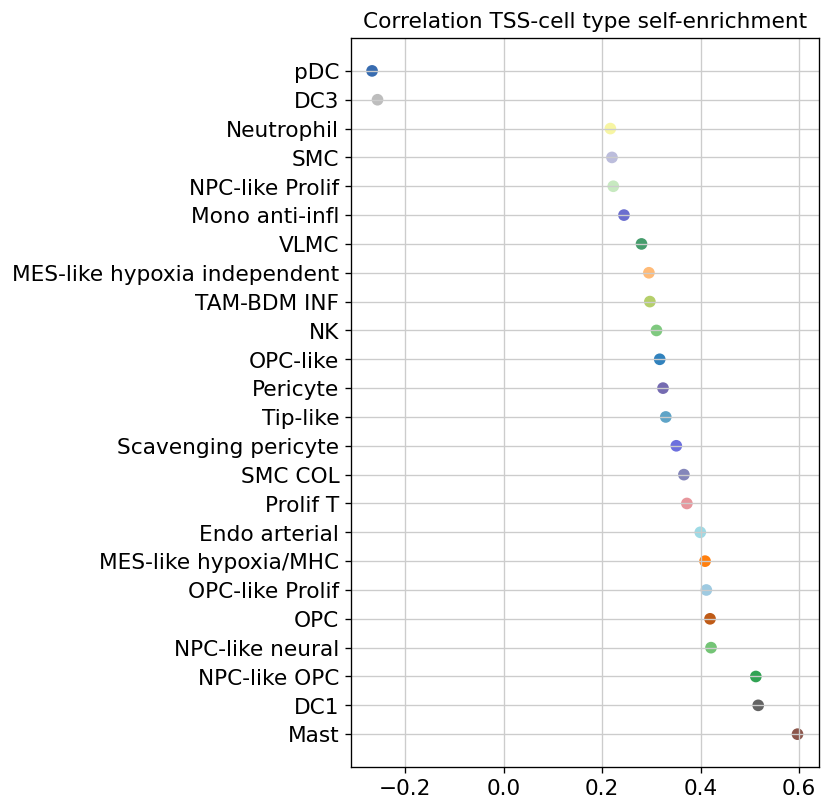

In [389]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=False, vector_friendly=True, fontsize=13, figsize=(2,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(2,4))
organization_influence_4=organization_influence_4.sort_values(by='correlation',ascending=False)
organization_corr_filt=organization_influence_4[abs(organization_influence_4['correlation'])>0.2]
print(organization_corr_filt.shape)
plt.figure(figsize=(5,8))
plt.scatter(organization_corr_filt.iloc[:,0],organization_corr_filt.index,color=organization_corr_filt.index.map(coldic))
plt.title('Correlation TSS-cell type self-enrichment')
plt.savefig(general_path+'/ISS_global_analysis/TSS_celltype_self_enrichment.pdf')

We also plot the correlation between the TSS score and cell type abundances

(20, 2)


<Figure size 120x240 with 0 Axes>

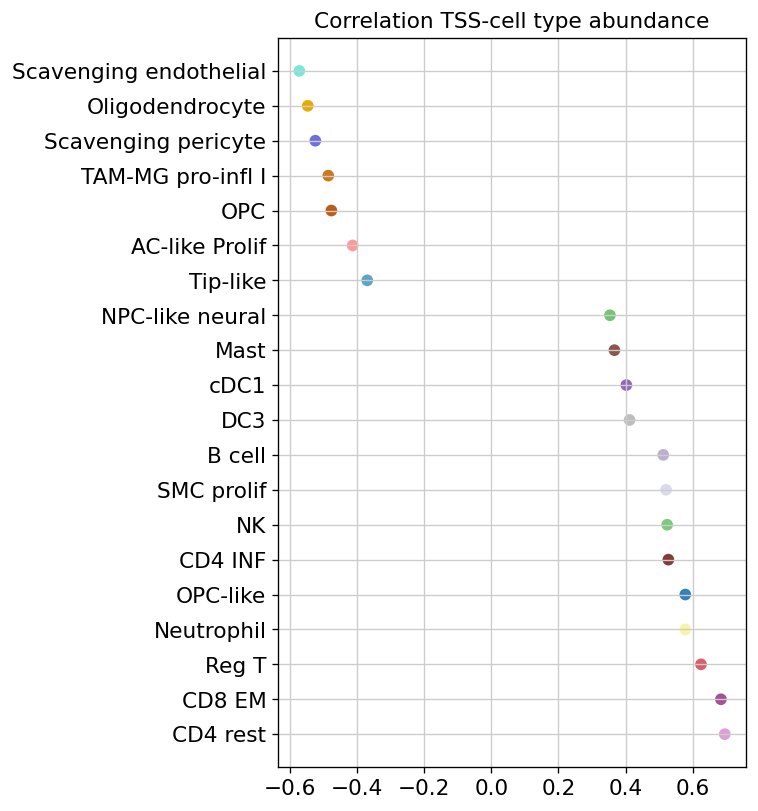

In [388]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=False, vector_friendly=True, fontsize=13, figsize=(2,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.figure(figsize=(2,4))
organization_influence_4=organization_influence_4.sort_values(by='correlation_num',ascending=False)
organization_corr_filt=organization_influence_4[abs(organization_influence_4['correlation_num'])>0.35]
print(organization_corr_filt.shape)
plt.figure(figsize=(5,8))
plt.scatter(organization_corr_filt.iloc[:,1],organization_corr_filt.index,c=organization_corr_filt.index.map(coldic))
plt.title('Correlation TSS-cell type abundance')
plt.savefig(general_path+'/ISS_global_analysis/TSS_celltype_expression_correlations.pdf')


We can represent this two correlations ( TSS against cell type abundance and cell type self- neighborhood enrichment) in the form of a scatter plot

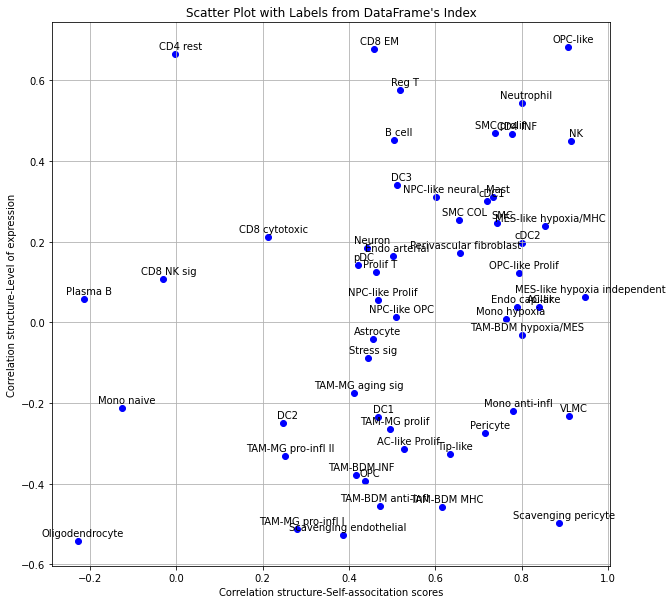

In [147]:
df=organization_influence_4
plt.figure(figsize=(10,10))
plt.scatter(df['correlation'], df['correlation_num'], color='blue')

for label, x, y in zip(df.index, df['correlation'], df['correlation_num']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(5,5), ha='center')

plt.title("Scatter Plot with Labels from DataFrame's Index")
plt.xlabel("Correlation structure-Self-associtation scores")
plt.ylabel("Correlation structure-Level of expression")
plt.grid(True)
plt.show()


In [156]:
structural_score=pd.DataFrame(np.sum(grouped_cells.loc[:,:],axis=0),columns=['structural_score'])

In [158]:
structural_binary=structural_score>600
structual_dict=dict(zip(structural_binary.index,structural_binary.structural_score))

# Now we check the correlation of the TSS (structure score) and the expression of specific genes
This is done with the purpose of defining a gene expression signature associated with TSS

In [29]:
meanexpr=pd.DataFrame(ad_sp_concat.layers['raw'],columns=list(ad_sp_concat.var.index))
meanexpr['sample']=list(ad_sp_concat.obs['sample'])
mean_by_sample=meanexpr.groupby('sample').mean()
mean_by_sample=mean_by_sample.loc[grouped_cells.columns,:]
mean_by_sample2=mean_by_sample.loc[~mean_by_sample.index.isin(['3172']),:]
grouped_cells2=grouped_cells.loc[:,~grouped_cells.columns.isin(['3172'])]


In [32]:
correlgene=[]
for c in mean_by_sample.columns:
    correlgene.append(np.corrcoef(list(np.mean(grouped_cells2,axis=0)),mean_by_sample2.loc[:,c])[0,1])

In [33]:
gene_correlations=pd.DataFrame(correlgene,index=mean_by_sample.columns,columns=['gene_correlation']).sort_values(by='gene_correlation')

In [47]:
gsel=list(gene_correlations.head(15).index)+list(gene_correlations.tail(15).index)
gf=gene_correlations[abs(gene_correlations['gene_correlation'])>0.4]#

We defined TGFBI (correlation>0.6) as the limit for considering the signature

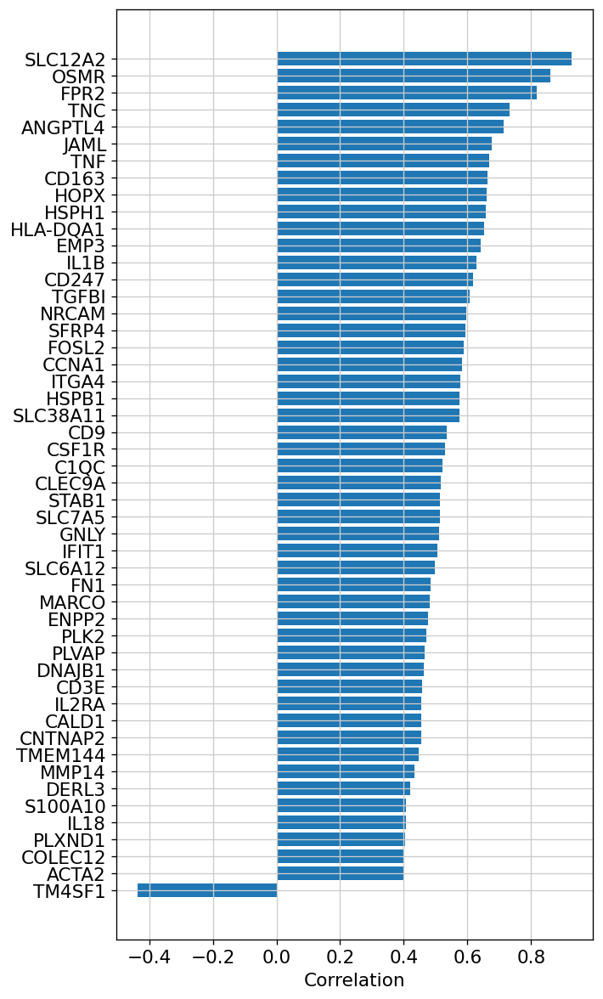

In [59]:
plt.figure(figsize=(6,12))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.barh(gf.index,gf.iloc[:,0])
plt.xlabel('Correlation')
plt.savefig(general_path+'/ISS_global_analysis/Gene_correlations_TSS_above_abs04.pdf')

In [49]:
gf=gene_correlations[gene_correlations.index.isin(gsel)]

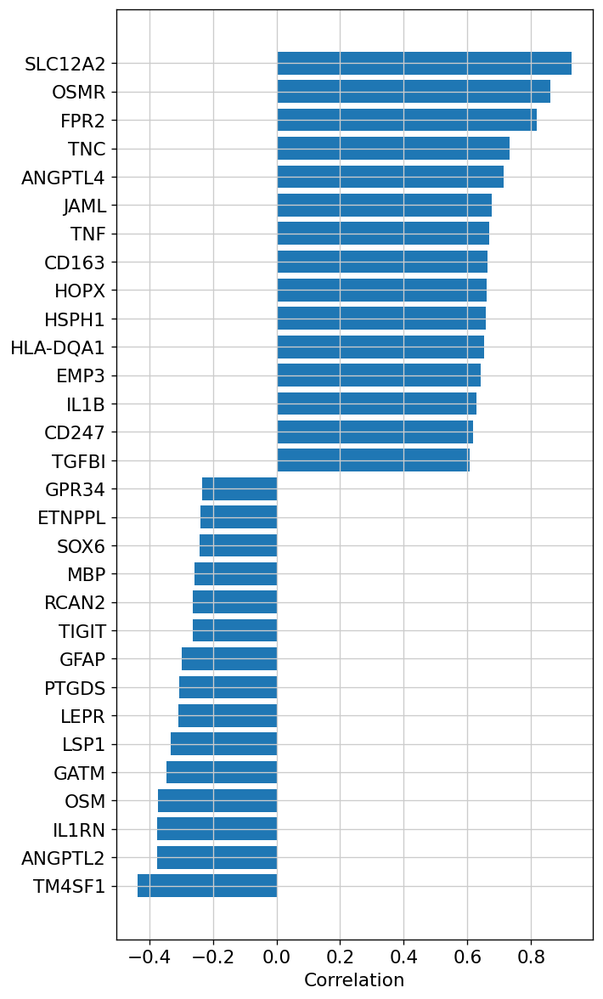

In [57]:
plt.figure(figsize=(6,12))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.barh(gf.index,gf.iloc[:,0])
plt.xlabel('Correlation')
plt.savefig(general_path+'/ISS_global_analysis/Gene_correlations_TSS_tailhead_15.pdf')


<BarContainer object of 32 artists>

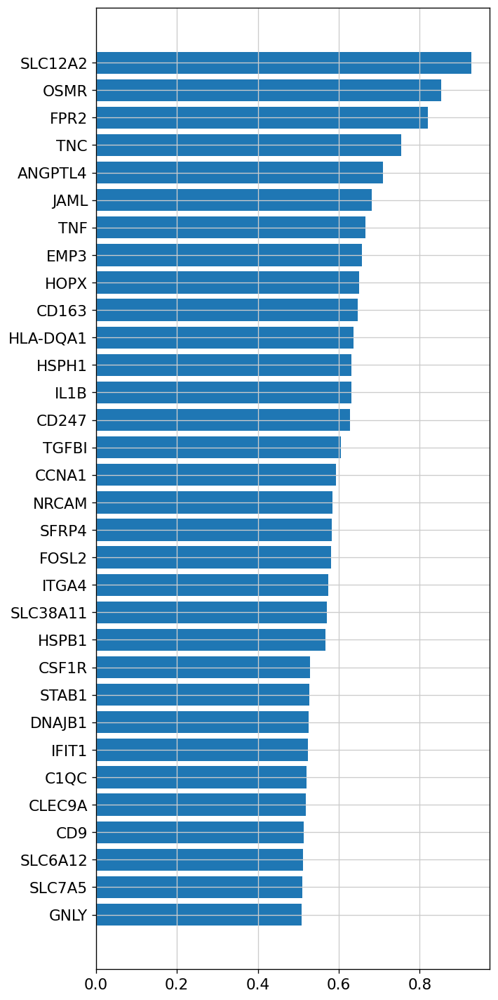

In [467]:
plt.figure(figsize=(6,15))
plt.barh(gf.index,gf.iloc[:,0])

# We also explore the consistency of the neighborhood enrichment scores across samples by developing  a consistency plot 
This plot represents the standard deviation between the enrichment scores obtained for paired cell types. Thus, the higher, the more divergence between cell types there is

In [132]:
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns[level+'_colors'])) ###modify for other annotations

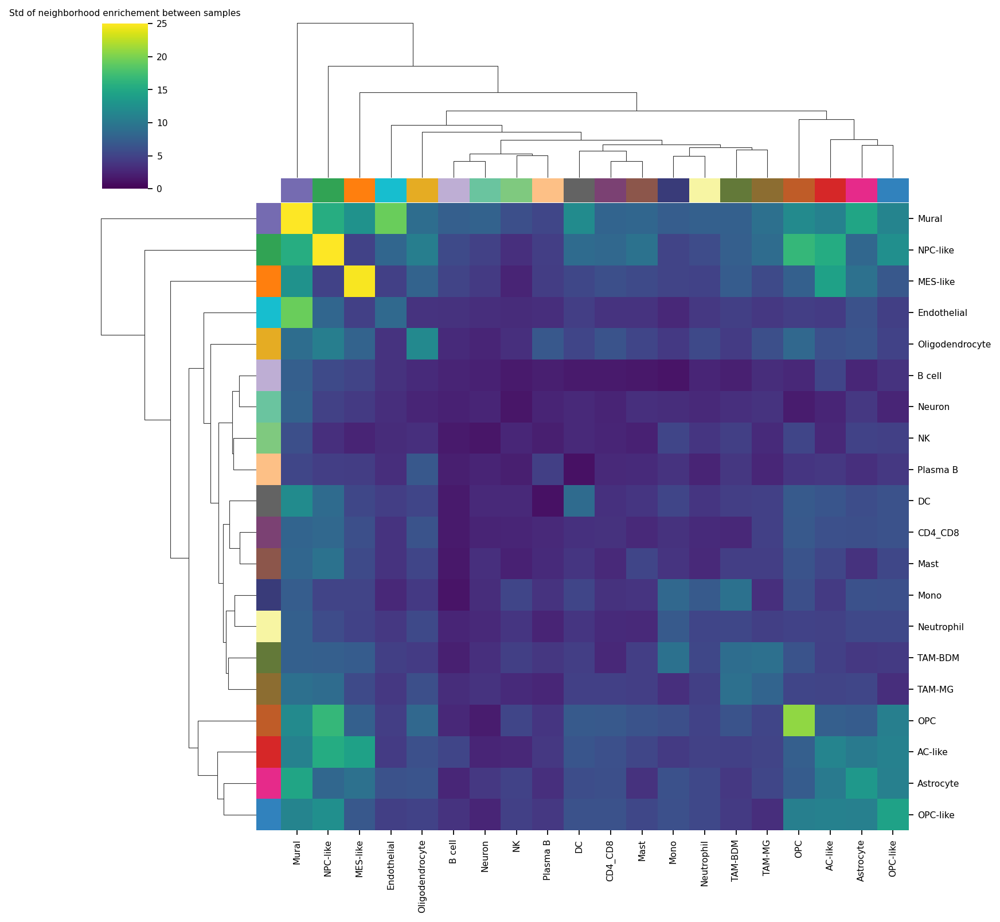

In [128]:
deviation=np.std(allmat,axis=2)#/np.mean(allmat,axis=2)
devi=pd.DataFrame(deviation,index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs[level]))
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns[level+'_colors'])) ###modify for other annotations
sns.clustermap(devi,vmin=0,vmax=25,cmap='viridis',row_colors=devi.columns.map(coldic),col_colors=devi.columns.map(coldic))
plt.title('Std of neighborhood enrichement between samples')
plt.savefig(general_path+'/ISS_global_analysis/Differences_between_samples_std_nhood_enrichment_'+level+'.pdf')

# Finally, we also compute the neighborhood enrichment in level 4

In [6]:
ad_sp_concat.obs['level4']=ad_sp_concat.obs['level4'].astype('category')
level='level4'
nenrich=sq.gr.nhood_enrichment(ad_sp_concat, cluster_key=level,copy = True)
sq.gr.nhood_enrichment(ad_sp_concat, cluster_key=level)
ad_sp_concat.uns[level+'_nhood_enrichment']['zscore']=np.array(pd.DataFrame(ad_sp_concat.uns[level+'_nhood_enrichment']['zscore']).fillna(0))

100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [04:39<00:00,  3.57/s]


In [9]:
ad_sp_concat.uns[level+'_nhood_enrichment']['zscore']=np.array(nenrich[0])
ad_sp_concat.uns['utag_matrix']=pd.DataFrame(ad_sp_concat.uns[level+'_nhood_enrichment']['zscore'],index=np.unique(ad_sp_concat.obs['level4']),columns=np.unique(ad_sp_concat.obs['level4']))
ad_sp_concat.uns['utag_matrix'][ad_sp_concat.uns['utag_matrix']<15]=0
for c in ad_sp_concat.uns['utag_matrix'].columns:
    ad_sp_concat.uns['utag_matrix'].loc[c,c]=0
missing_celltypes=ad_sp_concat.uns['utag_matrix'].index[np.sum(ad_sp_concat.uns['utag_matrix']>0,axis=1)==0]
ad_sp_concat.uns['utag_matrix'][ad_sp_concat.uns['utag_matrix']>70]=70

# We plot the neighhborhood enrichment scores in the form of a graph
Only cell type pairs with scores higher than 70 are represented. 
Note that, while is the plot presented in the publication, the location of specific edges has been modified to facilitating their visualization

In [131]:
fig = draw_network(
    adata=ad_sp_concat,
    adjacency_matrix_key='utag_matrix',
    node_key='level4',
    font_size=7,
    edge_weight = 2,
    edge_weight_baseline=1,
    dpi=400,
    node_size_max=200,
    node_size_min=30,
    log_transform=False,
)
plt.savefig(general_path+'/ISS_global_analysis/network_nhood_enrichment_'+level+'.pdf')

# We can also visualize the same nhood scores as a heatmap

In [131]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=7, figsize=(8,8), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
#matplotlib.rcParams['ps.fonttype'] = 4
sq.pl.nhood_enrichment(ad_sp_concat, cluster_key=level, method="ward",mode='zscore',vmax=80,vmin=-80,cmap='coolwarm',show=False)
plt.savefig(general_path+'/ISS_global_analysis/global_nhood_enrichment_'+level+'.pdf')

Since the plot including all cell types is pretty complex, we subdivided the plot into groups of cell types, comparing them agains malignant cells identified

In [11]:
nenrich_df=pd.DataFrame(nenrich[0],columns=np.unique(ad_sp_concat.obs[level]),index=np.unique(ad_sp_concat.obs[level]))

In [16]:
healthy=['Astrocyte','Neuron','OPC','Oligodendrocyte']
malignant=['AC-like', 'AC-like Prolif', 'MES-like hypoxia independent',
       'MES-like hypoxia/MHC', 'NPC-like OPC', 'NPC-like Prolif',
       'NPC-like neural','OPC-like','OPC-like Prolif']
TAMs=['TAM-BDM INF', 'TAM-BDM MHC',
       'TAM-BDM anti-infl', 'TAM-BDM hypoxia/MES', 'TAM-MG aging sig',
       'TAM-MG pro-infl I', 'TAM-MG pro-infl II', 'TAM-MG prolif','Mono anti-infl', 'Mono hypoxia',
       'Mono naive','Mast','Neutrophil']
lymphoid=['B cell', 'CD4 INF',
       'CD4 rest', 'CD8 EM', 'CD8 NK sig', 'CD8 cytotoxic', 'DC1', 'DC2',
       'DC3', 'NK','Plasma B', 'Prolif T', 'Reg T','cDC1', 'cDC2', 'pDC']
vascular=['Perivascular fibroblast','SMC',
       'SMC COL', 'SMC prolif', 'Scavenging endothelial',
       'Scavenging pericyte','Tip-like', 'VLMC','Endo arterial', 'Endo capilar','Pericyte']

In [17]:
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns[level+'_colors']))

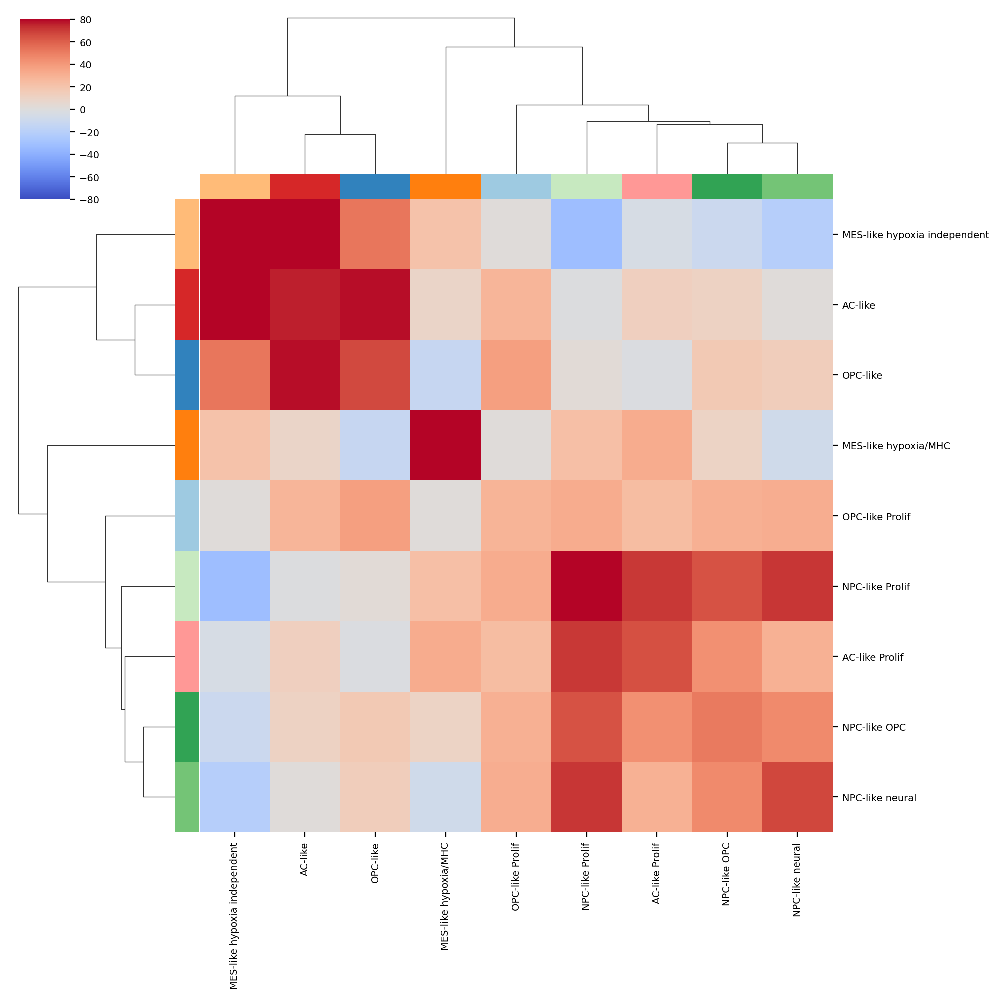

In [22]:
nenrich_malignant=nenrich_df.loc[malignant,malignant]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=(3,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_malignant,vmin=-80,vmax=80,cmap='coolwarm',row_colors=nenrich_malignant.columns.map(coldic),col_colors=nenrich_malignant.columns.map(coldic))
plt.savefig(general_path+'/ISS_global_analysis/cancer_vs_cancer_nhood_enrichment_'+level+'filtered_dendrogram.pdf')

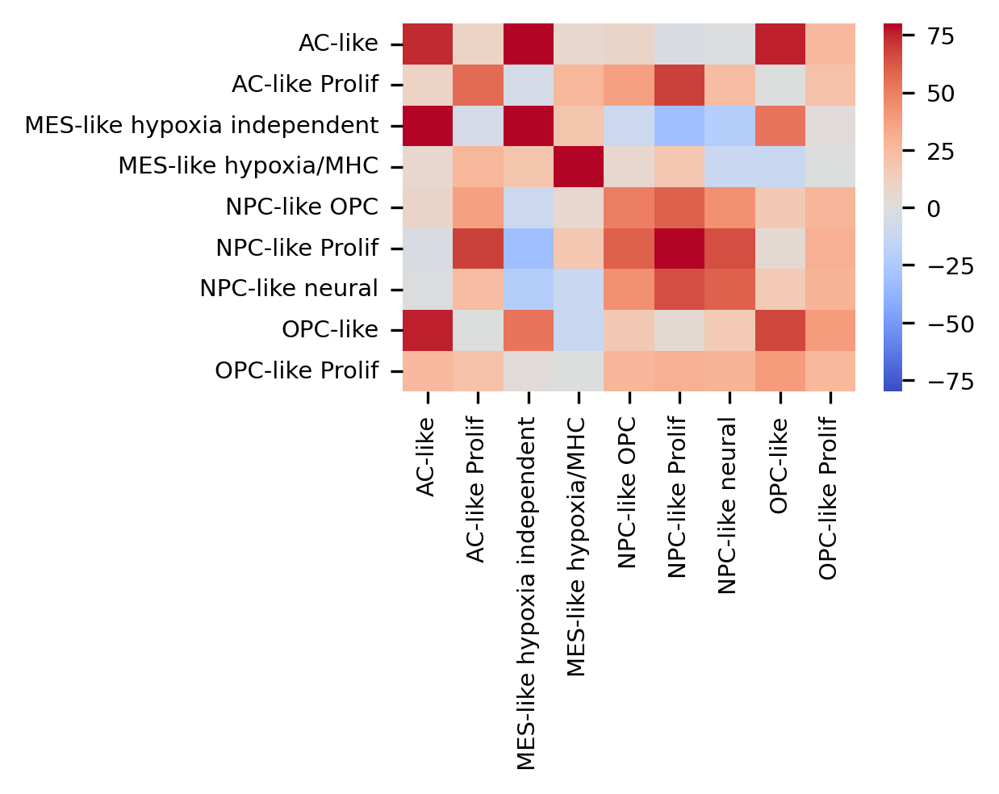

In [29]:
nenrich_malignant=nenrich_df.loc[malignant,malignant]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=(3,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.heatmap(nenrich_malignant,vmin=-80,vmax=80,cmap='coolwarm',)
plt.savefig(general_path+'/ISS_global_analysis/cancer_vs_cancer_nhood_enrichment_'+level+'filtered.pdf')

# We generate the plot of malignant vs all plots not included in the graph. 
We do this so that their enrichment scores, despite being low are not completely can be considered as well in the interpretation of the results

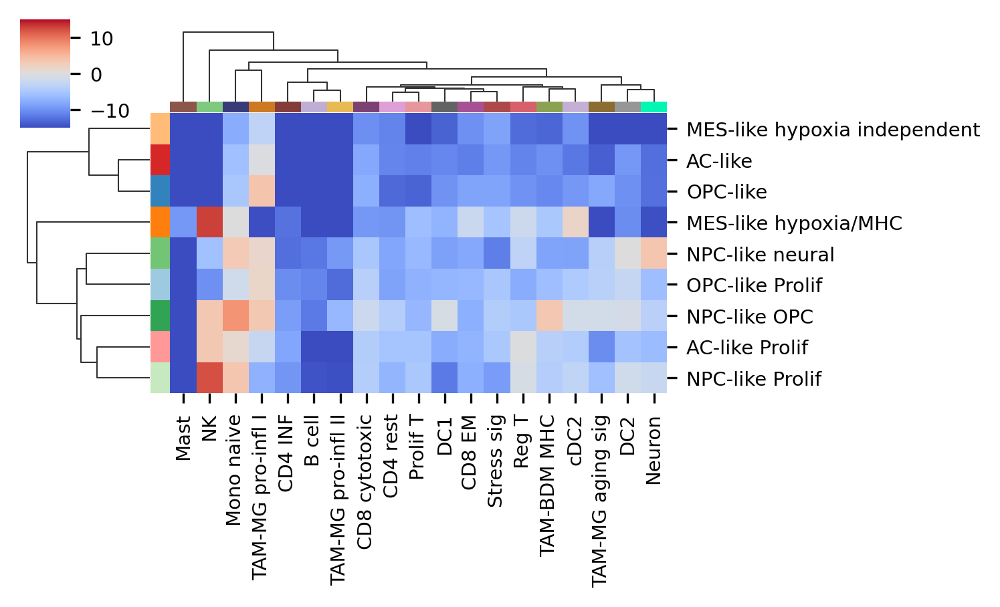

In [64]:
nenrich_TAMs=nenrich_df.loc[malignant,missing_celltypes]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=(1,0.3), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_TAMs,vmin=-15,vmax=15,cmap='coolwarm',figsize=(5,3),row_colors=nenrich_TAMs.index.map(coldic),col_colors=nenrich_TAMs.columns.map(coldic))
#plt.savefig(general_path+'/ISS_global_analysis/TAMs_vs_cancer_nhood_enrichment_'+level+'filtered.pdf')

# We now do malignant vs healtht scores, followed by the rest of cell types

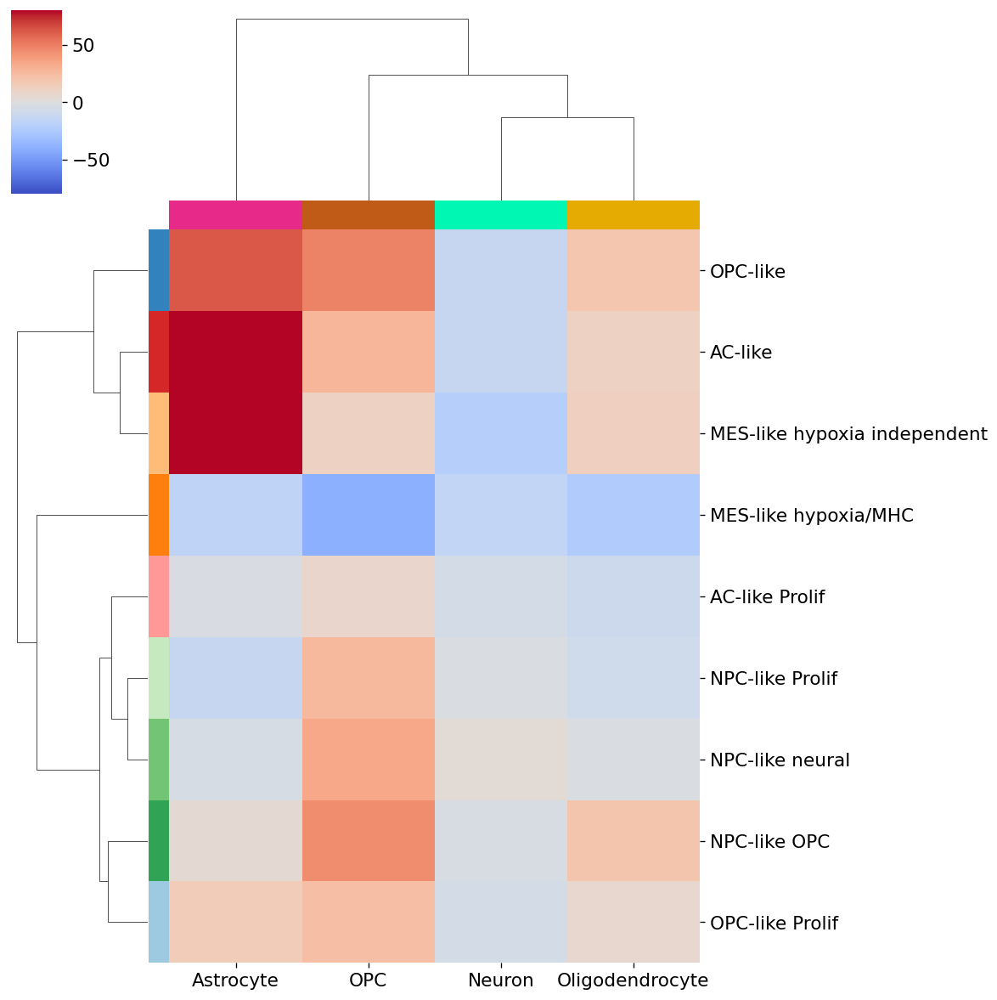

In [168]:
nenrich_healthy=nenrich_df.loc[malignant,healthy]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=False, vector_friendly=True, fontsize=13, figsize=(2,2), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_healthy,vmin=-80,vmax=80,cmap='coolwarm',row_colors=nenrich_healthy.index.map(coldic),col_colors=nenrich_healthy.columns.map(coldic))
plt.savefig(general_path+'/ISS_global_analysis/cancer_vs_healthy_nhood_enrichment_'+level+'filtered.pdf')

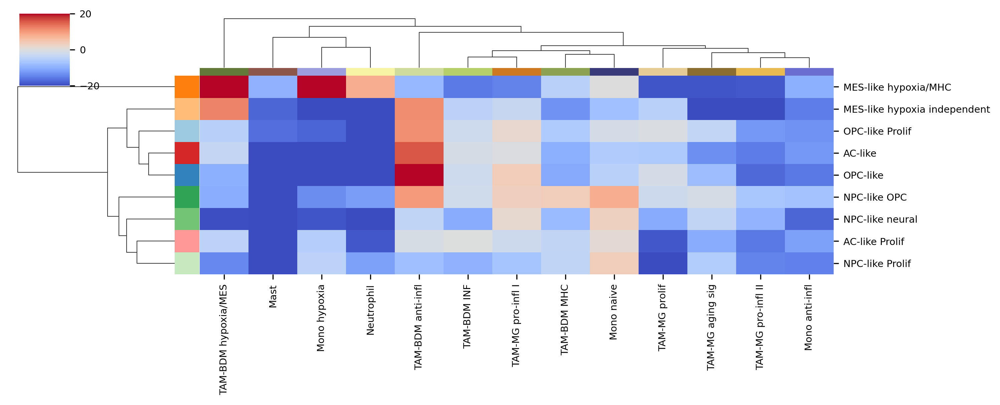

In [39]:
nenrich_TAMs=nenrich_df.loc[malignant,TAMs]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=(1,0.3), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_TAMs,vmin=-20,vmax=20,cmap='coolwarm',figsize=(10,4),row_colors=nenrich_TAMs.index.map(coldic),col_colors=nenrich_TAMs.columns.map(coldic))
#plt.savefig(general_path+'/ISS_global_analysis/TAMs_vs_cancer_nhood_enrichment_'+level+'filtered.pdf')

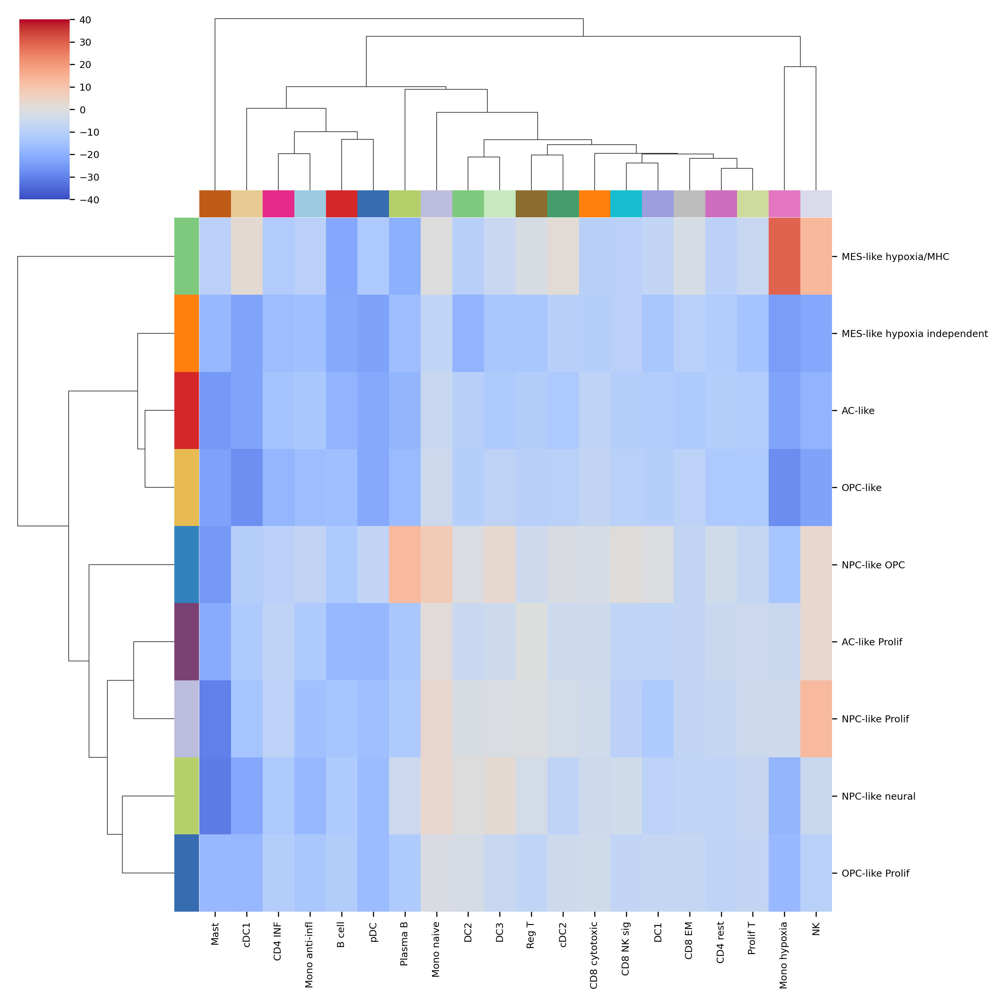

In [109]:
nenrich_lymphoid=nenrich_df.loc[malignant,lymphoid]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=150, dpi_save=150, frameon=False, vector_friendly=True, fontsize=7, figsize=(5,5), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_lymphoid,vmin=-40,vmax=40,cmap='coolwarm',row_colors=nenrich_filt.columns.map(coldic),col_colors=nenrich_filt.columns.map(coldic))
plt.savefig(general_path+'/ISS_global_analysis/lymphoid_vs_cancer_nhood_enrichment_'+level+'filtered.pdf')

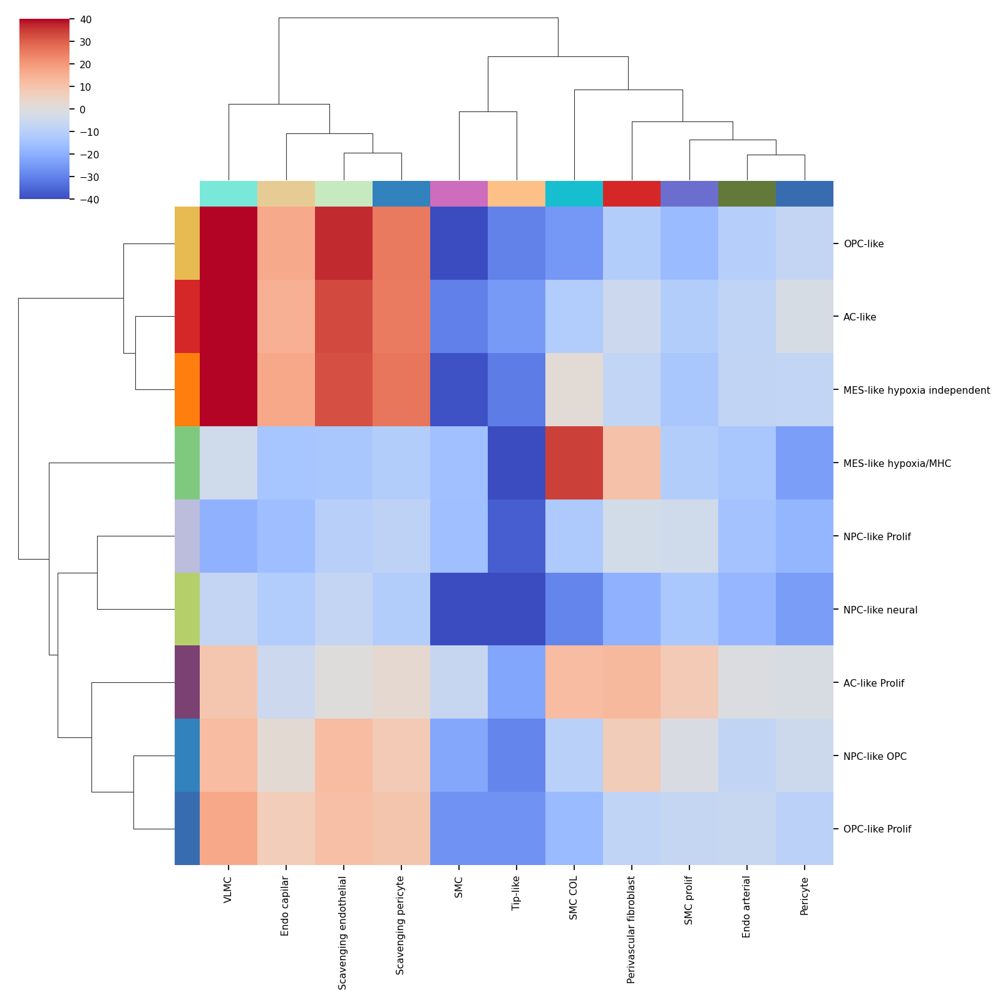

In [156]:
nenrich_vascular=nenrich_df.loc[malignant,vascular]
import matplotlib
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=80, frameon=False, vector_friendly=True, fontsize=7, figsize=(3,3), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_vascular,vmin=-40,vmax=40,cmap='coolwarm',row_colors=nenrich_filt.columns.map(coldic),col_colors=nenrich_filt.columns.map(coldic))
plt.savefig(general_path+'/ISS_global_analysis/vascular_vs_cancer_nhood_enrichment_'+level+'filtered.pdf')

# Yet a different way of visualizing the same thing.
Here we filtered out all cell types with maximum enrichment scores below 10

In [83]:
nenrich_df=pd.DataFrame(nenrich[0],columns=np.unique(ad_sp_concat.obs[level]),index=np.unique(ad_sp_concat.obs[level]))
nenrich_filt=nenrich_df.loc[nenrich_df.max(axis=0)>10,nenrich_df.max(axis=0)>10]
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns['ClassName'+'_colors'])) ###modify for other annotations

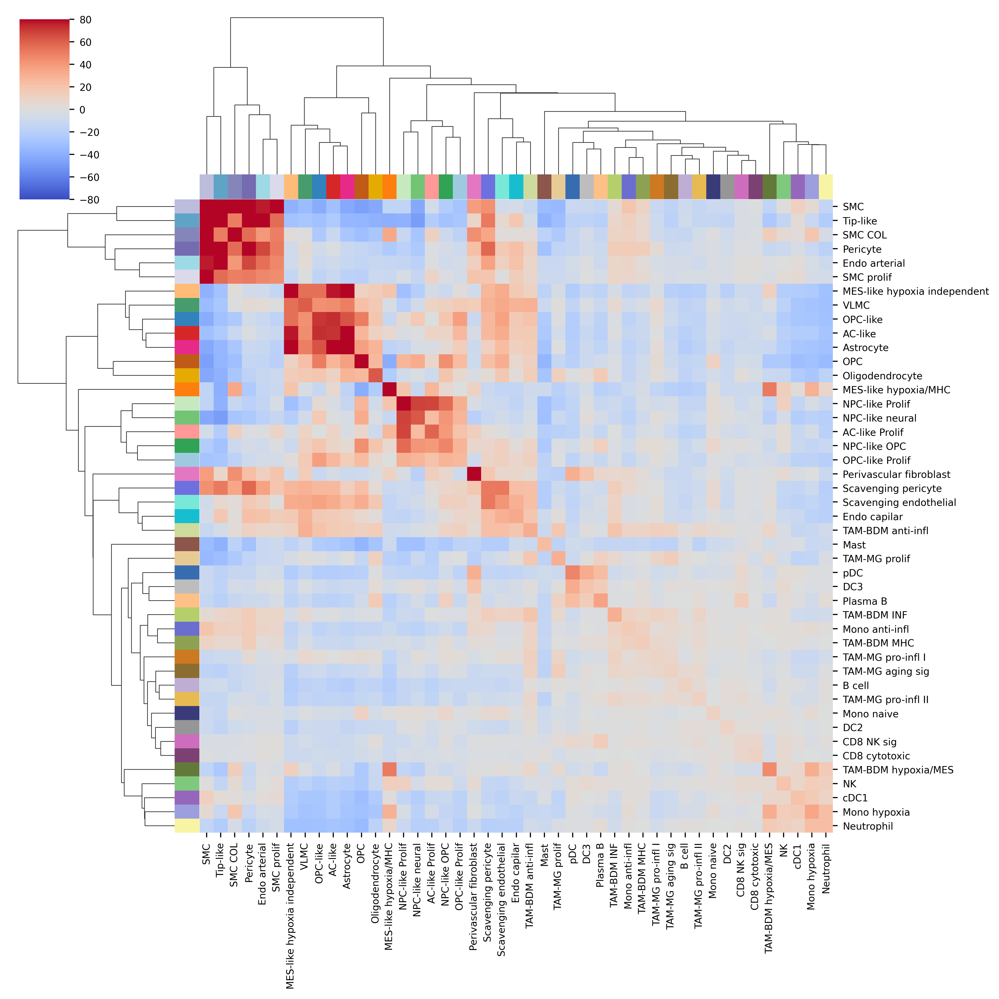

In [84]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=7, figsize=(8,8), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(nenrich_filt,vmin=-80,vmax=80,cmap='coolwarm',row_colors=nenrich_filt.columns.map(coldic),col_colors=nenrich_filt.columns.map(coldic))
plt.savefig(general_path+'/ISS_global_analysis/global_nhood_enrichment_'+level+'filtered.pdf')

# Self-enrichment scores for level 4
As we did for level3, we generate self enrichment score plots and consistency plots


 38%|███████████████████████████████▎                                                  | 382/1000 [00:17<00:25, 24.35/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:28<00:00, 35.00/s]

  9%|███████▊                                                                           | 94/1000 [00:06<01:01, 14.65/s]


 36%|█████████████████████████████▎                                                    | 358/1000 [00:25<00:46, 13.92/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:28<00:00, 34.52/s]

 63%|███████████████████████████████████████████████████▌                              | 629/1000 [00:12<00:07, 51.72/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:15<00:00, 66.46/s]

 55%|█████████████████████████████████████████████                                     | 550/1000 [00:12<00:09, 48.13/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:15<00:00, 65.98/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 130.98/s]

 42%|██████████████████████████████████                                               | 420/1000 [00:03<00:04, 133.46/s]


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:07<00:00, 129.66/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 656.47/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 655.39/s]


3137 not possible



100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 416.03/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:02<00:00, 420.72/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 258.46/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 258.87/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 695.78/s]



100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 694.94/s]

100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:10<00:00, 96.99/s]

 20%|███████████████▉                                                                 | 196/1000 [00:02<00:07, 102.58/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:10<00:00, 97.42/s]

 86%|█████████████████████████████████████████████████████████████████████▊           | 862/1000 [00:05<00:00, 150.80/s]


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:06<00:00, 146.75/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:06<00:00, 146.83/s]

 11%|█████████▏                                                                        | 112/1000 [00:08<01:04, 13.68/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:24<00:00, 41.04/s]

  3%|██▍                                                                                | 30/1000 [00:02<00:49, 19.79/s]


 31%|█████████████████████████▌                                                        | 312/1000 [00:20<00:44, 15.50/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:24<00:00, 40.72/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 290.77/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 297.48/s]

 72%|██████████████████████████████████████████████████████████▋                      | 724/1000 [00:04<00:01, 155.06/s]


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 213.00/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:04<00:00, 213.73/s]

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 176.92/s]

 37%|██████████████████████████████▎                                                   | 369/1000 [00:03<00:07, 89.49/s]


100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 180.47/s]


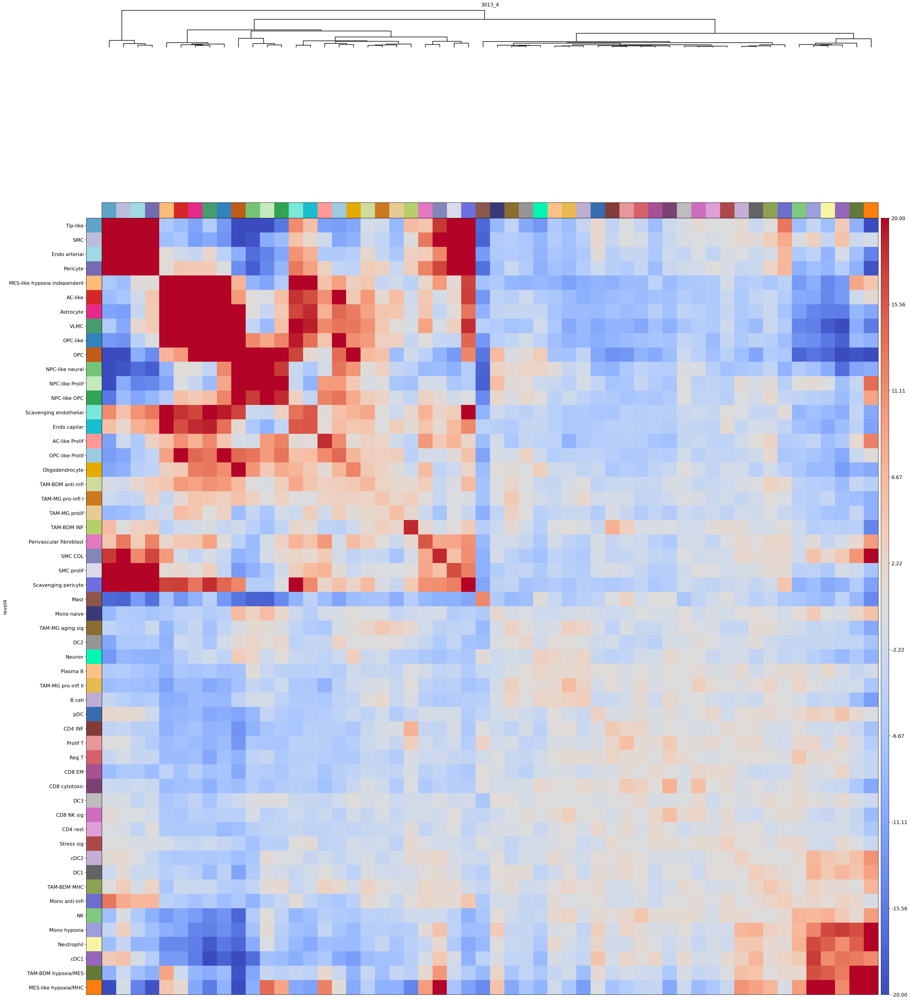

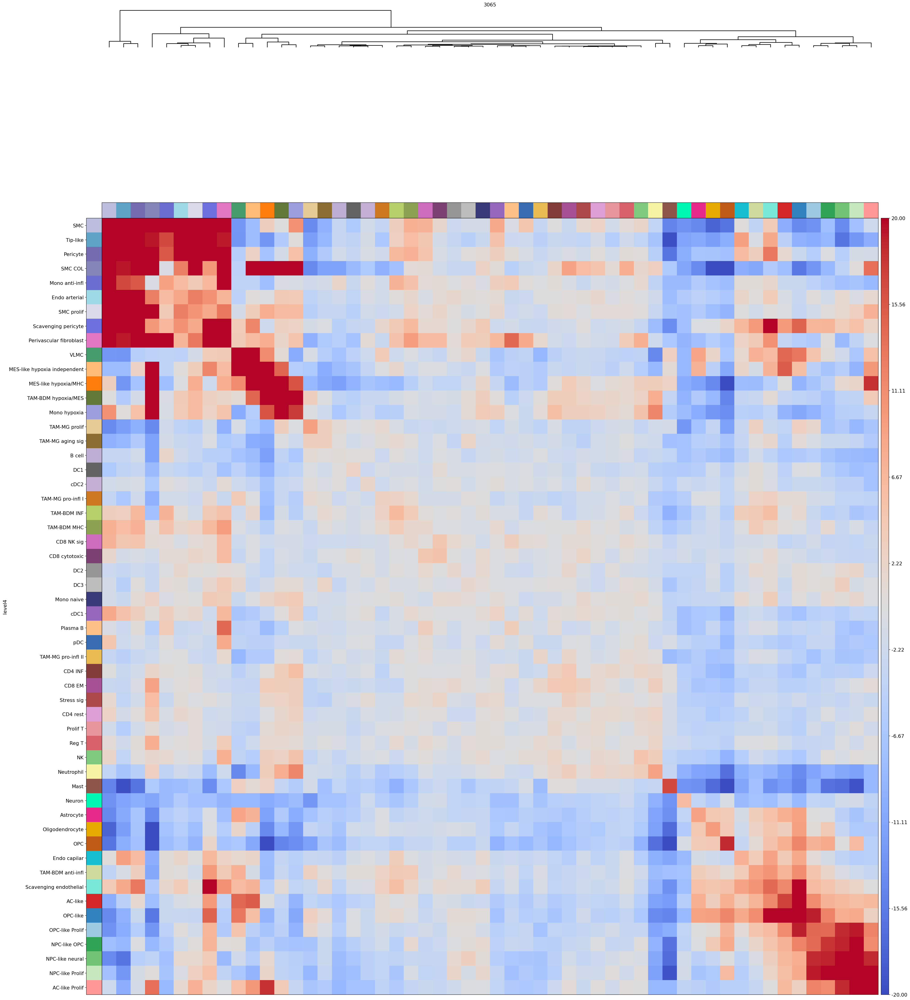

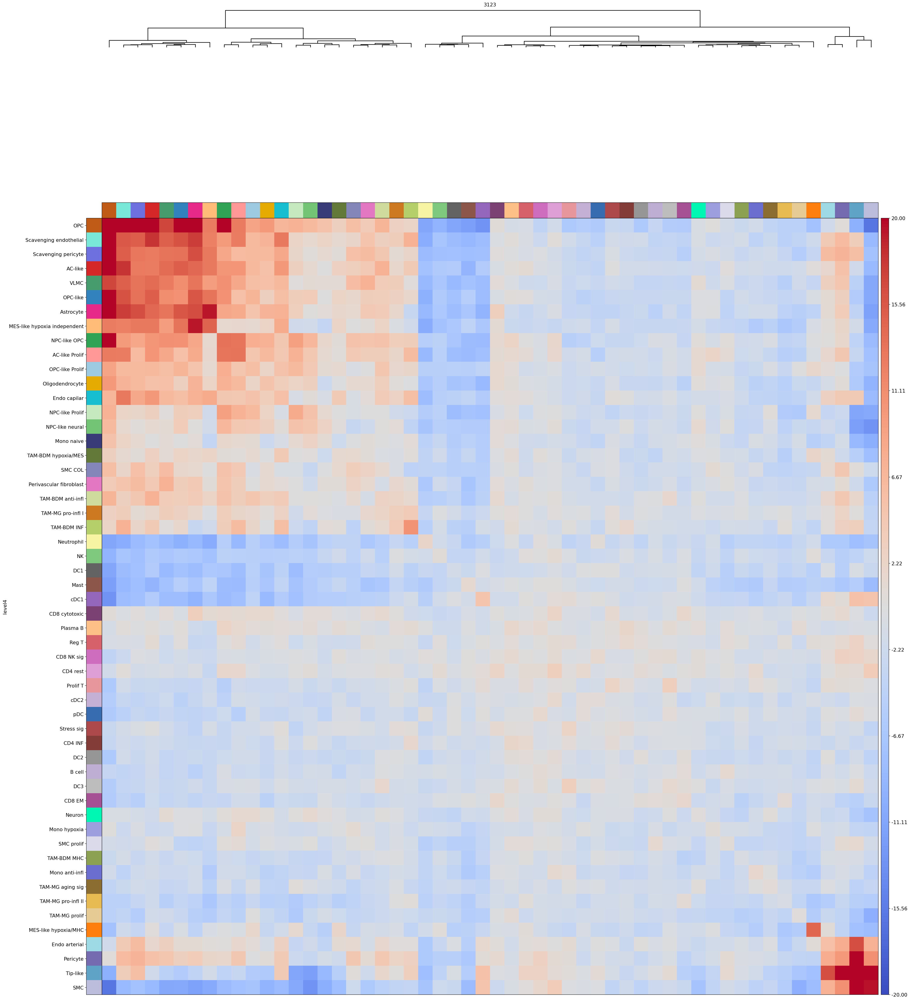

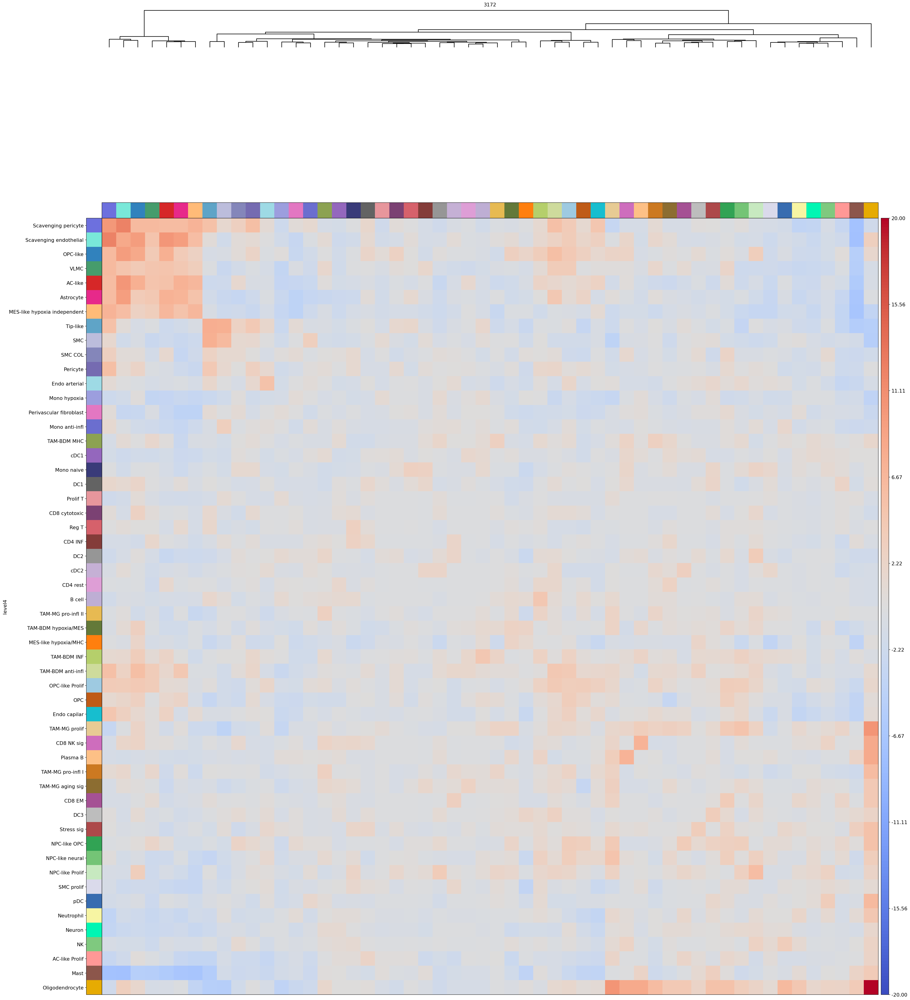

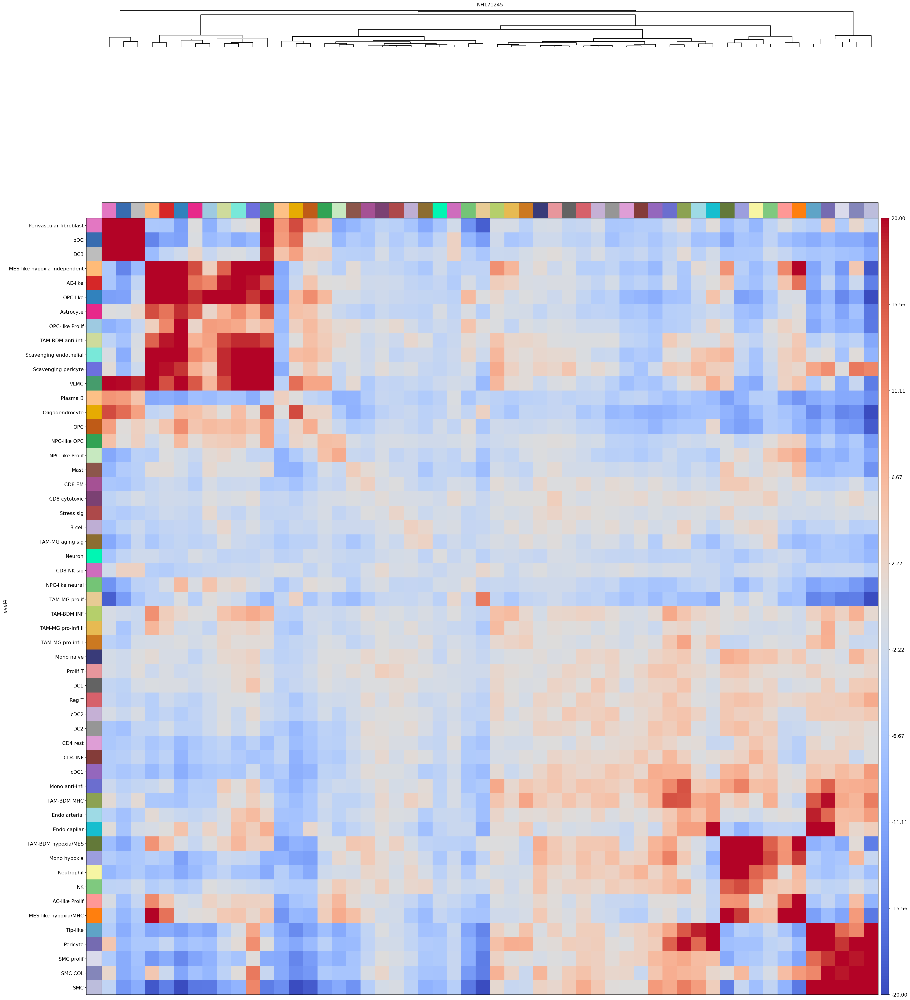

...

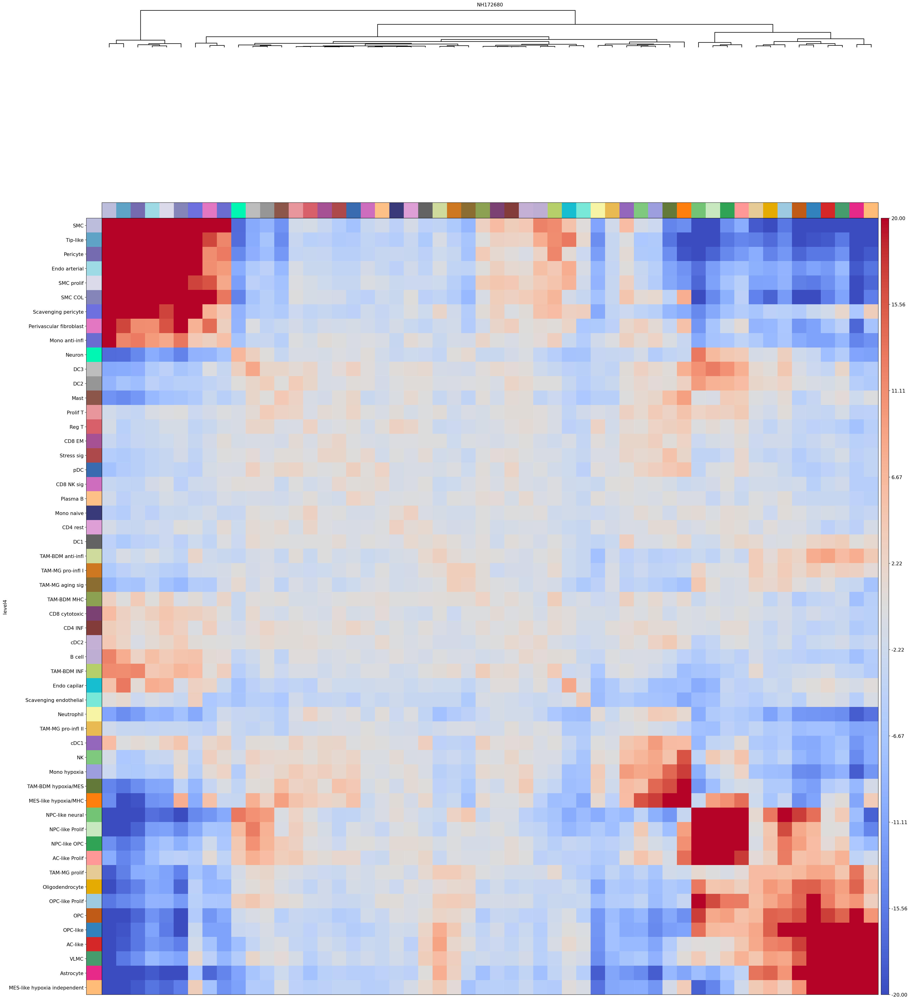

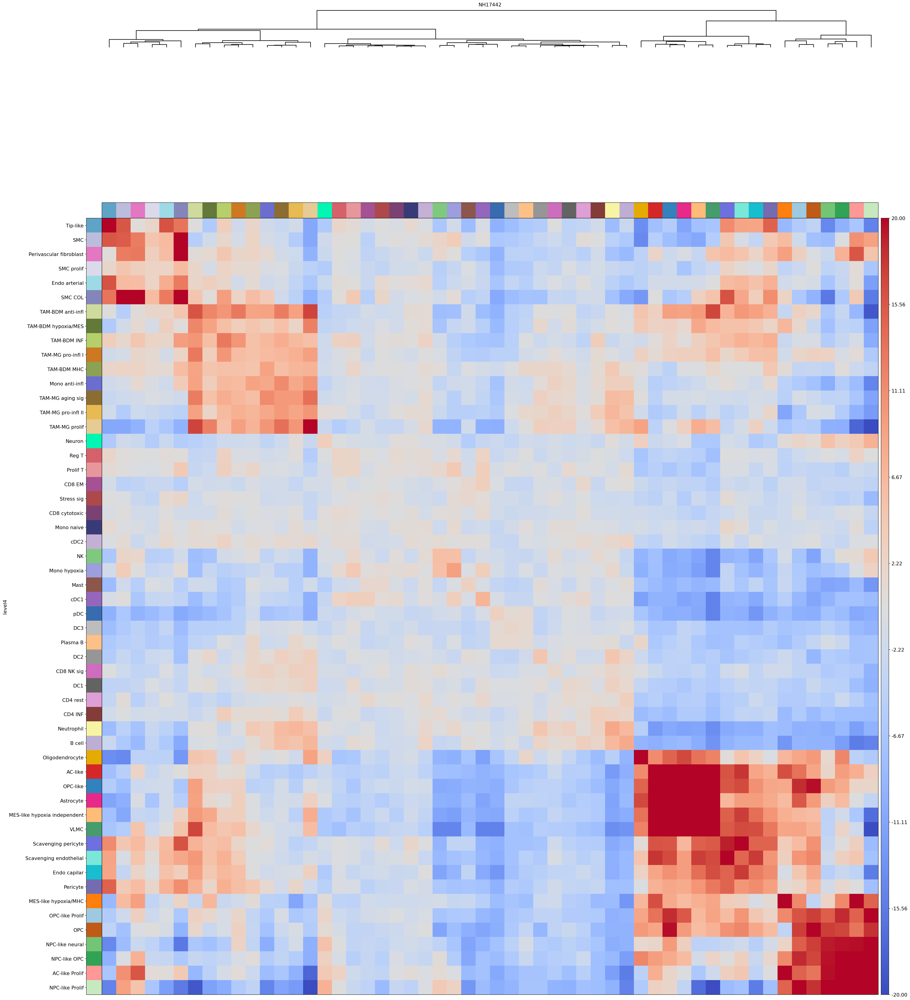

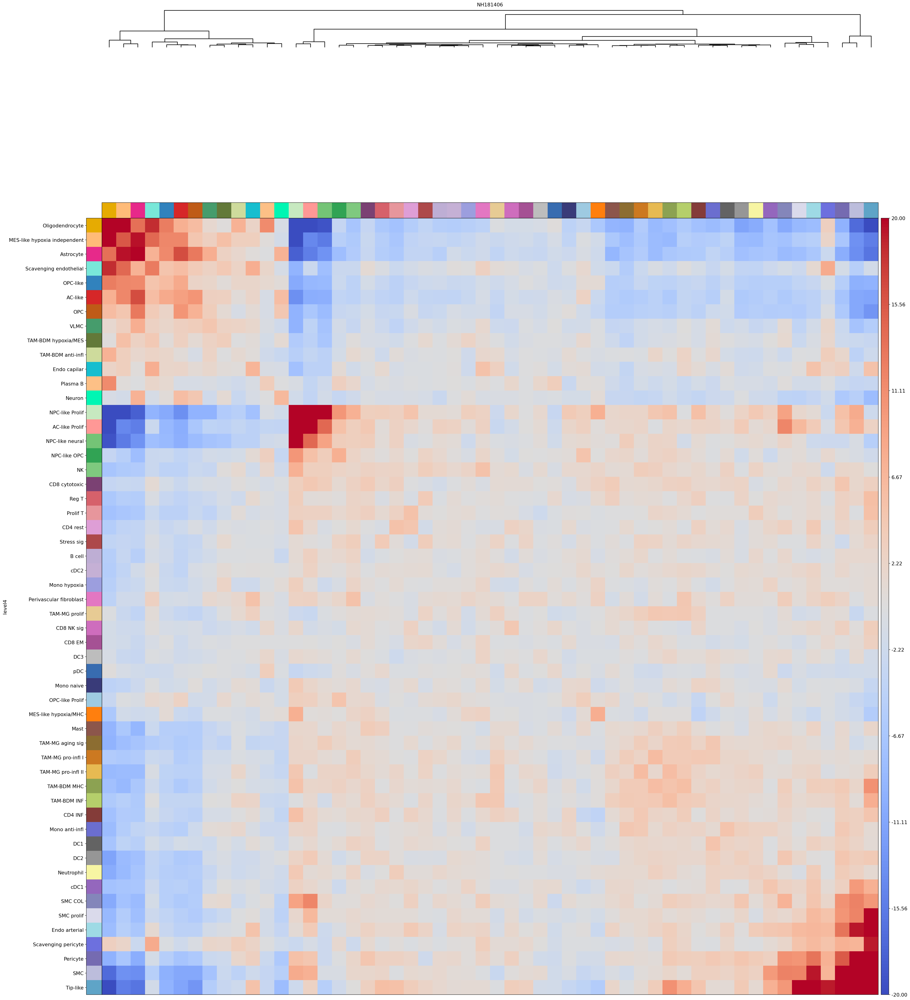

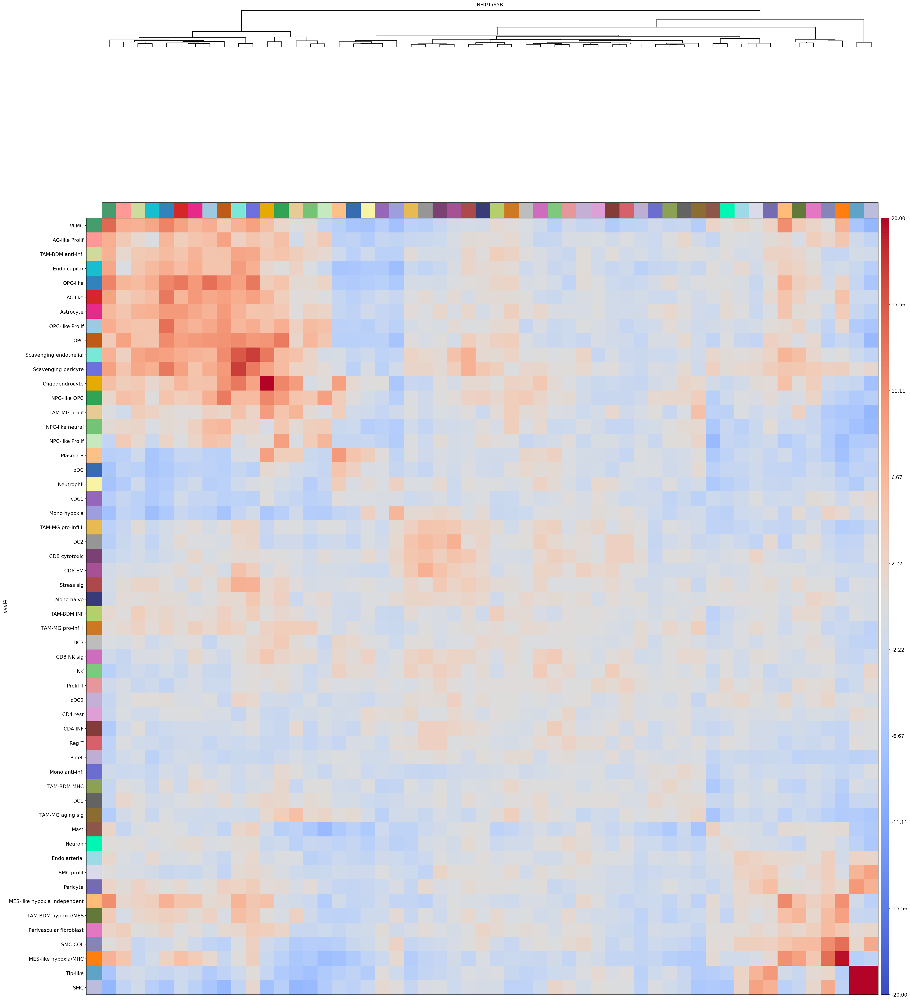

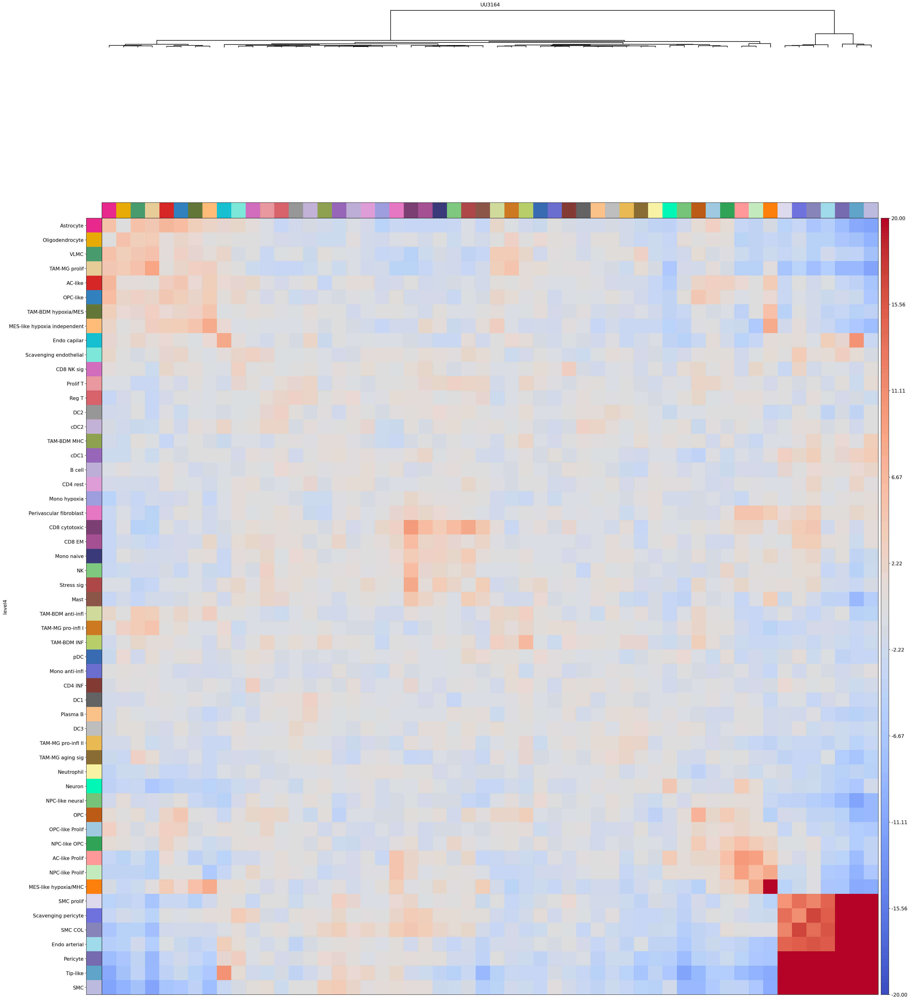

In [175]:
level='level4'
nu=0
allmat=np.zeros([len(np.unique(ad_sp_concat.obs[level])),len(np.unique(ad_sp_concat.obs[level])),len(ad_sp_concat.obs['sample'].unique())])
for samp in ad_sp_concat.obs['sample'].unique():
    adsu=ad_sp_concat[ad_sp_concat.obs['sample']==samp]
    nenrichsub=sq.gr.nhood_enrichment(adsu, cluster_key=level,copy = True)
    sq.gr.nhood_enrichment(adsu, cluster_key=level)
    try:
        allmat[:,:,nu]=nenrichsub[0]
        sq.pl.nhood_enrichment(adsu, cluster_key=level, method="ward",mode='zscore',vmax=20,vmin=-20,cmap='coolwarm',show=False)
        adsu.uns['level3_nhood_enrichment']['zscore']=np.matrix(pd.DataFrame(adsu.uns['level3_nhood_enrichment']['zscore']).fillna(0))
        plt.title(samp)
        plt.savefig(general_path+'/ISS_global_analysis/'+samp+'_nhood_enrichment_'+level+'.pdf')
        nu=nu+1
    except:
        print(samp+' not possible')
    

In [180]:
grouped_cells=pd.DataFrame(index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs['sample']))
for gr in range(0,allmat.shape[0]):
    for smp in range(0,allmat.shape[2]):
        grouped_cells.iloc[gr,smp]=allmat[gr,gr,smp]

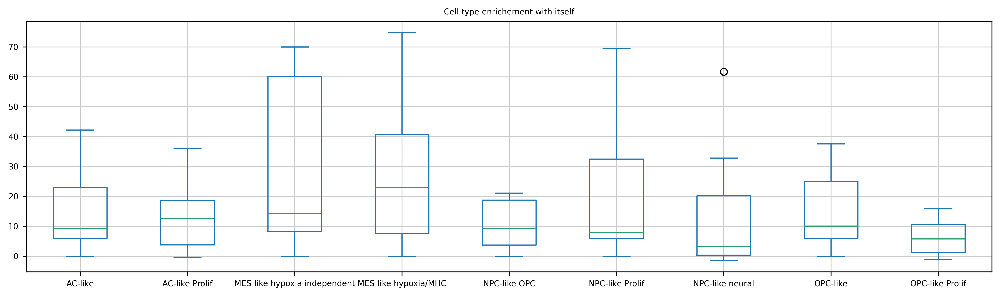

In [188]:
grouped_cells.transpose()[malignant].plot(kind='box',figsize=(15,4))
plt.title('Cell type enrichement with itself')
plt.savefig(general_path+'/ISS_global_analysis/Boxplot_self_enrichment_malignant_'+level+'.pdf')

In [189]:
grouped_cells.transpose().plot(kind='box',figsize=(80,9))
plt.title('Cell type enrichement with itself')
plt.savefig(general_path+'/ISS_global_analysis/Boxplot_self_enrichment_celltype_'+level+'.pdf')

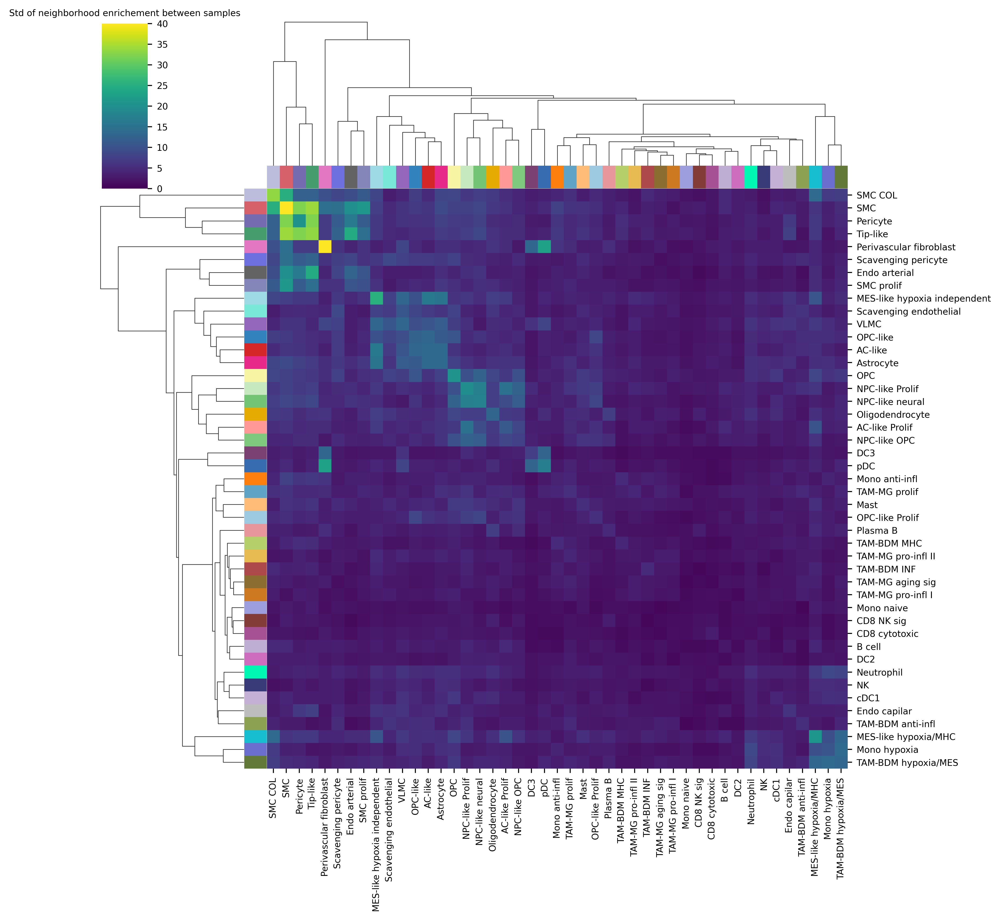

In [179]:
deviation=np.std(allmat,axis=2)#/np.mean(allmat,axis=2)
devi=pd.DataFrame(deviation,index=np.unique(ad_sp_concat.obs[level]),columns=np.unique(ad_sp_concat.obs[level]))
coldic=dict(zip(np.unique(adata.obs[level]),adata.uns[level+'_colors'])) ###modify for other annotations

import matplotlib
sc.set_figure_params(scanpy=True, dpi=200, dpi_save=200, frameon=False, vector_friendly=True, fontsize=7, figsize=(8,8), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(devi.loc[devi.index.isin(nenrich_filt.index),devi.columns.isin(nenrich_filt.index)],vmin=0,vmax=40,cmap='viridis',row_colors=devi.columns.map(coldic),col_colors=devi.columns.map(coldic))
plt.title('Std of neighborhood enrichement between samples')
plt.savefig(general_path+'/ISS_global_analysis/Differences_between_samples_std_nhood_enrichment_'+level+'.pdf')

# Exploring colocalization (no longer neighborhood enirchment)
Neighborhood enrichment plots are very useful, yet they do not represent which cell types  are close to others. For instance, a cell type can be broadly located and, thus, not enirchmed against any other cell tpye. Thus, colocalization info can be very useful to define potential interactions

First we start with yuxtacrine interactions

In [202]:
124*0.325

40.300000000000004

Yuxtacrine requires cell-cell contact. It's difficult to calculate the size of this cells, but according to literature, the cells in the tissue have a radius ranging between 5 and 20 um. We weill consider the upper limit.We are working in this case with coordinates in pixels (1px= 0.325um). Therefore, if considering a radius of 20um, this will be 61.5 in pixel scale.  

In [203]:
anndata_list = []
level='level3'
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    adataneigh2=format_data_radius(adata_copy_int,level,sample,radius=61.5)
    anndata_list.append(adataneigh2)
adata_coloc=sc.concat(anndata_list)
express=pd.DataFrame(adata_coloc.X,columns=adata_coloc.var.index)
binexp=(express>0)*1
binexp.loc[:,'target']=list(adata_coloc.obs[level])
propor=binexp.groupby('target').sum().div(binexp.groupby('target').count().iloc[:,1],axis=0)


100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 30.71it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 58.01it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 113.21it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 491.93it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 295.29it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 203.56it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 544.35it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 86.16it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 123.78it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 37.41it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 224.31it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 165.34it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 143.69it/s]


Text(0.5, 0.98, 'Colocalization at radius 20um, yuxtacrine')

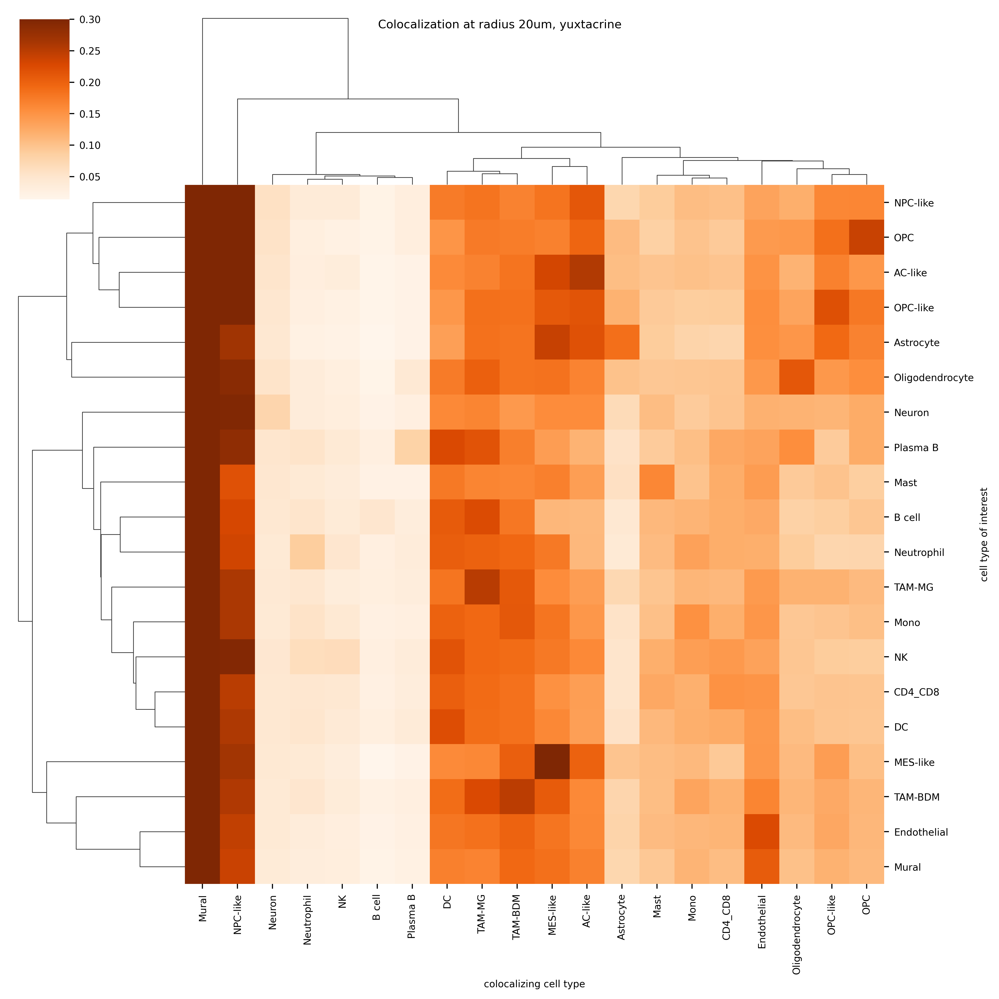

In [204]:
propor.columns.names=['colocalizing cell type']
propor.index.names=['cell type of interest']
g=sns.clustermap(propor[:],cmap='Oranges',vmax=0.3)
g.fig.suptitle('Colocalization at radius 20um, yuxtacrine') 

# now on level test the same, but for level 4

In [206]:
anndata_list = []
level='level4'
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    adataneigh2=format_data_radius(adata_copy_int,level,sample,radius=61.5)
    anndata_list.append(adataneigh2)
adata_coloc=sc.concat(anndata_list)
express=pd.DataFrame(adata_coloc.X,columns=adata_coloc.var.index)
binexp=(express>0)*1
binexp.loc[:,'target']=list(adata_coloc.obs[level])
propor=binexp.groupby('target').sum().div(binexp.groupby('target').count().iloc[:,1],axis=0)


100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 29.97it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 58.30it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 113.85it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 413.19it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 296.78it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 200.82it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 560.78it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 87.67it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 124.35it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 34.40it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 207.94it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 162.23it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 128.01it/s]


In [207]:
propor_yux=propor[:]

Text(0.5, 0.98, 'Colocalization at radius 20um, yuxtacrine')

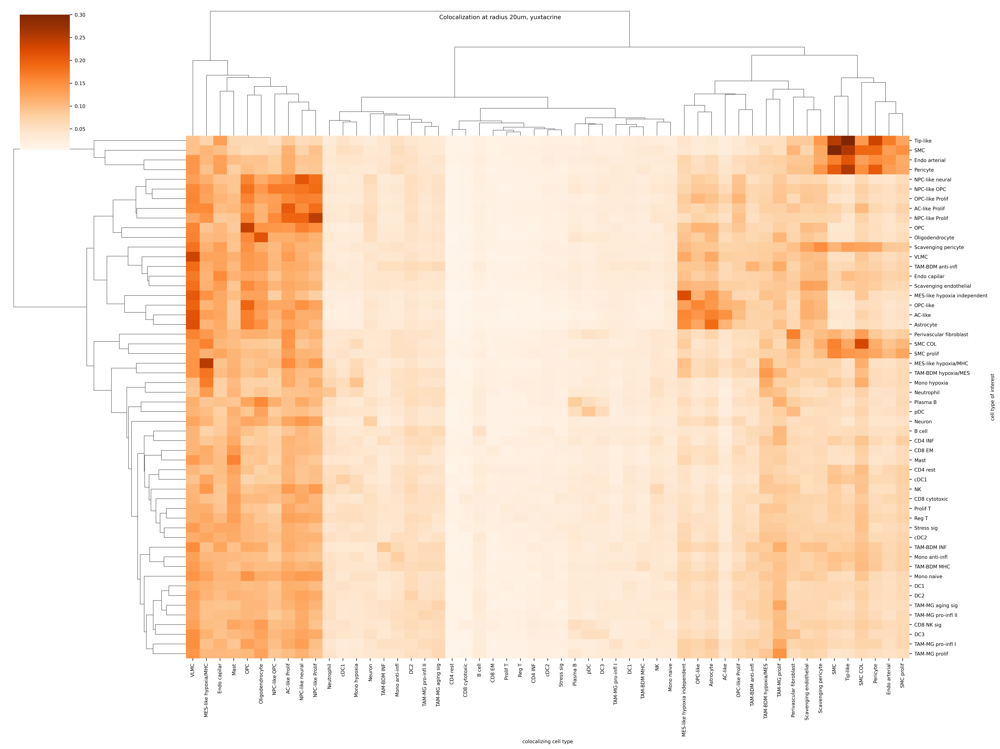

In [208]:
propor.columns.names=['colocalizing cell type']
propor.index.names=['cell type of interest']
g=sns.clustermap(propor[:],cmap='Oranges',vmax=0.3,figsize=(20,15))
g.fig.suptitle('Colocalization at radius 20um, yuxtacrine') 

# Second, we test "paracrine" colocalization, based on a larger radius

In this case, we have used a radius of 100um, which is 307 in pixels

In [210]:
anndata_list = []
level='level4'
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    adataneigh2=format_data_radius(adata_copy_int,level,sample,radius=307)
    anndata_list.append(adataneigh2)
adata_coloc=sc.concat(anndata_list)
express=pd.DataFrame(adata_coloc.X,columns=adata_coloc.var.index)
binexp=(express>0)*1
binexp.loc[:,'target']=list(adata_coloc.obs[level])
propor=binexp.groupby('target').sum().div(binexp.groupby('target').count().iloc[:,1],axis=0)


100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:05<00:00,  9.00it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:02<00:00, 23.93it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 31.48it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 378.62it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 230.40it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 91.02it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 318.73it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:02<00:00, 24.55it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 37.75it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:06<00:00,  8.80it/s]



100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 126.94it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 79.94it/s]



100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 56.62it/s]


Text(0.5, 0.98, 'Colocalization at radius 100um, paracrine')

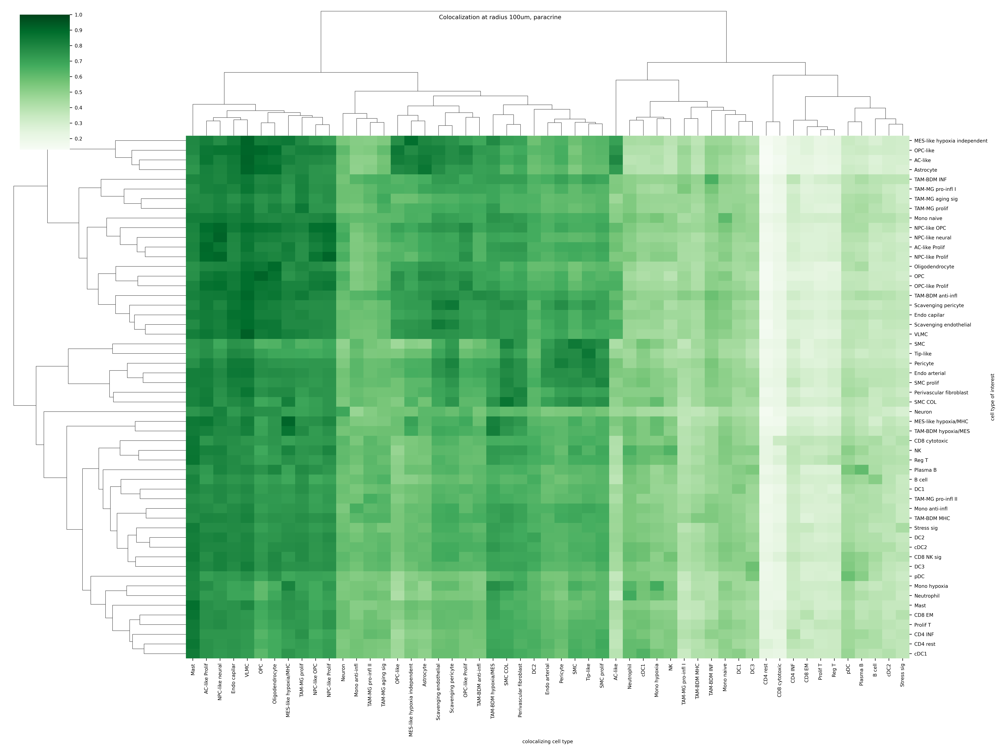

In [211]:
propor.columns.names=['colocalizing cell type']
propor.index.names=['cell type of interest']
g=sns.clustermap(propor[:],cmap='Greens',vmax=1,figsize=(20,15))
g.fig.suptitle('Colocalization at radius 100um, paracrine') 

Now we represen the difference between yux and paracrine, which highlights even more that more or less everything can communicate with everything. Tcells, do to their lower frequency, appear to have lower scores overall

In [212]:
prop_diff=propor-propor_yux

Text(0.5, 0.98, 'Colocalization at radius 100um, paracrine')

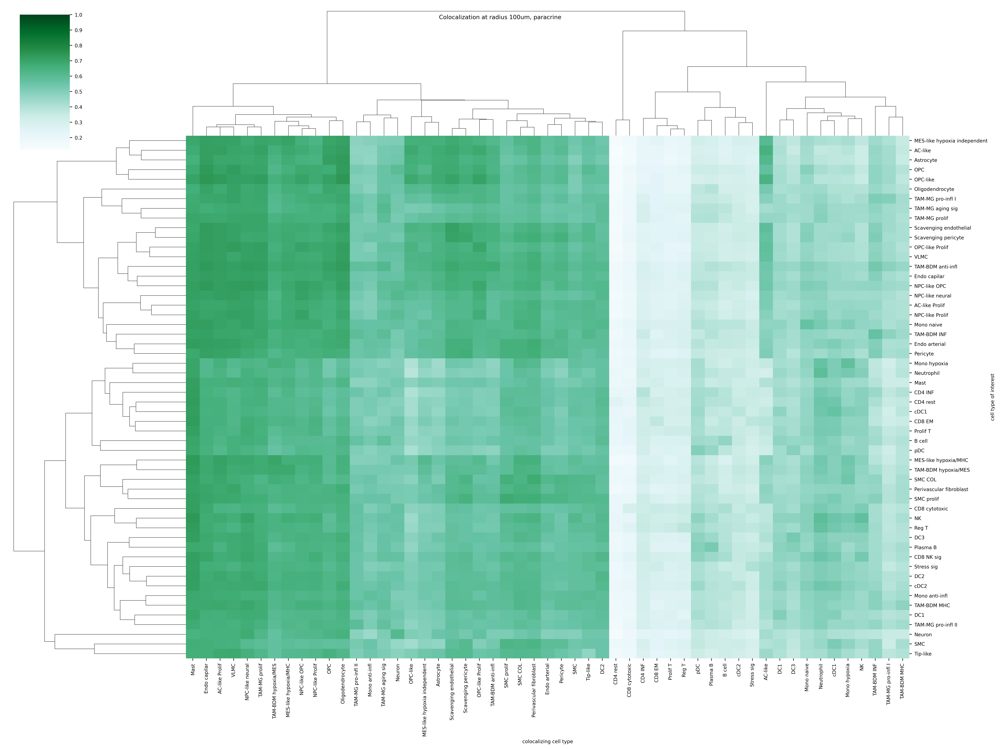

In [213]:
prop_diff.columns.names=['colocalizing cell type']
prop_diff.index.names=['cell type of interest']
g=sns.clustermap(prop_diff[:],cmap='BuGn',vmax=1,figsize=(20,15))
g.fig.suptitle('Colocalization at radius 100um, paracrine') 

# Here we do the same analysis, but considering the 15 closest neighbors

In [214]:
# new binning function using neighbors
def format_data_neighs(adata,sname,condit,neighs=10):
    adata.obsm["spatial"]=np.array([adata.obs.X,adata.obs.Y]).transpose().astype('float64')
    adata_copy_int=adata
    sq.gr.spatial_neighbors(adata_copy_int,n_neighs=neighs)
    result=np.zeros([adata.shape[0],len(adata_copy_int.obs[sname].unique())])
    n=0
    tr=adata_copy_int.obsp['spatial_distances'].transpose()
    tr2=tr>0
    from tqdm import tqdm
    for g in tqdm(adata_copy_int.obs[sname].unique()):
        epv=adata_copy_int.obs[sname]==g*1
        opv=list(epv*1)
        result[:,n]=tr2.dot(opv)
        n=n+1
    expmat=pd.DataFrame(result,columns=adata_copy_int.obs[sname].unique())
    adata1=sc.AnnData(expmat,obs=adata.obs)
    adata1.obs['sample']=condit
    adata1.obs['condition']=condit
    return adata1

In [215]:
anndata_list = []
level='level3'
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    adataneigh2=format_data_neighs(adata_copy_int,level,sample,neighs=15)
    anndata_list.append(adataneigh2)
adata_coloc=sc.concat(anndata_list)
express=pd.DataFrame(adata_coloc.X,columns=adata_coloc.var.index)
binexp=(express>0)*1
binexp.loc[:,'target']=list(adata_coloc.obs[level])
propor=binexp.groupby('target').sum().div(binexp.groupby('target').count().iloc[:,1],axis=0)


100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 25.85it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 47.49it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 91.98it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 367.74it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 257.60it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 166.51it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 484.54it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 73.35it/s]

100%|██████████████████

In [ ]:
sns.clustermap(propor[:])

In [217]:
anndata_list = []
level='level4'
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    adataneigh2=format_data_neighs(adata_copy_int,level,sample,neighs=15)
    anndata_list.append(adataneigh2)
adata_coloc=sc.concat(anndata_list)
express=pd.DataFrame(adata_coloc.X,columns=adata_coloc.var.index)
binexp=(express>0)*1
binexp.loc[:,'target']=list(adata_coloc.obs[level])
propor=binexp.groupby('target').sum().div(binexp.groupby('target').count().iloc[:,1],axis=0)


100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:02<00:00, 25.82it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 47.08it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 89.55it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [00:00<00:00, 439.86it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 250.18it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 170.99it/s]

100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 468.47it/s]

100%|███████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 74.12it/s]

100%|██████████████████

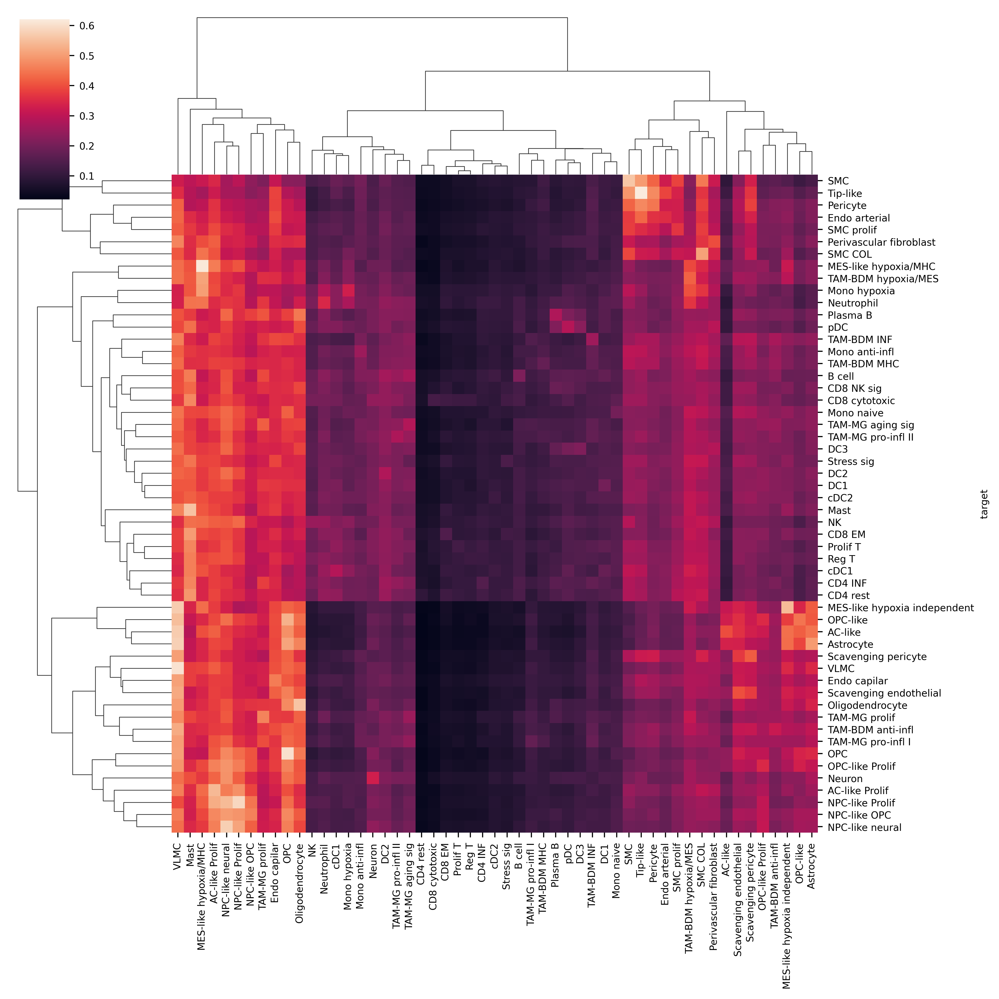

In [218]:
sns.clustermap(propor[:])